# **Bachelor's thesis - Analysis of the dynamics of the development of the COVID-19 epidemic in European countries**
Author: Tomasz Karolewski

Promoter: Ph.D. Krzysztof Gogolewski 

Data source: COVID-19 - Johns Hopkins University


#1. Importing libraries and loading data#
result: europe_df - DataFrame with only European countries 

In [121]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly import subplots
import numpy as np
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from scipy.signal import find_peaks, peak_widths
from yellowbrick.cluster import KElbowVisualizer
from datetime import date
import matplotlib.pyplot as plt

from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, LeaveOneOut
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor, GradientBoostingRegressor, RandomForestRegressor, HistGradientBoostingRegressor
from IPython.display import Image

In [122]:
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}

In [123]:
url1 = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/jhu/new_cases_per_million.csv"
url2 = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/jhu/new_deaths_per_million.csv"

df = pd.read_csv(url1, sep=',')
df = df.set_index("date")
df

,World,Afghanistan,Africa,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,...,Uruguay,Uzbekistan,Vanuatu,Vatican,Venezuela,Vietnam,Wallis and Futuna,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-23,0.013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.020,NaN,NaN,NaN,NaN
2020-01-24,0.036,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN
2020-01-25,0.062,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN
2020-01-26,0.086,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-10,52.946,0.608,0.362,16.536,0.156,0.0,0.0,0.0,0.0,NaN,...,NaN,0.780,0.0,0.0,0.883,0.784,0.0,0.0,12.889,0.0
2023-01-11,63.272,0.827,1.801,0.000,0.134,0.0,0.0,0.0,0.0,NaN,...,NaN,1.040,0.0,0.0,0.813,0.356,0.0,0.0,17.435,0.0
2023-01-12,59.613,0.000,0.209,8.092,0.200,0.0,0.0,0.0,0.0,NaN,...,NaN,1.011,0.0,0.0,0.000,0.896,0.0,0.0,0.550,0.0


In [124]:
countries_in_europe = ['Albania','Andorra','Armenia','Austria','Azerbaijan','Belarus','Belgium',
                       'Bosnia and Herzegovina','Bulgaria','Croatia','Cyprus','Czechia',
                       'Denmark','Estonia','Finland','France','Georgia','Germany','Greece','Hungary',
                       'Iceland','Ireland','Italy','Kazakhstan','Latvia','Liechtenstein','Lithuania',
                       'Luxembourg','North Macedonia','Malta','Moldova','Monaco','Montenegro','Netherlands',
                       'Norway','Poland','Portugal','Romania','Russia','San Marino','Serbia','Slovakia',
                       'Slovenia','Spain','Sweden','Switzerland','Turkey','Ukraine','United Kingdom','Vatican']

len(countries_in_europe)

50

In [125]:
#we select only European countries
europe_df = df[list(countries_in_europe)]
europe_df

,Albania,Andorra,Armenia,Austria,Azerbaijan,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,...,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,Ukraine,United Kingdom,Vatican
date,,,,,,,,,,,,,,,,,,,,,
2020-01-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-10,16.536,0.0,0.0,337.710,6.661,0.0,0.000,10.206,28.458,46.894,...,169.103,48.552,564.664,0.000,0.00,148.505,0.0,0.554,0.000,0.0
2023-01-11,0.000,0.0,0.0,353.930,5.986,0.0,0.000,8.350,18.874,61.285,...,153.823,32.781,378.330,0.000,0.00,NaN,0.0,0.479,0.000,0.0
2023-01-12,8.092,0.0,0.0,257.953,7.723,0.0,335.709,4.948,20.201,45.157,...,148.584,26.225,252.377,0.000,425.05,NaN,0.0,1.083,492.705,0.0


#2. Data cleaning and preprocessing#
Our motivation is to improve the quality of the data before we make any changes to it. Note that the data has blank values and a negative number of new infections.

The first step will be to remove "small countries", or that one with strange reporting system as they may influence our model: Andorra, Kazakhstan, Liechtenstein, Luxembourg, Malta, Monaco, Montenegro, San Marino, Vatican.

The second step is to remove the blank rows and replace all negative values with 0.

The third step is to make rolling average on data from 01.24.2020 to 12.31.2021.


result: europe_df_rolled

In [126]:
#removing countries (and rows with Nans) that doesn't suit our criterias
europe_df_cleaned = europe_df.drop(['Andorra', 'Kazakhstan', 'Liechtenstein', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'San Marino', 'Vatican'], axis=1).dropna(axis=0, how='all').fillna(0)

#changing negative values to 0
for country, value in (europe_df_cleaned < 0).any(axis=0).items():
  if value == True:
    europe_df_cleaned.loc[europe_df_cleaned[country] < 0, country] = 0
europe_df_cleaned

,Albania,Armenia,Austria,Azerbaijan,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,...,Russia,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,Ukraine,United Kingdom
date,,,,,,,,,,,,,,,,,,,,,
2020-01-24,0.000,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.0,0.000,0.000
2020-01-25,0.000,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.0,0.000,0.000
2020-01-26,0.000,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.0,0.000,0.000
2020-01-27,0.000,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.0,0.000,0.000
2020-01-28,0.000,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.0,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-10,16.536,0.0,337.710,6.661,0.0,0.000,10.206,28.458,46.894,0.000,...,20.800,169.103,48.552,564.664,0.000,0.00,148.505,0.0,0.554,0.000
2023-01-11,0.000,0.0,353.930,5.986,0.0,0.000,8.350,18.874,61.285,0.000,...,28.899,153.823,32.781,378.330,0.000,0.00,0.000,0.0,0.479,0.000
2023-01-12,8.092,0.0,257.953,7.723,0.0,335.709,4.948,20.201,45.157,0.000,...,32.008,148.584,26.225,252.377,0.000,425.05,0.000,0.0,1.083,492.705


In [127]:
def rolling_avg(dataframe, window_size):
    return dataframe.rolling(window_size, center=True, min_periods=int(window_size/2)).mean()

In [128]:
#rolling average
europe_df_rolled = rolling_avg(europe_df_cleaned, 14)

d0 = date(2021, 12, 31)
d1 = date.today()
delta = d0 - d1

europe_df_cleaned = europe_df_cleaned[:delta.days+1]

#europe_df_rolled = europe_df_rolled[203:]
europe_df_rolled = europe_df_rolled[:delta.days+1]
europe_df_rolled

,Albania,Armenia,Austria,Azerbaijan,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,...,Russia,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,Ukraine,United Kingdom
date,,,,,,,,,,,,,,,,,,,,,
2020-01-24,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-01-25,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.001750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003750
2020-01-26,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.001556,0.000000,0.000000,0.000000,0.002333,0.010556,0.000000,0.000000,0.000000,0.003333
2020-01-27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.001400,0.000000,0.000000,0.000000,0.002100,0.009500,0.000000,0.000000,0.000000,0.003000
2020-01-28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.001273,0.000000,0.000000,0.000000,0.001909,0.008636,0.000000,0.000000,0.000000,0.010818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,128.366071,35.220143,281.116286,50.760929,124.084786,646.997786,155.535429,260.639143,807.938857,2195.135929,...,158.220714,212.002429,629.009429,606.244429,1260.426071,432.653714,1282.163643,319.458714,124.157857,1982.821071
2021-12-28,125.350429,34.115500,289.242286,48.664571,121.635143,711.655286,136.516000,259.764929,820.982714,2529.077857,...,153.012857,240.744143,626.870429,620.531214,1700.577500,432.653714,1428.935714,341.309643,122.610643,2084.056357
2021-12-29,144.449571,32.908143,302.002500,46.947500,120.459000,824.026143,175.836143,305.779857,874.894929,2899.849786,...,148.128786,271.180214,619.896500,682.564143,1802.635000,637.730643,1531.749714,370.490786,114.708857,2221.268857


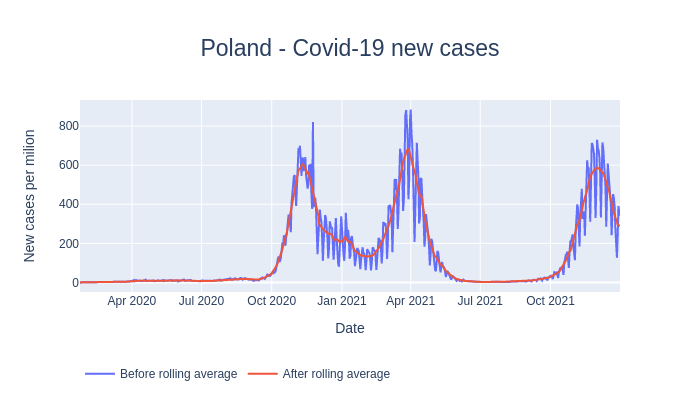

In [129]:
country = 'Poland'

title_dict = dict(
    text= 'Poland - Covid-19 new cases',
    y=0.9,
    x=0.5,
    xanchor= 'center',
    yanchor= 'top',
    font_size=23, 
    font_family='Arial'
)

legend_dict = dict(
    orientation='h',
    y=-0.35,
)

fig = go.Figure()
fig.add_trace(go.Scatter(x=europe_df_cleaned.index, y=europe_df_cleaned[country], name='Before rolling average'))
fig.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='After rolling average'))
fig.update_layout(title=title_dict, height=400, width=700, legend=legend_dict)
fig.update_xaxes(title='Date')
fig.update_yaxes(title='New cases per milion')

Image(fig.to_image())

In [130]:
#plotting line charts before and after moving average
for country in europe_df_cleaned.columns:
  fig = go.Figure()
  fig.add_trace(go.Scatter(x=europe_df_cleaned.index, y=europe_df_cleaned[country], name=f"{country} before rolling average"))
  fig.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=f"{country} after rolling average"))

  Image(fig.to_image())

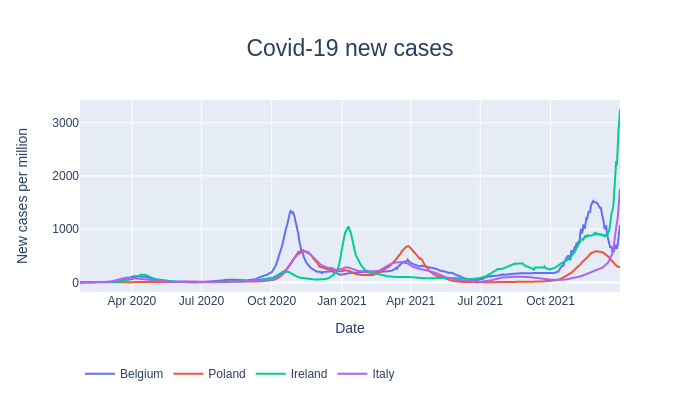

In [131]:
#plotting all traces
title_dict = dict(
    text= 'Covid-19 new cases',
    y=0.9,
    x=0.5,
    xanchor= 'center',
    yanchor= 'top',
    font_size=23, 
    font_family='Arial'
)

legend_dict = dict(
    orientation='h',
    y=-0.35,
)

countries = ['Belgium', 'Poland', 'Ireland', 'Italy']

fig = go.Figure(layout={"xaxis_title":"Date", "yaxis_title":"New cases per million"})
for country in countries:
  fig.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country))
fig.update_layout(title=title_dict, height=400, width=700, legend=legend_dict)

Image(fig.to_image())

#3. Dimension reduction - PCA#

We select key components that describe the space in 95%

result: pca_df

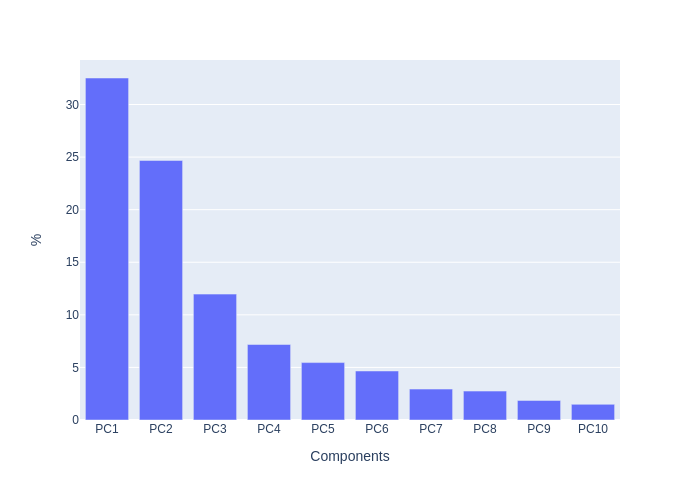

In [132]:
#implementation of pca with 95% coverage
pca = PCA(n_components=0.95)
data = europe_df_rolled.dropna().T

scaled_data = scale(data, axis=0, with_mean=True, with_std=False)
pca_model = pca.fit(scaled_data)

#plotting bar chart that show what percentage of the space describes the component
per_var = np.round_(pca.explained_variance_ratio_*100, decimals=2)
lab = [f'PC{i}' for i in range(1, len(per_var)+1)]

fig = px.bar(x=lab, y=per_var, labels={"x":"Components", "y":"%"})

Image(fig.to_image())

In [133]:
#transforming data
pca_data = pca.transform(scaled_data)
pca_df = pd.DataFrame(pca_data, columns=lab, index=data.index)
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
Albania,-3536.821614,-1241.192094,-577.217622,-839.737336,-771.392577,1170.913048,-303.530168,-535.321625,922.523862,134.854256
Armenia,-2097.957427,-2725.406061,282.822203,1052.833494,903.211543,929.511627,1760.889755,150.723084,-1150.426509,-420.474396
Austria,2012.274440,-1932.165113,-1436.719408,2420.418362,-427.169265,-60.403568,-257.251934,-229.372200,-43.792623,1816.407478
Azerbaijan,-4189.581309,-1211.906410,33.862780,1007.400951,-230.295958,541.946338,-1107.112382,-339.811142,494.827671,-77.671441
Belarus,-3755.090537,-822.811560,-293.737998,-64.756220,-919.061626,771.116705,-683.602199,-810.639650,-138.580745,-347.899530
Belgium,3678.559089,221.130287,-2590.425302,3178.936227,325.503224,207.061511,2051.594385,-838.556190,-939.250083,-887.434255
Bosnia and Herzegovina,-3100.848056,-1584.304951,-1046.448830,150.210566,794.037677,-13.684211,457.279887,260.946827,38.139173,-37.079954
Bulgaria,-1631.398292,-2232.022789,271.201113,267.136913,171.968250,-699.078900,866.092903,265.044301,154.061091,333.112672
Croatia,3403.393460,-1225.719171,648.410273,2373.316438,234.460203,-896.760048,-827.702397,1599.908441,-858.150601,768.405777
Cyprus,817.454923,5604.591225,2114.102101,-1371.153807,3037.414159,-2697.203967,-1072.865190,-1972.153755,-1148.523337,141.482246


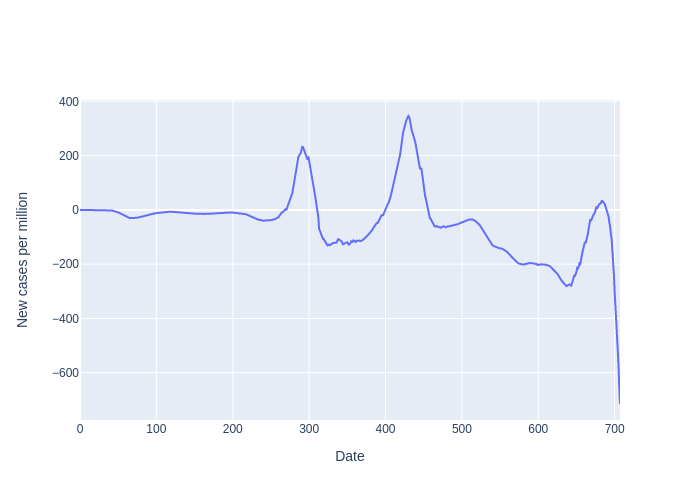

In [134]:
fig = go.Figure(layout={"xaxis_title":"Date", "yaxis_title":"New cases per million"})
tmp = pd.DataFrame(scaled_data, index=data.index)
country = 'Poland' 
fig.add_trace(go.Scatter(x=tmp.T.index, y=tmp.T[country], name=country))

Image(fig.to_image())

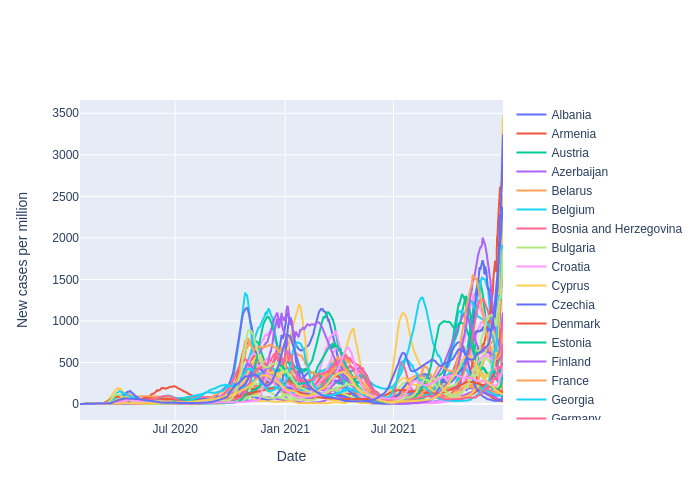

In [135]:
fig = go.Figure(layout={"xaxis_title":"Date", "yaxis_title":"New cases per million"})
tmp = pd.DataFrame(pca_data, index=data.index)
for country in data.index:
  fig.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country))

Image(fig.to_image())

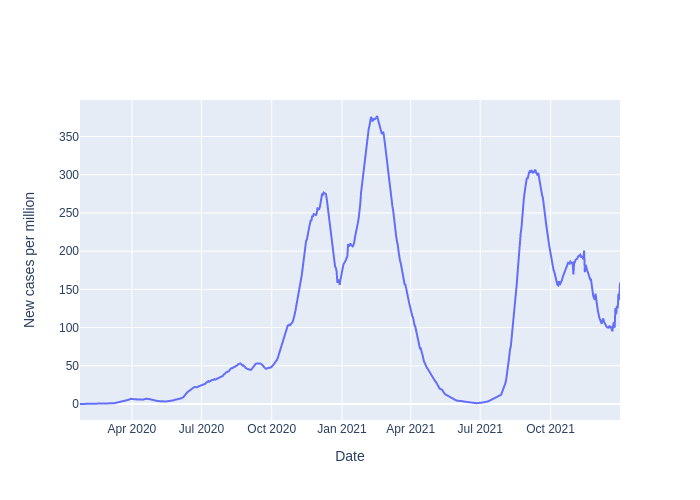

In [136]:
fig = go.Figure(layout={"xaxis_title":"Date", "yaxis_title":"New cases per million"})
country='Albania'
fig.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country))

Image(fig.to_image())

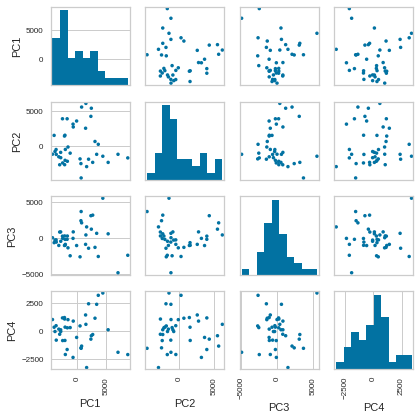

In [137]:
fig = pd.plotting.scatter_matrix(pca_df.iloc[:,:4], alpha=1, figsize=(6, 6), diagonal='hist')
plt.tight_layout()

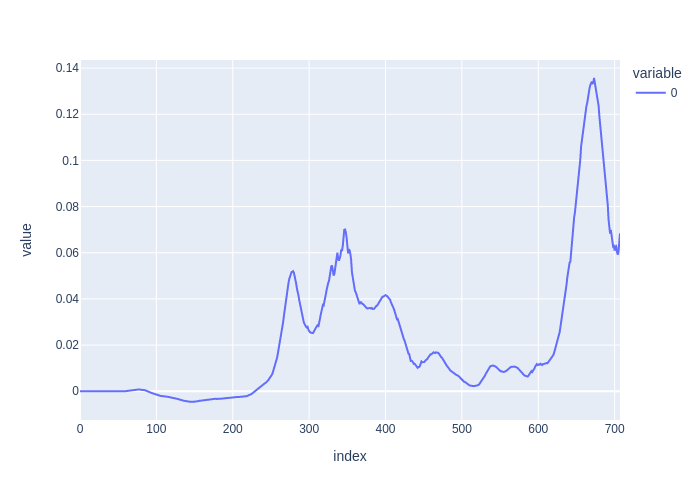

In [138]:
u, s, vt = np.linalg.svd(scaled_data, full_matrices=True)
U = pd.DataFrame(vt)
fig = px.line(U.T[0])

Image(fig.to_image())

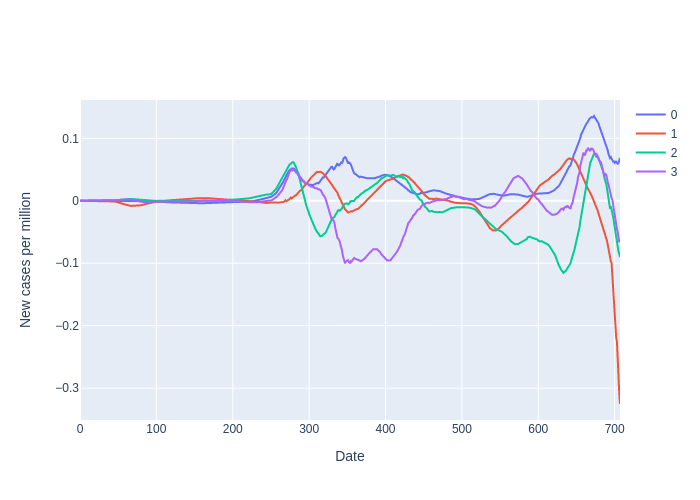

In [139]:
fig = go.Figure(layout={"xaxis_title":"Date", "yaxis_title":"New cases per million"})
tmp = pd.DataFrame(vt)
for country in range(4):
  fig.add_trace(go.Scatter(x=tmp.T.index, y=tmp.T[country], name=country))

Image(fig.to_image())

#4. pca_df clustering
Division of the pandemic in countries into clusters

##a) KMeans##

Overview of divisions depending on the number of clusters

3 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Czechia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovakia', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']


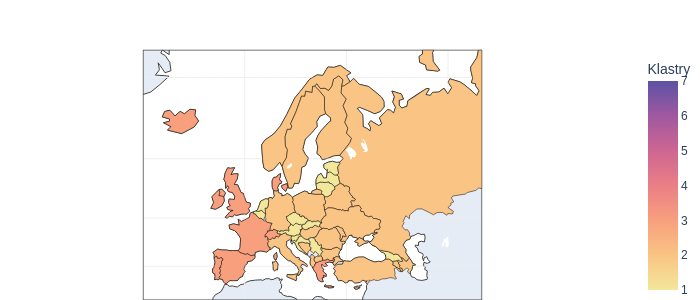

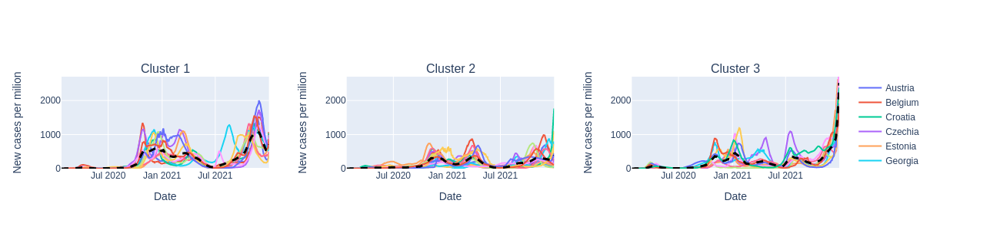



4 clusters: 
Cluster 1: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 4: 
['Austria', 'Belgium', 'Croatia', 'Czechia', 'Georgia', 'Netherlands', 'Slovakia', 'Slovenia']


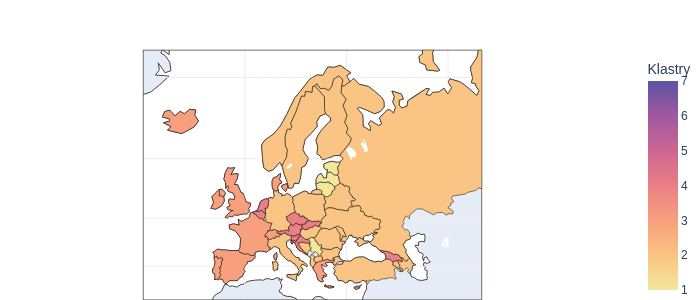

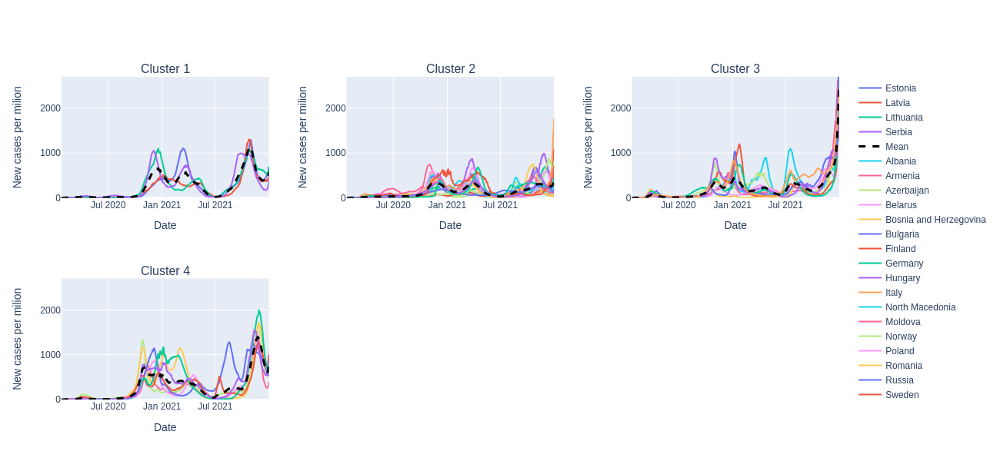



5 clusters: 
Cluster 1: 
['Czechia', 'Slovakia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 4: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


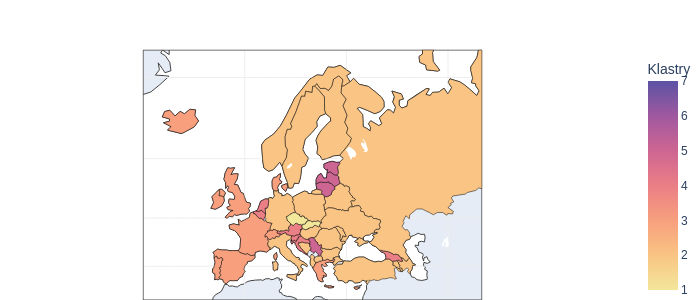

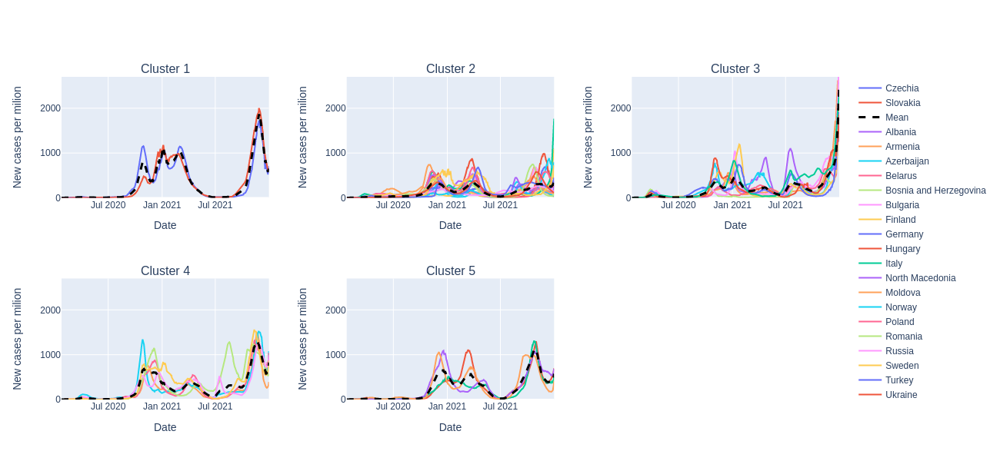



6 clusters: 
Cluster 1: 
['Czechia', 'Slovakia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 4: 
['Austria', 'Belgium', 'Croatia', 'Netherlands', 'Slovenia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 6: 
['Georgia']


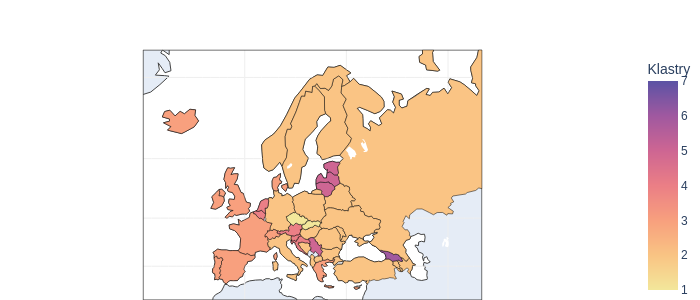

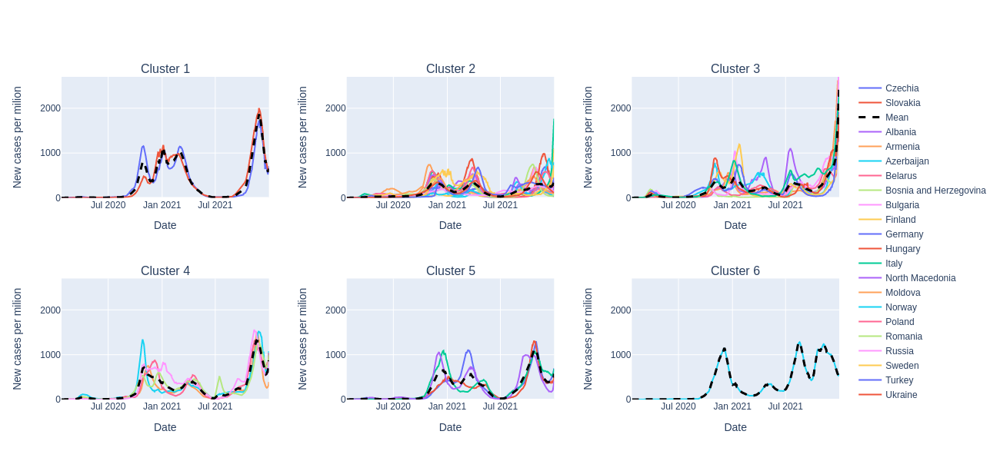



7 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Turkey', 'Ukraine']
Cluster 2: 
['Cyprus', 'Denmark', 'Greece', 'Iceland', 'Ireland', 'United Kingdom']
Cluster 3: 
['Czechia', 'Slovakia']
Cluster 4: 
['Austria', 'Belgium', 'Croatia', 'Hungary', 'Netherlands', 'Slovenia', 'Switzerland']
Cluster 5: 
['Georgia']
Cluster 6: 
['France', 'Italy', 'Portugal', 'Spain', 'Sweden']
Cluster 7: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


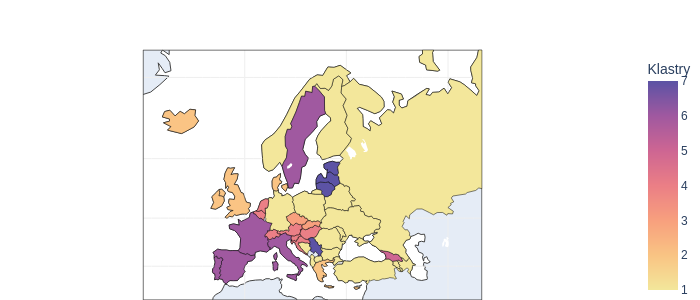

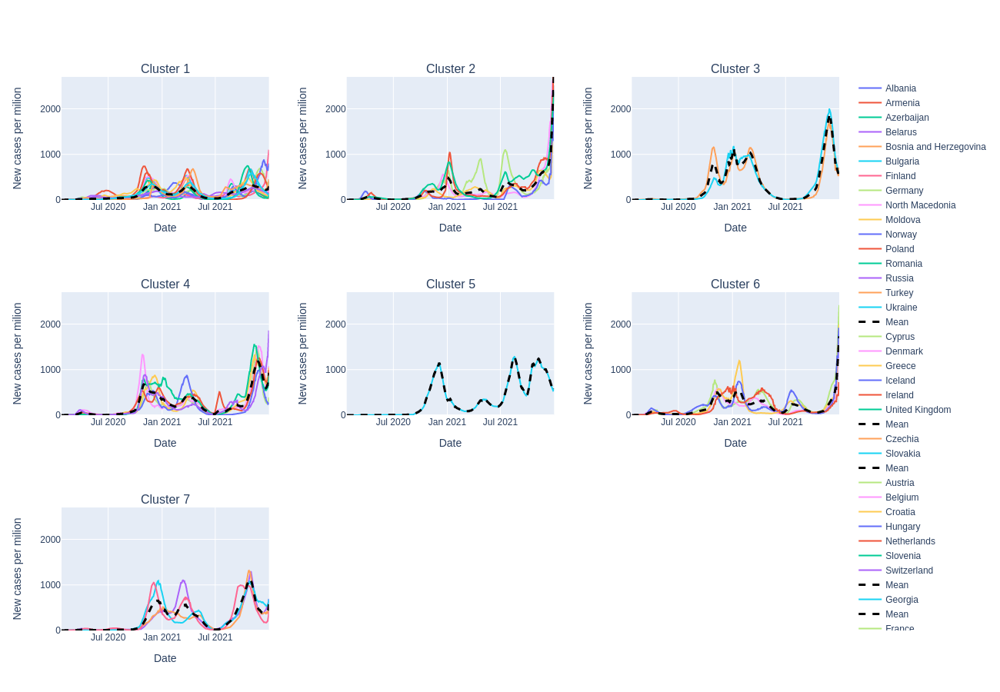

In [140]:
def kmeans_clustering(data):
  #loop responsible for generating 3-7 figures
  for n in range(2, 7):
    print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
    kmeans = KMeans(n_clusters=n+1, random_state=100).fit(data)
    kmeans.labels_

    clusters_list = []
    #loop responsible for creating list of lists of countries splited by clustering and printing them
    for iterator in range(n+1):
      print(f"Cluster {iterator+1}: ")
      cluster_list = []
      for iterator2, country in enumerate(data.index):
        if kmeans.labels_[iterator2] == iterator:
          cluster_list.append(country)
      print(cluster_list, end="\n")
      clusters_list.append(cluster_list)


    #setting choropleth parameters
    config = dict(
      type = 'choropleth',
      locations = data.index.values,
      locationmode='country names',
      z=np.append(kmeans.labels_+1, 7),
      colorscale='sunset',
      marker_line_color='black',
      marker_line_width=0.5,
      colorbar_title = 'Klastry')

    #plotting first part of the figure
    fig = go.Figure(data=[config])
    fig.update_geos(scope="world", lataxis_showgrid=True, lonaxis_showgrid=True, projection_type="mercator", lataxis_range=[40,75], lonaxis_range=[-30, 70])
    fig.update_layout(height=300, margin={"r":0,"t":50,"l":0,"b":0})
    display(Image(fig.to_image()))

    #plotting second part of the figure
    fig2 = subplots.make_subplots(rows=int(n/3)+1, cols=3, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], horizontal_spacing = 0.1, column_widths=[900, 900, 900])
    for iterator, cluster in enumerate(clusters_list):
      #calculating mean for each cluster
      frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                          columns=['Mean'], index=europe_df_rolled.index)
      for country in cluster:
        fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country), row=int(iterator/3)+1, col=iterator%3 +1)
        fig2.update_xaxes(title_text="Date", row=int(iterator/3)+1, col=iterator%3 +1)
        fig2.update_yaxes(title_text="New cases per milion", row=int(iterator/3)+1, col=iterator%3 +1, range=[0,2700])
        
      #adding trace of mean
      fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', line=dict(color='black', width=3, dash='dash')), row=int(iterator/3)+1, col=iterator%3 +1)

        
    fig2.update_layout(height=(int(n/3)+1)*300, width=1300) 
    display(Image(fig2.to_image()))

    print("\n")

kmeans_clustering(pca_df)

##b) KHierarchy##

Overview of divisions depending on the number of clusters
**works better than KMeans**

3 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Czechia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovakia', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']


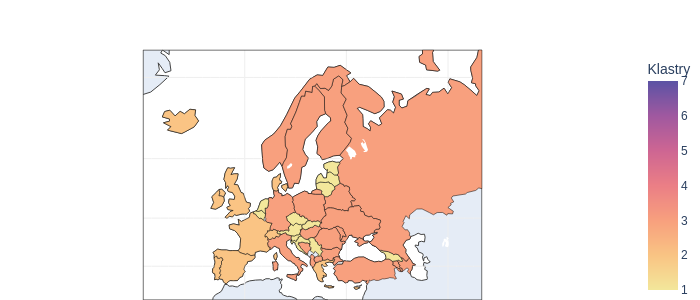

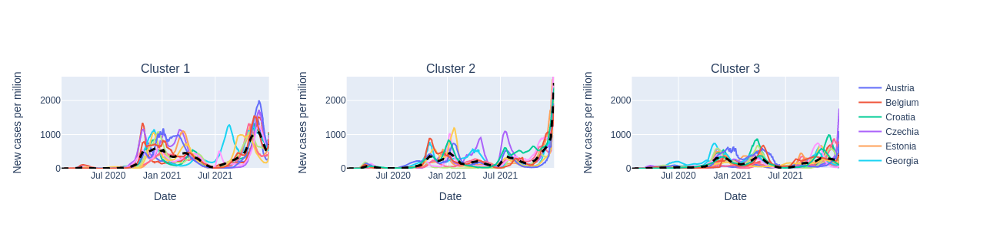



4 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']


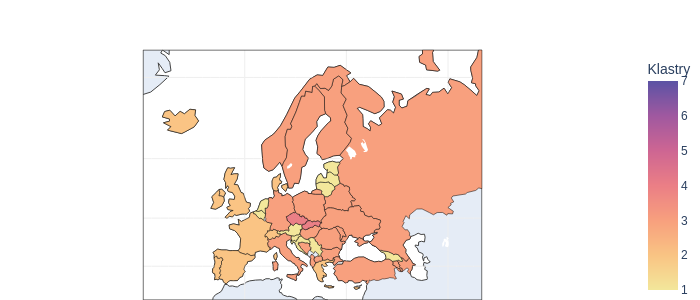

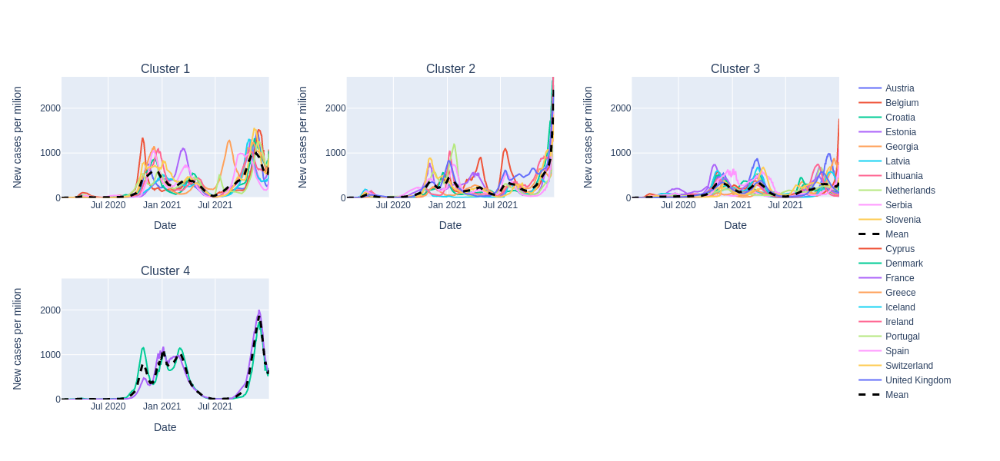



5 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


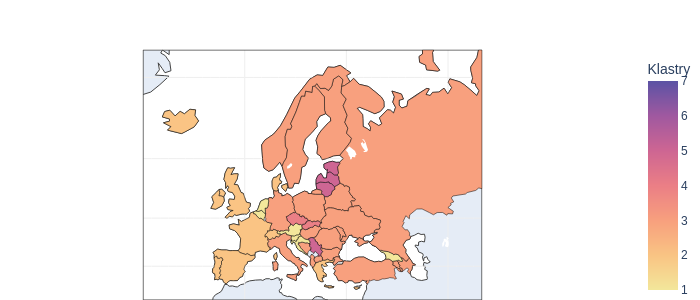

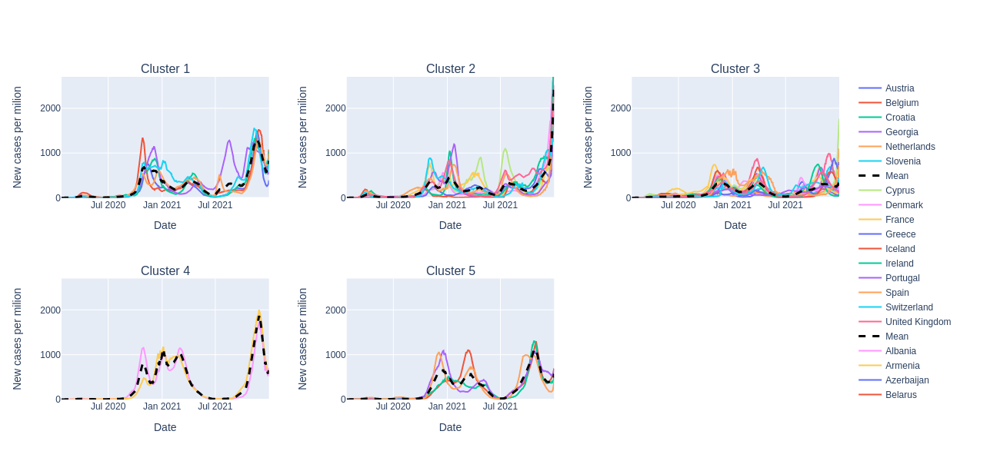



6 clusters: 
Cluster 1: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 2: 
['Austria', 'Belgium', 'Croatia', 'Netherlands', 'Slovenia']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 6: 
['Georgia']


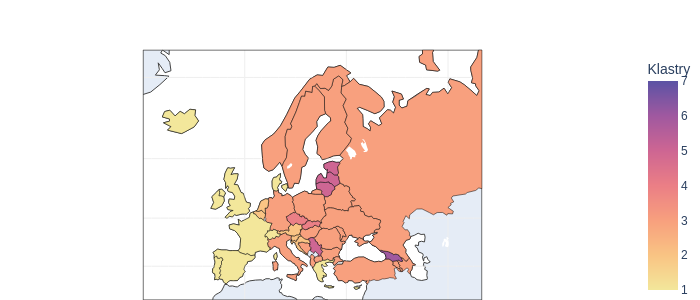

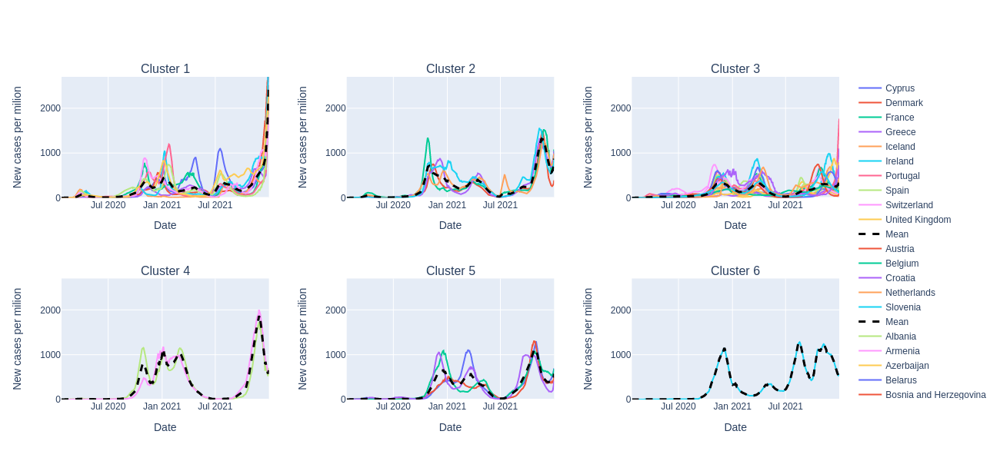



7 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 2: 
['Austria', 'Belgium', 'Croatia', 'Netherlands', 'Slovenia']
Cluster 3: 
['Cyprus', 'Denmark', 'Ireland', 'United Kingdom']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 6: 
['Georgia']
Cluster 7: 
['France', 'Greece', 'Iceland', 'Portugal', 'Spain', 'Switzerland']


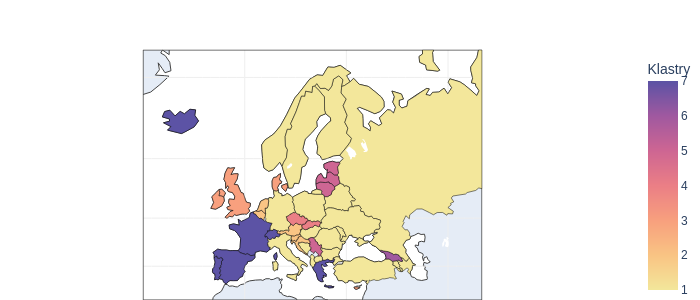

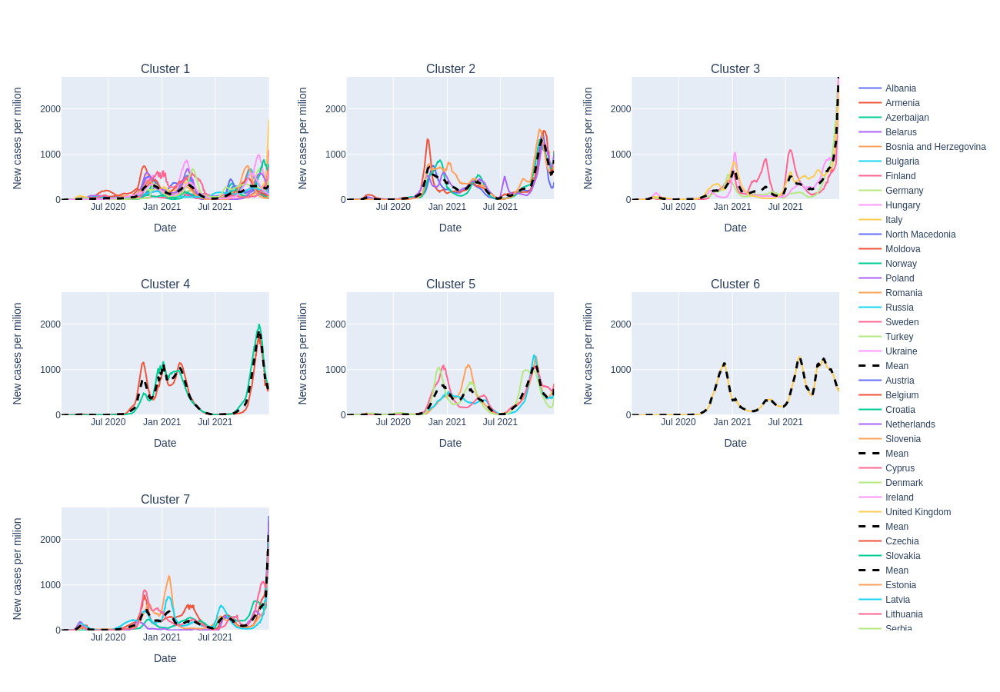

In [141]:
def khierarchy_clustering(data):
  #loop responsible for generating 3-7 figures
  for n in range(2, 7):
    print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
    hierarchy = AgglomerativeClustering(n_clusters=n+1, linkage='ward', affinity='euclidean').fit(data)
    hierarchy.labels_

    clusters_list = []
    #loop responsible for creating list of lists of countries splited by clustering and printing them
    for iterator in range(n+1):
      print(f"Cluster {iterator+1}: ")
      cluster_list = []
      for iterator2, country in enumerate(data.index):
        if hierarchy.labels_[iterator2] == iterator:
          cluster_list.append(country)
      print(cluster_list, end="\n")
      clusters_list.append(cluster_list)


    #setting choropleth parameters
    config = dict(
      type = 'choropleth',
      locations = data.index.values,
      locationmode='country names',
      z=np.append(hierarchy.labels_+1, 7),
      colorscale='sunset',
      marker_line_color='black',
      marker_line_width=0.5,
      colorbar_title = 'Klastry')

    #plotting first part of the figure
    fig = go.Figure(data=[config])
    fig.update_geos(scope="world", lataxis_showgrid=True, lonaxis_showgrid=True,
                    projection_type="mercator", lataxis_range=[40,75], lonaxis_range=[-30, 70])
    fig.update_layout(height=300, margin={"r":0,"t":50,"l":0,"b":0})
    display(Image(fig.to_image()))

    #plotting second part of the figure
    fig2 = subplots.make_subplots(rows=int(n/3)+1, cols=3, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], horizontal_spacing = 0.1, column_widths=[900, 900, 900])
    for iterator, cluster in enumerate(clusters_list):
      #calculating mean for each cluster
      frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), columns=['Mean'], index=europe_df_rolled.index)
      for country in cluster:
        fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country), 
                      row=int(iterator/3)+1, col=iterator%3 +1)
        fig2.update_xaxes(title_text="Date", row=int(iterator/3)+1, col=iterator%3 +1)
        fig2.update_yaxes(title_text="New cases per milion", row=int(iterator/3)+1, col=iterator%3 +1, range=[0,2700])

      #adding trace of mean
      fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', line=dict(color='black', width=3, dash='dash')), row=int(iterator/3)+1, col=iterator%3 +1)

    fig2.update_layout(height=(int(n/3)+1)*300, width=1300) 
    display(Image(fig2.to_image()))
    
    print("\n")
khierarchy_clustering(data)

##c) Selection of the number of clusters
The most optimal number of clusters for KMeans is 3, while for Hclust it is 4

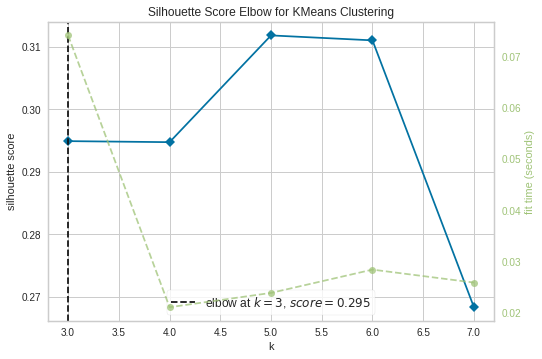

In [142]:
#Silhouette Score for K means
model = KMeans(random_state=100)

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True)
visualizer.fit(pca_df)
visualizer.show()

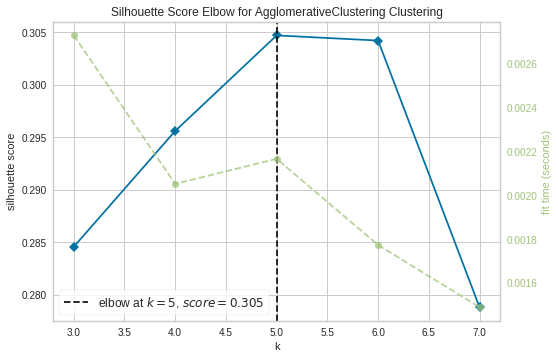

In [143]:
#Silhouette Score for Hierarchical clustering
model = AgglomerativeClustering(linkage='ward', affinity='euclidean')

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True)
visualizer.fit(pca_df)        
visualizer.show()

#5. Waves extraction#
The motivation is to isolate the waves of the pandemic and re-clusters on them

result: waves_df, train_df, predict_df, validate_df

In [144]:
#function to help me save data about waves
def create_wave_df_column(country, real_height, left_side_base, right_side_base, left_x, left_y):

  wave_data = pd.DataFrame(columns=[country])
  train_data = pd.DataFrame(columns=[country])
  predict_data = pd.DataFrame(columns=[country])
  validate_data = pd.DataFrame(columns=[country])

  #adding height rows
  for iterator, item in enumerate(real_height):
    new_row = pd.Series(data={country:item}, name=f"height{iterator}")
    wave_data = wave_data.append(new_row, ignore_index=False)
    if iterator + 1 == len(real_height):
      new_row = pd.Series(data={country:item}, name=f"height")
      predict_data = predict_data.append(new_row, ignore_index=False)
    else: 
      train_data = train_data.append(new_row, ignore_index=False)
    if iterator + 2 == len(real_height):
      new_row = pd.Series(data={country:item}, name=f"height")
      validate_data = validate_data.append(new_row, ignore_index=False)
  
  #adding left base rows
  for iterator, item in enumerate(left_side_base):
    new_row = pd.Series(data={country:item}, name=f"left_base{iterator}")
    wave_data = wave_data.append(new_row, ignore_index=False)
    if iterator + 1 == len(left_side_base):
      new_row = pd.Series(data={country:item}, name=f"left_base")
      predict_data = predict_data.append(new_row, ignore_index=False)
    else: 
      train_data = train_data.append(new_row, ignore_index=False)
    if iterator + 2 == len(left_side_base):
      new_row = pd.Series(data={country:item}, name=f"left_base")
      validate_data = validate_data.append(new_row, ignore_index=False)

  #adding right base rows
  for iterator, item in enumerate(right_side_base):
    new_row = pd.Series(data={country:item}, name=f"right_base{iterator}")
    wave_data = wave_data.append(new_row, ignore_index=False)
    train_data = train_data.append(new_row, ignore_index=False)

  #adding left point x
  for iterator, item in enumerate(left_x):
    new_row = pd.Series(data={country:item}, name=f"left_x{iterator}")
    wave_data = wave_data.append(new_row, ignore_index=False)
    if iterator + 1 == len(left_x):
      new_row = pd.Series(data={country:item}, name=f"left_x")
      predict_data = predict_data.append(new_row, ignore_index=False)
    else: 
      train_data = train_data.append(new_row, ignore_index=False)
    if iterator + 2 == len(left_x):
      new_row = pd.Series(data={country:item}, name=f"left_x")
      validate_data = validate_data.append(new_row, ignore_index=False)

  #adding left point y
  for iterator, item in enumerate(left_y):
    new_row = pd.Series(data={country:item}, name=f"left_y{iterator}")
    wave_data = wave_data.append(new_row, ignore_index=False)
    if iterator + 1 == len(left_y):
      new_row = pd.Series(data={country:item}, name=f"left_y")
      predict_data = predict_data.append(new_row, ignore_index=False)
    else: 
      train_data = train_data.append(new_row, ignore_index=False)
    if iterator + 2 == len(left_y):
      new_row = pd.Series(data={country:item}, name=f"left_y")
      validate_data = validate_data.append(new_row, ignore_index=False)

  return wave_data, train_data, predict_data, validate_data

In [145]:
#test
tmp1, train_tmp, pred_tmp, val_tmp = create_wave_df_column('Poland', ['20', '30'], [17, 19, 30], [27, 67], [4], [5])
#tmp2 = create_wave_df_column('Holand', ['20', '30', '46'], [76, 5], [56, 78], [6], [7])
#pd.merge(left=tmp1, right=tmp2, how="outer", left_index=True, right_index=True, sort=False)
pred_tmp

,Poland
height,30
left_base,30
left_x,4
left_y,5




 peaks before removing subpeaks:  [319 389 596 660]
 subpeaks indexes:  [0, 3]
 peaks:  [389 596]
 left angles:  [67.33790474 75.8628694 ]
 right angles:  [79.60767563]


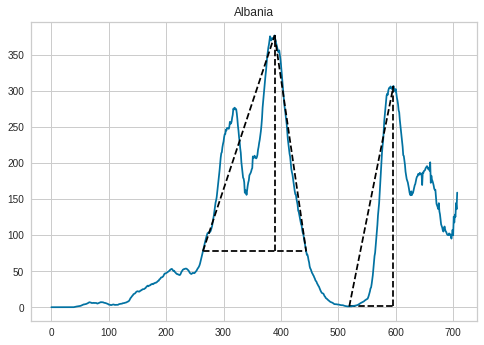



 peaks before removing subpeaks:  [158 280 430 639]
 subpeaks indexes:  []
 peaks:  [158 280 430 639]
 left angles:  [72.73655613 85.0531286  79.49292912 79.12609497]
 right angles:  [70.40619187 81.87960302 79.04988796]


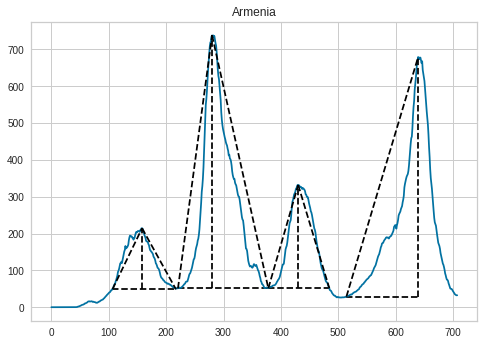



 peaks before removing subpeaks:  [ 64 294 427 667]
 subpeaks indexes:  []
 peaks:  [ 64 294 427 667]
 left angles:  [73.83542121 87.32332675 76.41855754 85.06313855]
 right angles:  [48.53363974 82.18040782 78.0404728 ]


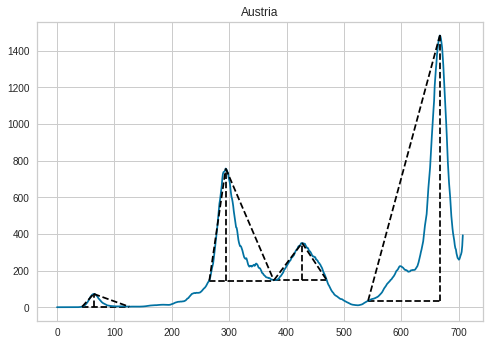



 peaks before removing subpeaks:  [159 319 443 579 647]
 subpeaks indexes:  [4]
 peaks:  [159 319 443 579]
 left angles:  [41.68404255 80.45746227 71.69451837 84.80924475]
 right angles:  [25.66282768 81.32532421 74.97632166]


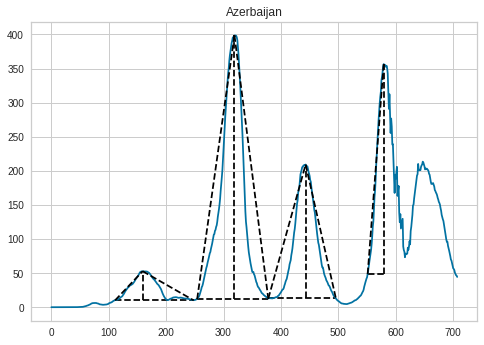



 peaks before removing subpeaks:  [116 328 634]
 subpeaks indexes:  []
 peaks:  [116 328 634]
 left angles:  [63.34678756 67.27743888 50.49056479]
 right angles:  [48.23580361 46.98198731]


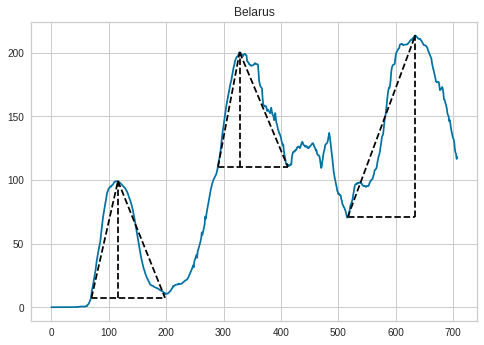



 peaks before removing subpeaks:  [ 76 276 429 672]
 subpeaks indexes:  []
 peaks:  [ 76 276 429 672]
 left angles:  [75.62172801 88.52957518 72.89100347 84.97469219]
 right angles:  [59.12478886 86.84969583 77.55688277]


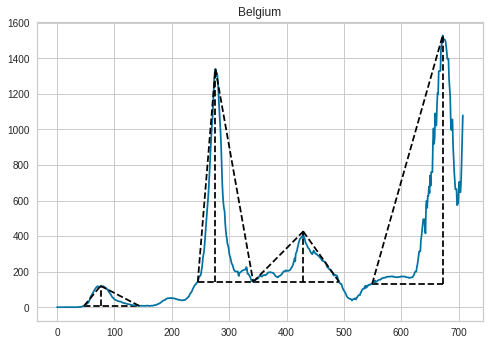



 peaks before removing subpeaks:  [285 429 660]
 subpeaks indexes:  []
 peaks:  [285 429 660]
 left angles:  [85.67894085 81.93038127 62.63491791]
 right angles:  [78.00577018 83.79205423]


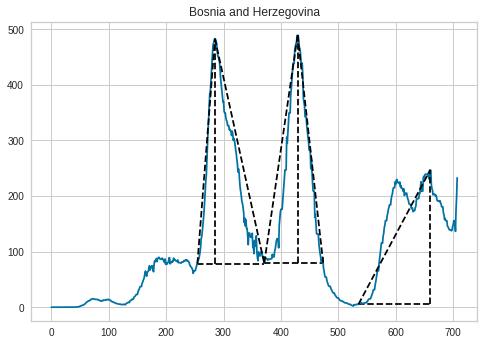



 peaks before removing subpeaks:  [297 426 643 706]
 subpeaks indexes:  [3]
 peaks:  [297 426 643]
 left angles:  [84.90325421 81.87775513 80.38587804]
 right angles:  [81.80966945 83.54021295]


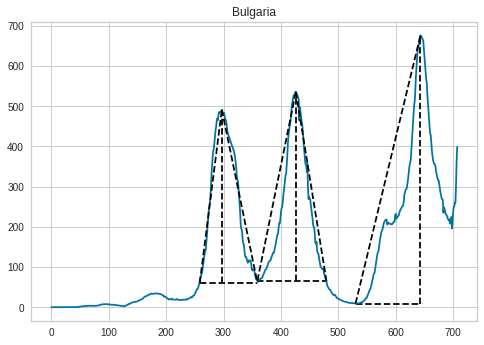



 peaks before removing subpeaks:  [318 447 658]
 subpeaks indexes:  []
 peaks:  [318 447 658]
 left angles:  [85.59507713 82.79449295 84.54415283]
 right angles:  [84.97253582 84.7724966 ]


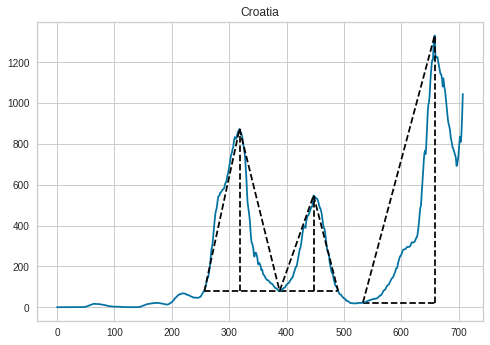



 peaks before removing subpeaks:  [347 457 541 706]
 subpeaks indexes:  []
 peaks:  [347 457 541 706]
 left angles:  [81.72647743 85.07250066 88.41529369 88.41305378]
 right angles:  [85.49846547 87.920896   85.52820774]


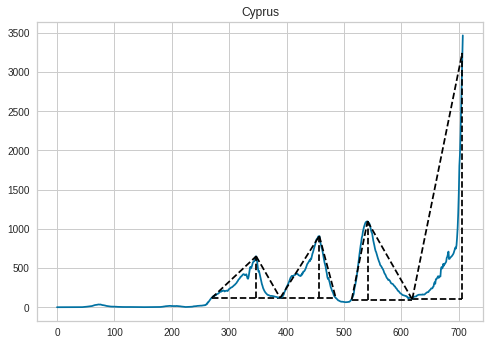



 peaks before removing subpeaks:  [279 402 673]
 subpeaks indexes:  []
 peaks:  [279 402 673]
 left angles:  [88.21539275 83.76266536 86.06101407]
 right angles:  [87.65049905 86.82761559]


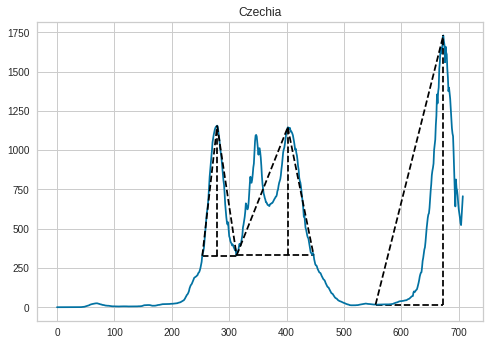



 peaks before removing subpeaks:  [ 72 328 475 572 706]
 subpeaks indexes:  []
 peaks:  [ 72 328 475 572 706]
 left angles:  [53.32386819 82.36582513 50.93375007 67.61386159 87.90533292]
 right angles:  [25.48635958 83.37305723 74.30977007 74.21748329]


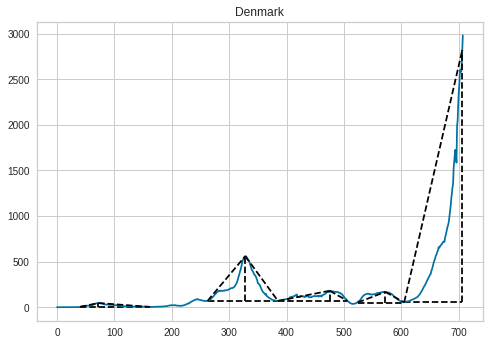



 peaks before removing subpeaks:  [ 69 346 414 645 706]
 subpeaks indexes:  [1, 4]
 peaks:  [ 69 414 645]
 left angles:  [55.07315809 82.70549282 84.3933072 ]
 right angles:  [26.30801079 85.84341318]


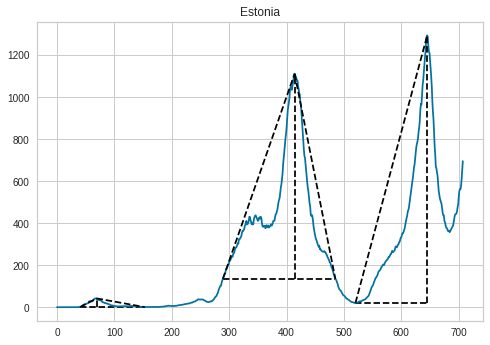



 peaks before removing subpeaks:  [314 415 563 706]
 subpeaks indexes:  [0]
 peaks:  [415 563 706]
 left angles:  [34.33070948 72.93408502 83.91759591]
 right angles:  [63.43563423 55.28234453]


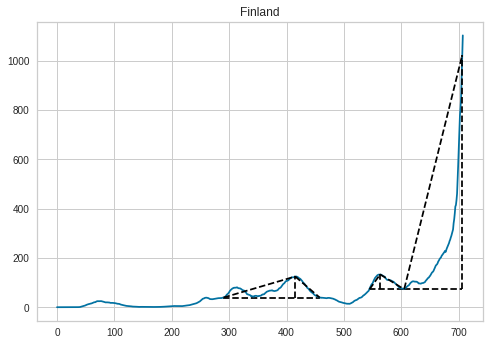



 peaks before removing subpeaks:  [ 82 283 430 564 706]
 subpeaks indexes:  []
 peaks:  [ 82 283 430 564 706]
 left angles:  [71.78196329 86.00677207 73.92136807 83.66473058 87.79105399]
 right angles:  [72.01228591 87.33452787 82.79809592 78.57188972]


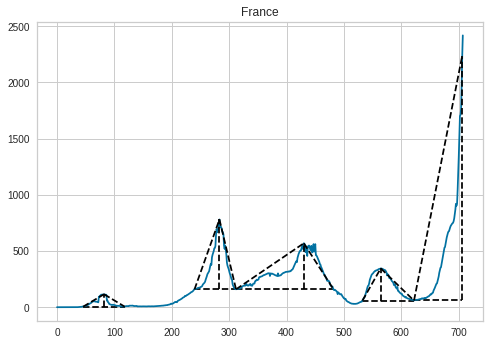



 peaks before removing subpeaks:  [315 474 572 654]
 subpeaks indexes:  []
 peaks:  [315 474 572 654]
 left angles:  [86.35471983 79.11326038 87.84144143 87.02432859]
 right angles:  [85.26187947 77.5316294  87.34877956]


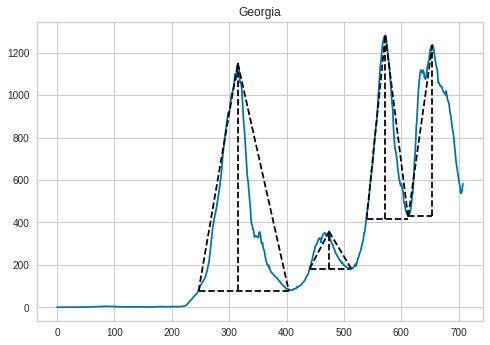



 peaks before removing subpeaks:  [ 66 329 451 674]
 subpeaks indexes:  []
 peaks:  [ 66 329 451 674]
 left angles:  [70.47643156 73.99880606 68.82055484 79.38256666]
 right angles:  [39.9346871  74.12719004 78.86476959]


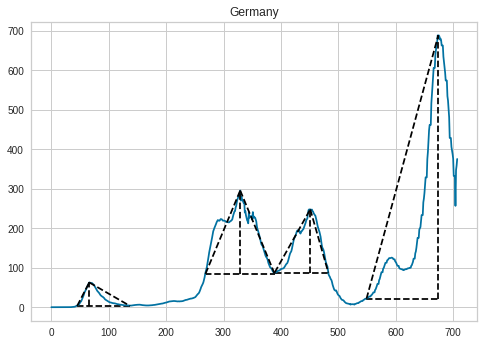



 peaks before removing subpeaks:  [295 435 572 706]
 subpeaks indexes:  []
 peaks:  [295 435 572 706]
 left angles:  [81.88330511 72.80637774 71.18724081 87.54415992]
 right angles:  [71.26618196 72.46505335 69.10729925]


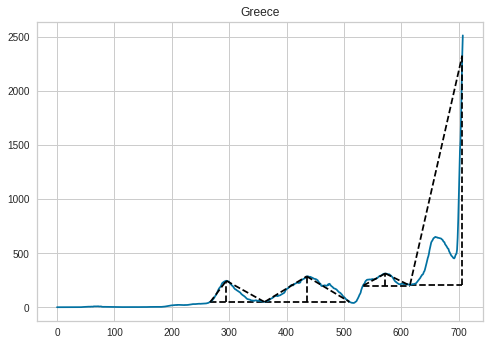



 peaks before removing subpeaks:  [312 427 671]
 subpeaks indexes:  []
 peaks:  [312 427 671]
 left angles:  [83.48036941 85.44941749 83.38051751]
 right angles:  [82.96903723 86.67700365]


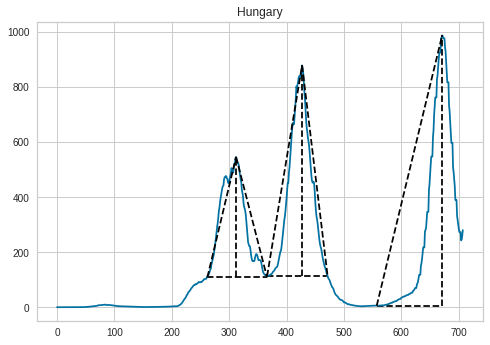



 peaks before removing subpeaks:  [ 63 262 557 706]
 subpeaks indexes:  []
 peaks:  [ 63 262 557 706]
 left angles:  [80.25557497 69.12040172 86.02577322 87.29684551]
 right angles:  [75.48383367 59.7938304  80.60037295]


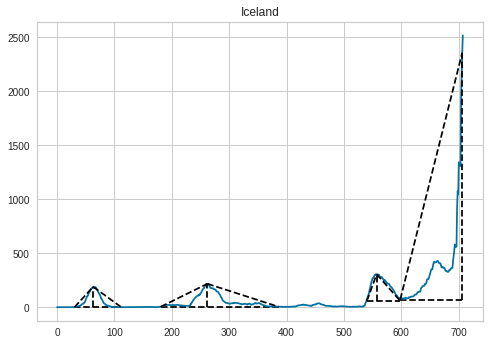



 peaks before removing subpeaks:  [ 84 270 351 574 706]
 subpeaks indexes:  []
 peaks:  [ 84 270 351 574 706]
 left angles:  [75.90021609 78.69606182 88.46097904 77.29913411 87.6953853 ]
 right angles:  [65.39881829 76.09952378 84.48374478 81.53464635]


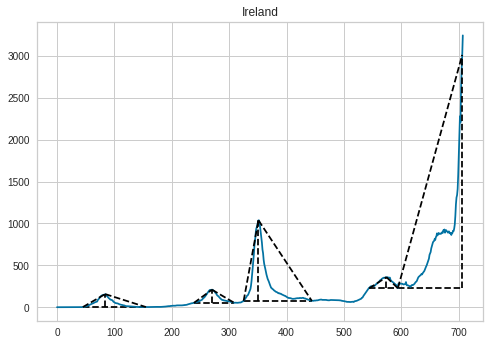



 peaks before removing subpeaks:  [ 62 294 417 579 706]
 subpeaks indexes:  []
 peaks:  [ 62 294 417 579 706]
 left angles:  [71.83196653 86.36852461 77.75939572 59.12830101 87.00433853]
 right angles:  [41.48763317 78.20896237 76.7238607  54.2438615 ]


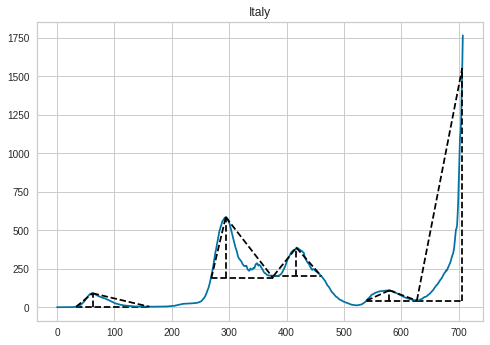



 peaks before removing subpeaks:  [346 467 639 706]
 subpeaks indexes:  [3]
 peaks:  [346 467 639]
 left angles:  [81.26936765 70.74617007 85.36751155]
 right angles:  [72.76479662 81.38651679]


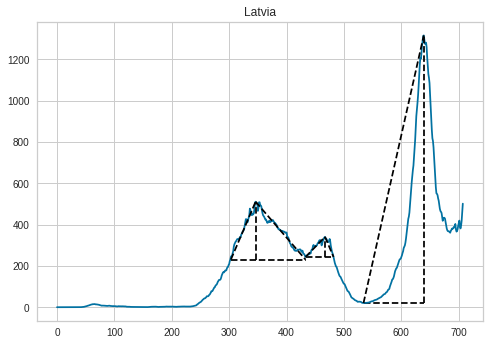



 peaks before removing subpeaks:  [329 467 641 706]
 subpeaks indexes:  [3]
 peaks:  [329 467 641]
 left angles:  [86.51213847 78.07822085 83.78167728]
 right angles:  [85.15701378 85.01437819]


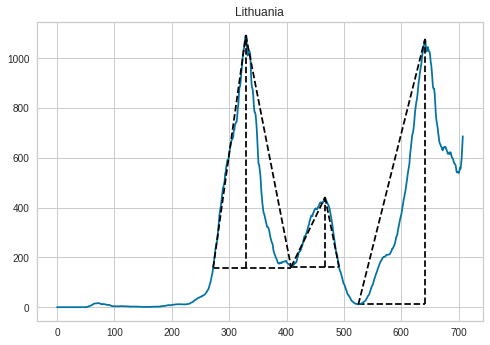



 peaks before removing subpeaks:  [297 432 576 653]
 subpeaks indexes:  [3]
 peaks:  [297 432 576]
 left angles:  [84.27355155 80.8199853  87.2459965 ]
 right angles:  [79.73029882 85.5043515 ]


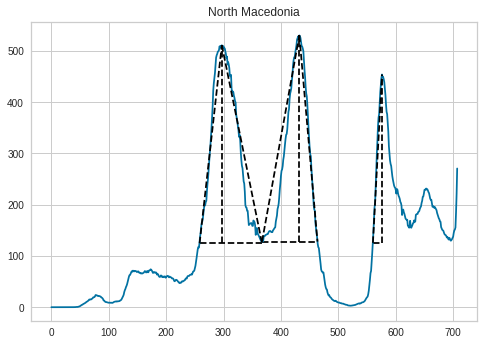



 peaks before removing subpeaks:  [146 256 316 424 634]
 subpeaks indexes:  [1]
 peaks:  [146 316 424 634]
 left angles:  [71.57558212 73.33047126 78.90011923 75.0299533 ]
 right angles:  [59.01453189 82.52332343 84.85082659]


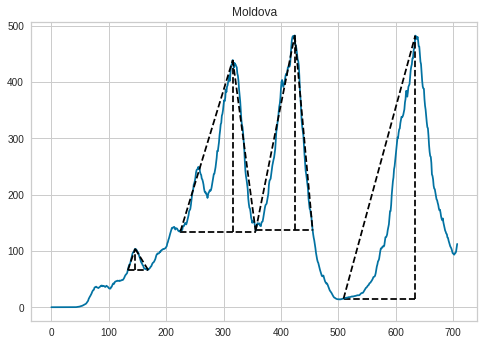



 peaks before removing subpeaks:  [ 78 330 453 538 674]
 subpeaks indexes:  []
 peaks:  [ 78 330 453 538 674]
 left angles:  [58.20552312 79.22832618 74.69485817 88.18635507 86.90342794]
 right angles:  [34.81532302 82.83115542 82.77460896 80.30296214]


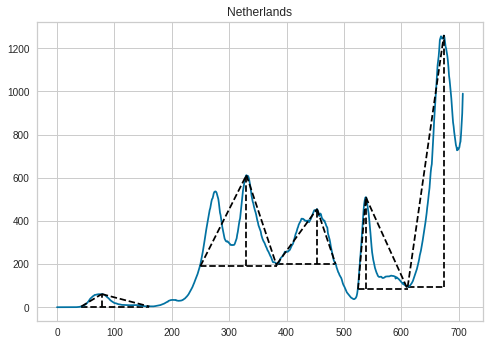



 peaks before removing subpeaks:  [ 64 346 421 588 690]
 subpeaks indexes:  []
 peaks:  [ 64 346 421 588 690]
 left angles:  [57.25636038 42.04375885 72.28315111 81.40481508 85.47490921]
 right angles:  [22.48224055 63.98364377 58.5772379  78.36935203]


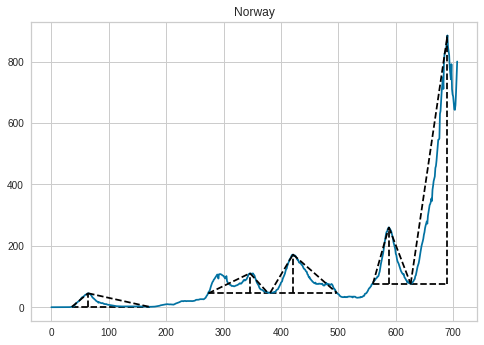



 peaks before removing subpeaks:  [291 430 676]
 subpeaks indexes:  []
 peaks:  [291 430 676]
 left angles:  [86.52924791 84.37671071 77.89506403]
 right angles:  [80.00833916 86.33158865]


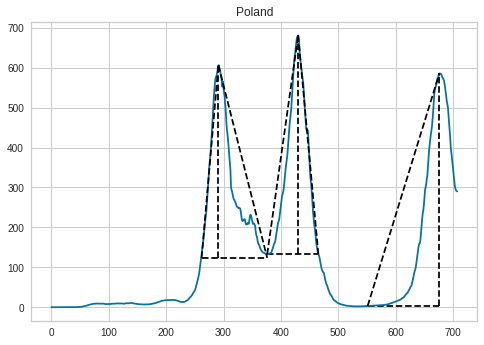



 peaks before removing subpeaks:  [ 71 295 366 542 706]
 subpeaks indexes:  [1]
 peaks:  [ 71 366 542 706]
 left angles:  [74.87080711 83.72562786 80.25283642 87.12458305]
 right angles:  [27.04667264 87.74531416 73.22841329]


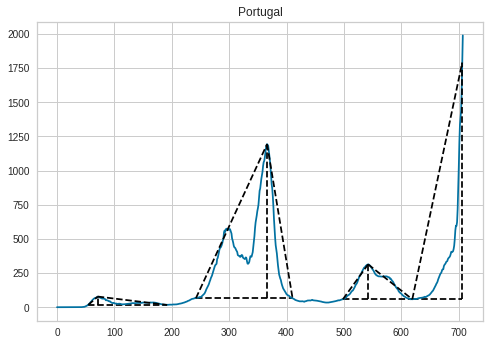



 peaks before removing subpeaks:  [294 428 635 706]
 subpeaks indexes:  [3]
 peaks:  [294 428 635]
 left angles:  [82.88507522 73.5701357  81.96664517]
 right angles:  [74.34086653 80.54941548]


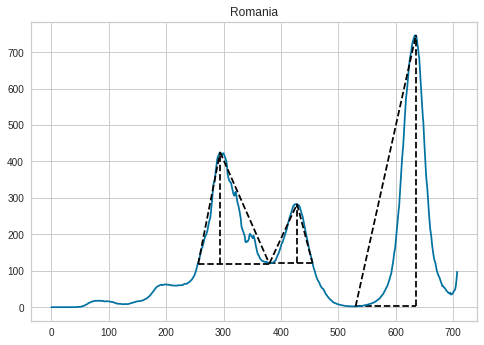



 peaks before removing subpeaks:  [106 335 537 652]
 subpeaks indexes:  []
 peaks:  [106 335 537 652]
 left angles:  [65.67843786 58.00267178 65.53899576 67.08954062]
 right angles:  [21.00428941 47.49566788 40.72962605]


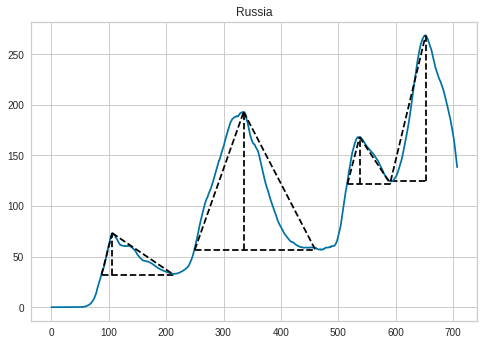



 peaks before removing subpeaks:  [ 83 181 314 422 608 706]
 subpeaks indexes:  [5]
 peaks:  [ 83 181 314 422 608]
 left angles:  [58.49445173 47.52878386 87.81685724 83.35028918 84.89829778]
 right angles:  [42.39891983 37.32379516 86.46673802 85.20182714]


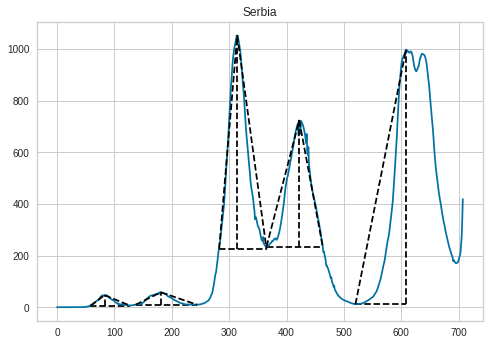



 peaks before removing subpeaks:  [280 347 673]
 subpeaks indexes:  [0]
 peaks:  [347 673]
 left angles:  [85.00311392 86.41071271]
 right angles:  [83.32824973]


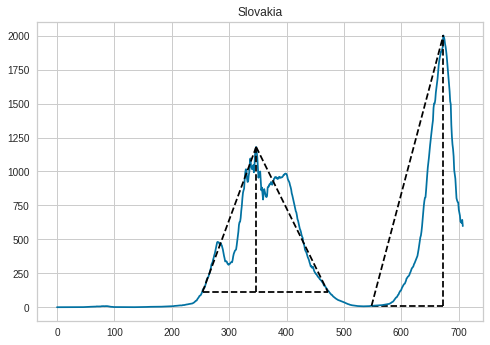



 peaks before removing subpeaks:  [280 346 430 657]
 subpeaks indexes:  [0, 2]
 peaks:  [346 657]
 left angles:  [82.06871038 85.35156059]
 right angles:  [78.0107499]


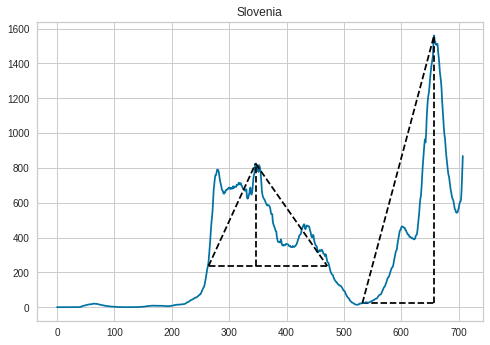



 peaks before removing subpeaks:  [ 66 284 363 450 543 706]
 subpeaks indexes:  []
 peaks:  [ 66 284 363 450 543 706]
 left angles:  [81.22902992 75.92625303 85.62524513 70.68395817 86.2242685  88.02511115]
 right angles:  [58.94417305 83.48003006 86.58187465 66.39457647 83.39915698]


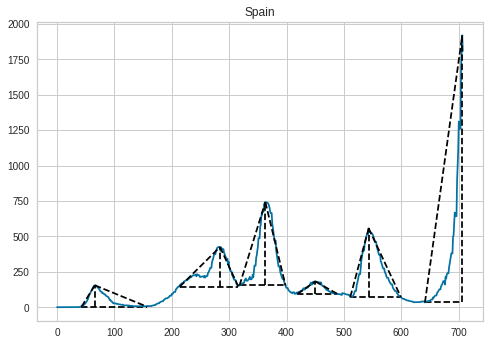



 peaks before removing subpeaks:  [146 345 443 593 706]
 subpeaks indexes:  []
 peaks:  [146 345 443 593 706]
 left angles:  [43.82251551 81.15670885 78.32547726 53.51895687 83.35957701]
 right angles:  [50.44245713 85.30579006 83.06821746 54.02389642]


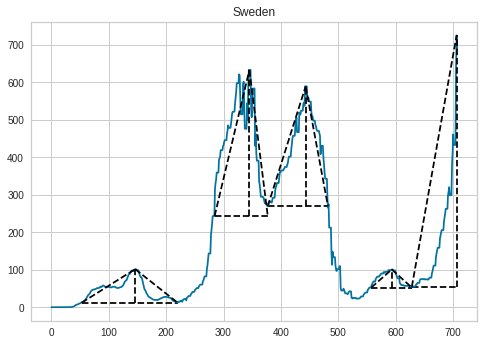



 peaks before removing subpeaks:  [ 63 282 445 599 706]
 subpeaks indexes:  []
 peaks:  [ 63 282 445 599 706]
 left angles:  [77.23884689 88.19688291 70.28532121 79.86397394 87.15084707]
 right angles:  [62.0642402  81.88431267 76.55612391 83.19588952]


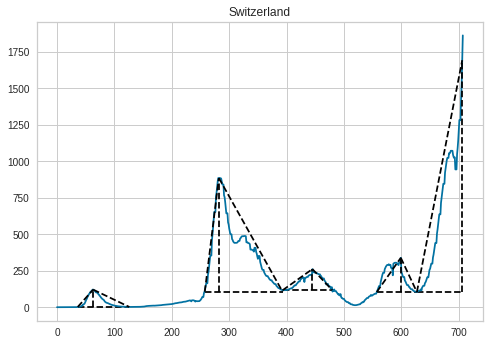



 peaks before removing subpeaks:  [ 82 314 447 560 625 706]
 subpeaks indexes:  [3]
 peaks:  [ 82 314 447 625 706]
 left angles:  [63.45561201 87.68533886 82.3700622  62.72043914 86.08275488]
 right angles:  [23.19052252 80.99258443 85.13107706 64.42328132]


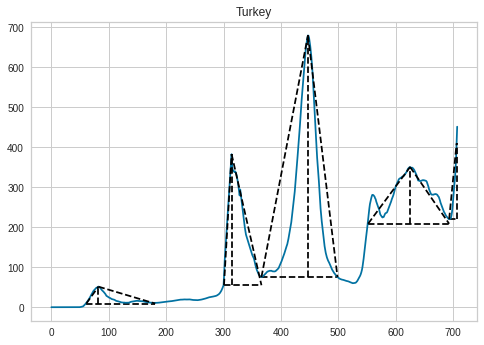



 peaks before removing subpeaks:  [309 440 646]
 subpeaks indexes:  []
 peaks:  [309 440 646]
 left angles:  [76.81926006 78.04955243 77.4047113 ]
 right angles:  [74.51222924 81.30470073]


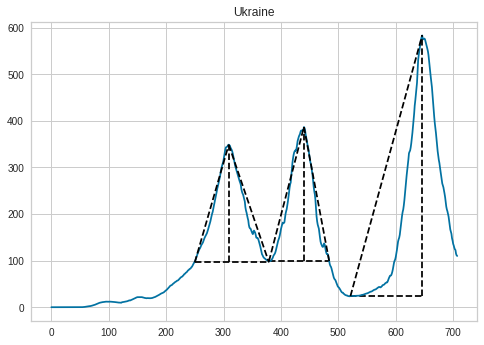



 peaks before removing subpeaks:  [ 90 347 540 636 706]
 subpeaks indexes:  [3]
 peaks:  [ 90 347 540 706]
 left angles:  [57.24172465 81.38091226 86.81618731 86.82544544]
 right angles:  [41.36388631 81.73250402 86.09718467]


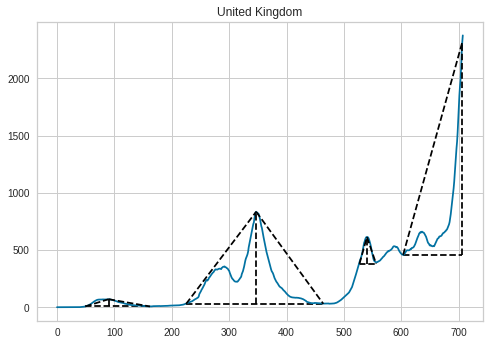

In [146]:
waves_df = pd.DataFrame()
train_df = pd.DataFrame()
predict_df = pd.DataFrame()
validate_df = pd.DataFrame()

for country in europe_df_rolled.columns:
  tmp_df = europe_df_rolled[country].copy().reset_index(drop=True)

  #temporary changing first and last row for better peaks extraction
  first_day = float(tmp_df.iloc[:1])
  last_day = float(tmp_df.iloc[-1:])

  tmp_df[0] = 0
  tmp_df[len(tmp_df)-1] = 0

  peaks, _ = find_peaks(tmp_df, prominence=35, distance=60)

  results_full = peak_widths(tmp_df, peaks, rel_height=1, wlen=250)
  results_full[0]

  print("\n")
  print("\033[1m peaks before removing subpeaks: \033[0m", peaks, sep=' ')

  #removing subpeaks
  if len(peaks) > 1:
    index_to_del = []
    #if first peak is inside right part of next peak  
    if results_full[2][0] >= results_full[2][1] and results_full[3][0] <= results_full[3][1]:
      index_to_del.append(0)

    for iterator in range(1, len(peaks)-1):
      #if peak is inside left part of previous peak
      if results_full[2][iterator] >= results_full[2][iterator-1] and results_full[3][iterator] <= results_full[3][iterator-1]:
        index_to_del.append(iterator)

      #if peak is inside right part of next peak  
      if results_full[2][iterator] >= results_full[2][iterator+1] and results_full[3][iterator] <= results_full[3][iterator+1]:
        index_to_del.append(iterator)

    iterator = len(peaks)-1
    #if last peak is inside left part of previous peak
    if results_full[2][iterator] >= results_full[2][iterator-1] and results_full[3][iterator] <= results_full[3][iterator-1]:
      index_to_del.append(iterator)
    
    index_to_del = list(set(index_to_del))
    print("\033[1m subpeaks indexes: \033[0m", index_to_del, sep=' ')

    peaks = np.delete(peaks, index_to_del)
    results_full = np.delete(np.array(results_full), index_to_del, axis=1)

    print("\033[1m peaks: \033[0m", peaks, sep=' ')



  #calculating triangle points
  base_left_point = dict()
  base_left_point['x'] = results_full[2]
  base_left_point['y'] = tmp_df[base_left_point['x'].astype(int)].values

  base_right_point = dict()
  base_right_point['x'] = results_full[3]
  base_right_point['y'] = base_left_point['y']

  peak_point = dict()
  peak_point['x'] = peaks
  peak_point['y'] = tmp_df[peaks].values

  #calculating the length of the sides of the triangle
  real_height = peak_point['y'] - base_left_point['y']
  left_side_base = peak_point['x'] - base_left_point['x']
  right_side_base = base_right_point['x'] - peak_point['x']

  #calculating angles
  left_angle = np.degrees(np.arctan(real_height/left_side_base))
  right_angle = np.degrees(np.arctan(real_height/right_side_base))

  #removing last right sides because this is unknown
  right_side_base = right_side_base[:-1]
  right_angle = right_angle[:-1]
  
  print("\033[1m left angles: \033[0m", left_angle, sep=' ')
  print("\033[1m right angles: \033[0m", right_angle, sep=' ')

  #saving wave data
  wave_column, train_column, predict_column, validate_column = create_wave_df_column(country, real_height, left_side_base, right_side_base, base_left_point['x'], base_left_point['y'])
  waves_df = pd.merge(left=waves_df, right=wave_column, how="outer", left_index=True, right_index=True, sort=False)
  train_df = pd.merge(left=train_df, right=train_column, how="outer", left_index=True, right_index=True, sort=False)
  predict_df = pd.merge(left=predict_df, right=predict_column, how="outer", left_index=True, right_index=True, sort=False)
  validate_df = pd.merge(left=validate_df, right=validate_column, how="outer", left_index=True, right_index=True, sort=False)


  #returing original data for plotting
  tmp_df[0] = first_day
  tmp_df[len(tmp_df)-1] = last_day
  
  #ploting
  plt.plot(tmp_df)
  plt.title(country)

  for iterator in range(len(peaks)-1):
    plt.plot([base_left_point['x'][iterator], peak_point['x'][iterator]], 
             [base_left_point['y'][iterator], peak_point['y'][iterator]], 
             color='black', linestyle='--')
    
    plt.plot([peak_point['x'][iterator], base_right_point['x'][iterator]], 
             [peak_point['y'][iterator], base_right_point['y'][iterator]], 
             color='black', linestyle='--')
    
    plt.plot([peak_point['x'][iterator], peak_point['x'][iterator]], 
             [base_left_point['y'][iterator], peak_point['y'][iterator]], 
             color='black', linestyle='--')
    
    plt.hlines(base_left_point['y'][iterator], 
               base_left_point['x'][iterator], 
               base_right_point['x'][iterator], 
               color='black', linestyle='--')
  

  #last peak only have left side because right is unknown
  iterator = len(peaks)-1
  plt.plot([base_left_point['x'][iterator], peak_point['x'][iterator]], 
           [base_left_point['y'][iterator], peak_point['y'][iterator]], 
           color='black', linestyle='--')
  
  plt.plot([peak_point['x'][iterator], peak_point['x'][iterator]], 
           [base_left_point['y'][iterator], peak_point['y'][iterator]], 
           color='black', linestyle='--')
  
  plt.hlines(base_left_point['y'][iterator], 
             base_left_point['x'][iterator], 
             peak_point['x'][iterator], 
             color='black', linestyle='--')
  
  plt.show()

In [147]:
waves_df

,Albania,Armenia,Austria,Azerbaijan,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,...,Russia,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,Ukraine,United Kingdom
height0,299.378286,165.747929,70.161214,42.761714,91.827429,113.731357,404.798643,430.765143,795.710500,533.477929,...,41.082643,40.176000,1068.621071,588.621786,151.115714,89.585714,118.806929,42.412071,252.621214,63.395929
height1,305.711214,686.831000,611.659357,386.709786,90.022214,1199.157214,409.084143,469.459857,466.672357,788.737357,...,136.392857,48.034500,1992.763643,1537.344286,279.992714,389.705786,778.398786,328.040286,288.207857,805.203429
height2,NaN,280.373786,202.829143,196.478786,143.097429,282.640000,241.509571,667.096143,1308.745000,997.361357,...,46.495929,825.973214,NaN,NaN,588.215286,319.417143,145.113214,604.656571,559.433929,234.526643
height3,NaN,650.711714,1447.121714,308.047929,NaN,1398.780071,NaN,NaN,NaN,3140.281643,...,144.333714,488.920929,NaN,NaN,88.442714,48.215643,234.671857,142.075071,NaN,1857.087357
height4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,985.689929,NaN,NaN,484.888857,669.993929,1587.361286,189.848786,NaN,NaN
height5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1885.043143,NaN,NaN,NaN,NaN,NaN
left_base0,125.000000,51.508744,20.336690,48.021617,46.090469,29.155281,30.586592,38.420104,61.295359,77.574253,...,18.568140,24.625236,93.433708,82.005687,23.315554,93.345663,26.907575,21.186920,59.162187,40.790577
left_base1,77.000000,59.448226,28.595550,65.008204,37.698765,30.781635,58.000000,67.000000,59.000000,68.000000,...,85.218873,43.971137,125.000000,125.000000,70.192937,60.631186,24.504557,13.259536,61.000000,122.049967
left_base2,NaN,52.000000,49.000000,65.000000,118.000000,87.000000,125.000000,113.000000,125.000000,27.592399,...,21.151210,31.487321,NaN,NaN,45.000000,66.000000,52.000000,81.000000,125.000000,13.045610
left_base3,NaN,125.000000,125.000000,27.984443,NaN,123.000000,NaN,NaN,NaN,87.000000,...,61.000000,57.000000,NaN,NaN,31.000000,35.653018,41.953679,73.266240,NaN,103.000000


#6. waves_df clustering
Division of the pandemic in countries into clusters

In [148]:
waves_df.fillna(0)

,Albania,Armenia,Austria,Azerbaijan,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,...,Russia,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,Ukraine,United Kingdom
height0,299.378286,165.747929,70.161214,42.761714,91.827429,113.731357,404.798643,430.765143,795.710500,533.477929,...,41.082643,40.176000,1068.621071,588.621786,151.115714,89.585714,118.806929,42.412071,252.621214,63.395929
height1,305.711214,686.831000,611.659357,386.709786,90.022214,1199.157214,409.084143,469.459857,466.672357,788.737357,...,136.392857,48.034500,1992.763643,1537.344286,279.992714,389.705786,778.398786,328.040286,288.207857,805.203429
height2,0.000000,280.373786,202.829143,196.478786,143.097429,282.640000,241.509571,667.096143,1308.745000,997.361357,...,46.495929,825.973214,0.000000,0.000000,588.215286,319.417143,145.113214,604.656571,559.433929,234.526643
height3,0.000000,650.711714,1447.121714,308.047929,0.000000,1398.780071,0.000000,0.000000,0.000000,3140.281643,...,144.333714,488.920929,0.000000,0.000000,88.442714,48.215643,234.671857,142.075071,0.000000,1857.087357
height4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,985.689929,0.000000,0.000000,484.888857,669.993929,1587.361286,189.848786,0.000000,0.000000
height5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1885.043143,0.000000,0.000000,0.000000,0.000000,0.000000
left_base0,125.000000,51.508744,20.336690,48.021617,46.090469,29.155281,30.586592,38.420104,61.295359,77.574253,...,18.568140,24.625236,93.433708,82.005687,23.315554,93.345663,26.907575,21.186920,59.162187,40.790577
left_base1,77.000000,59.448226,28.595550,65.008204,37.698765,30.781635,58.000000,67.000000,59.000000,68.000000,...,85.218873,43.971137,125.000000,125.000000,70.192937,60.631186,24.504557,13.259536,61.000000,122.049967
left_base2,0.000000,52.000000,49.000000,65.000000,118.000000,87.000000,125.000000,113.000000,125.000000,27.592399,...,21.151210,31.487321,0.000000,0.000000,45.000000,66.000000,52.000000,81.000000,125.000000,13.045610
left_base3,0.000000,125.000000,125.000000,27.984443,0.000000,123.000000,0.000000,0.000000,0.000000,87.000000,...,61.000000,57.000000,0.000000,0.000000,31.000000,35.653018,41.953679,73.266240,0.000000,103.000000


##a) KMeans

3 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 2: 
['Denmark', 'France', 'Ireland', 'Italy', 'Netherlands', 'Norway', 'Serbia', 'Sweden', 'Switzerland']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Germany', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Slovakia', 'Slovenia', 'Spain', 'Turkey', 'Ukraine']


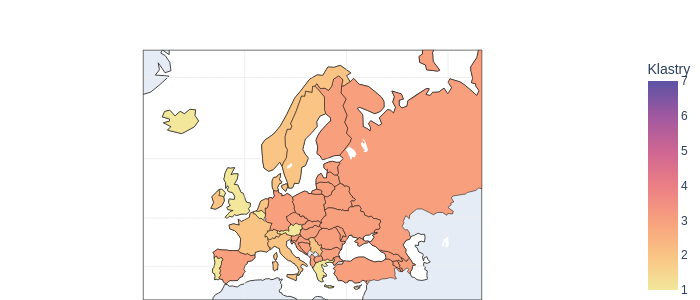

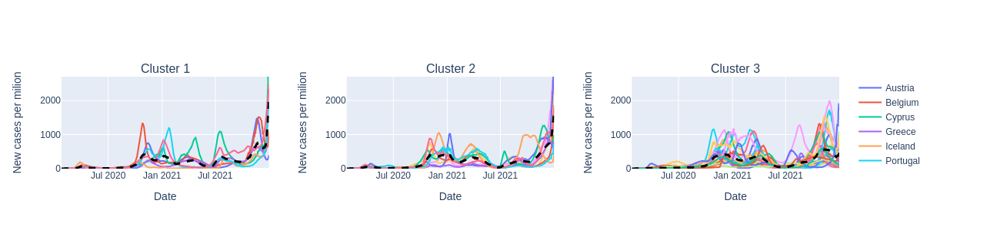



4 clusters: 
Cluster 1: 
['Albania', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Poland', 'Romania', 'Slovakia', 'Slovenia', 'Ukraine']
Cluster 2: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 3: 
['Denmark', 'France', 'Ireland', 'Italy', 'Switzerland']
Cluster 4: 
['Armenia', 'Azerbaijan', 'Germany', 'Moldova', 'Netherlands', 'Norway', 'Russia', 'Serbia', 'Spain', 'Sweden', 'Turkey']


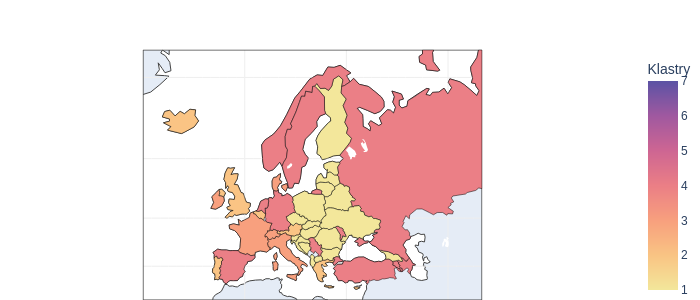

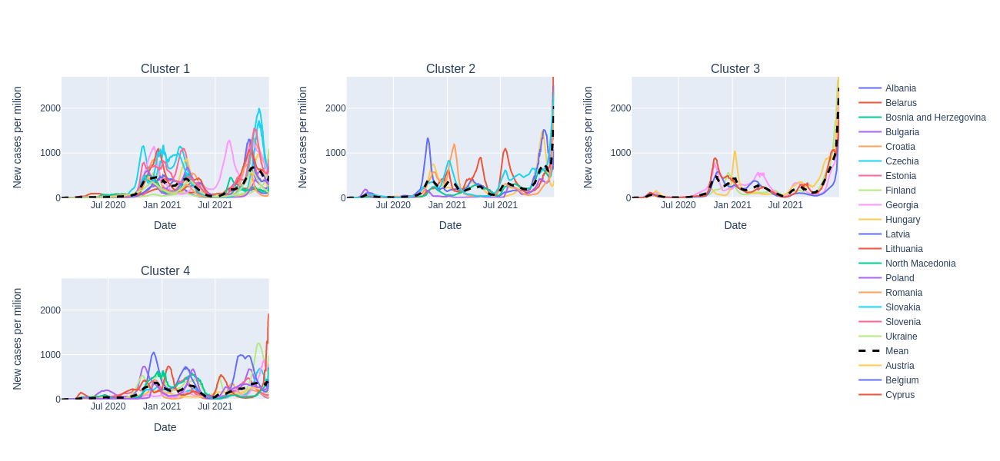



5 clusters: 
Cluster 1: 
['Slovakia', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Germany', 'Moldova', 'Netherlands', 'Norway', 'Russia', 'Serbia', 'Spain', 'Sweden', 'Turkey']
Cluster 3: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 4: 
['Denmark', 'France', 'Ireland', 'Italy', 'Switzerland']
Cluster 5: 
['Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Poland', 'Romania', 'Ukraine']


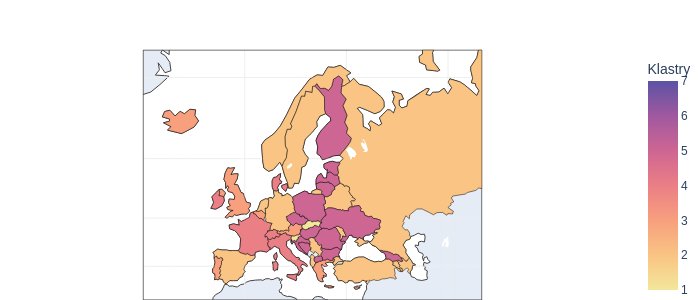

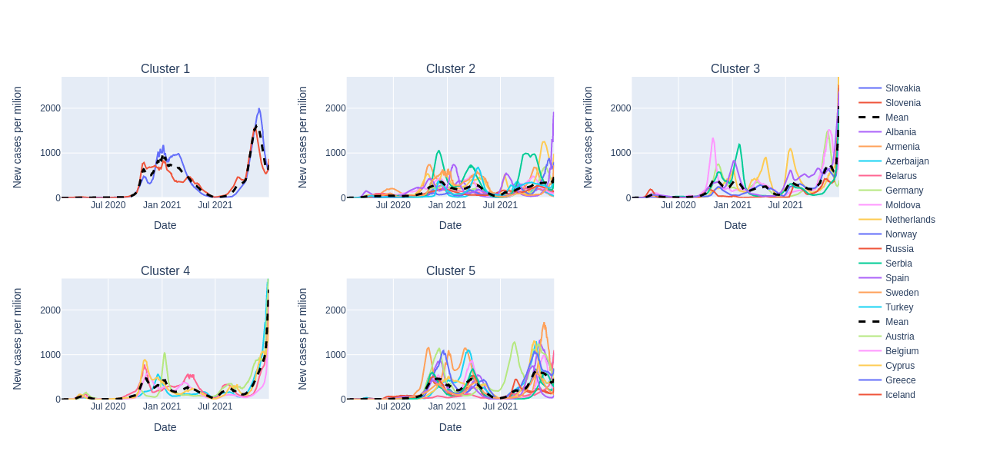



6 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Germany', 'North Macedonia', 'Moldova', 'Russia', 'Ukraine']
Cluster 2: 
['Italy', 'Netherlands', 'Norway', 'Serbia', 'Spain', 'Sweden', 'Switzerland', 'Turkey']
Cluster 3: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 4: 
['Denmark', 'France', 'Ireland']
Cluster 5: 
['Slovakia', 'Slovenia']
Cluster 6: 
['Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Hungary', 'Latvia', 'Lithuania', 'Poland', 'Romania']


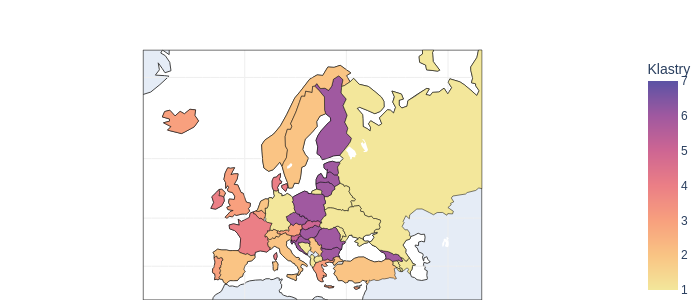

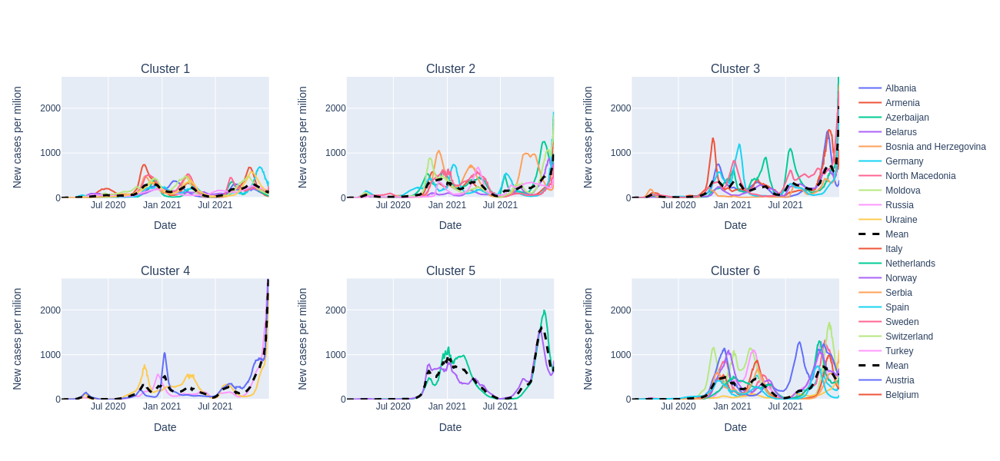



7 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 2: 
['Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Poland', 'Romania', 'Ukraine']
Cluster 3: 
['France', 'Italy', 'Netherlands', 'Serbia', 'Switzerland']
Cluster 4: 
['Spain']
Cluster 5: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Germany', 'Moldova', 'Norway', 'Russia', 'Sweden', 'Turkey']
Cluster 6: 
['Slovakia', 'Slovenia']
Cluster 7: 
['Denmark', 'Ireland']


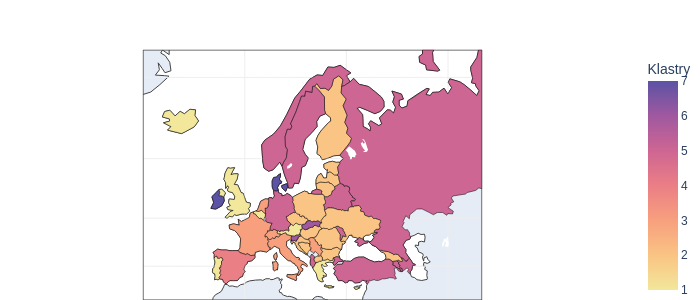

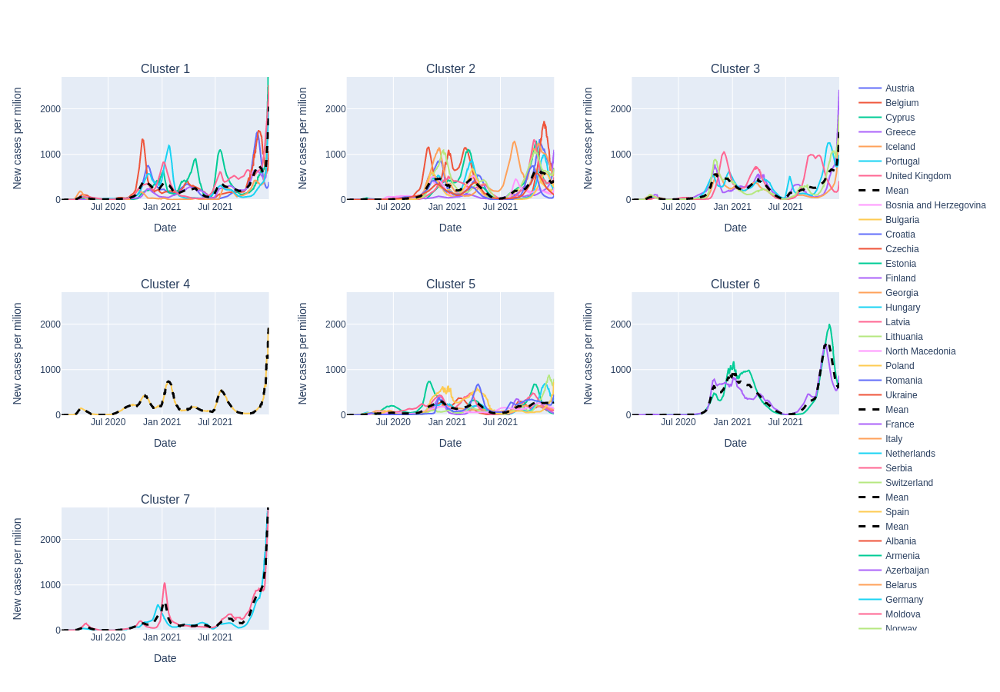

In [149]:
kmeans_clustering(waves_df.fillna(0).T)

##b) KHierarchy

3 clusters: 
Cluster 1: 
['Denmark', 'France', 'Ireland', 'Italy', 'Netherlands', 'Norway', 'Serbia', 'Spain', 'Sweden', 'Switzerland', 'Turkey']
Cluster 2: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Germany', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Slovakia', 'Slovenia', 'Ukraine']


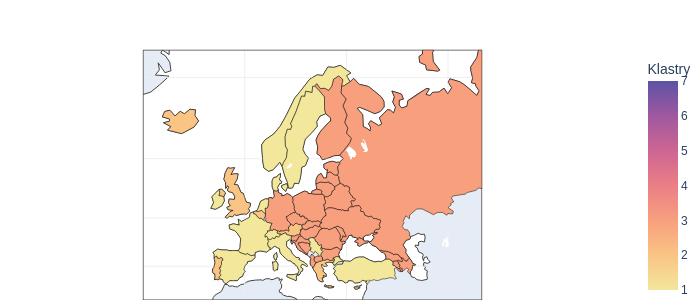

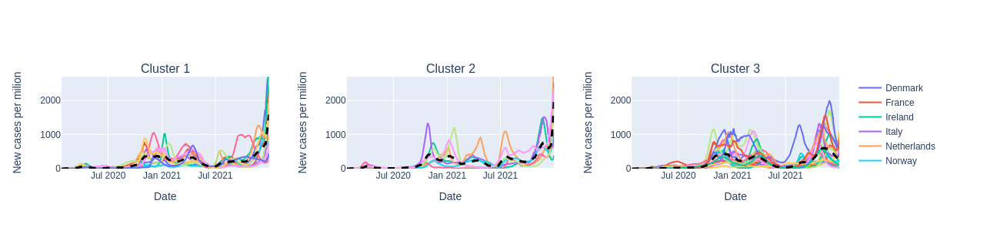



4 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Germany', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Slovakia', 'Slovenia', 'Ukraine']
Cluster 2: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 3: 
['Italy', 'Netherlands', 'Norway', 'Serbia', 'Spain', 'Sweden', 'Switzerland', 'Turkey']
Cluster 4: 
['Denmark', 'France', 'Ireland']


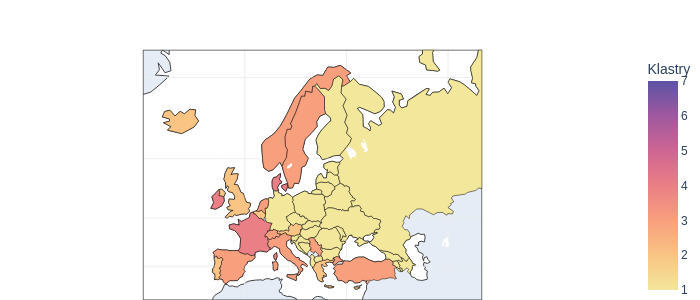

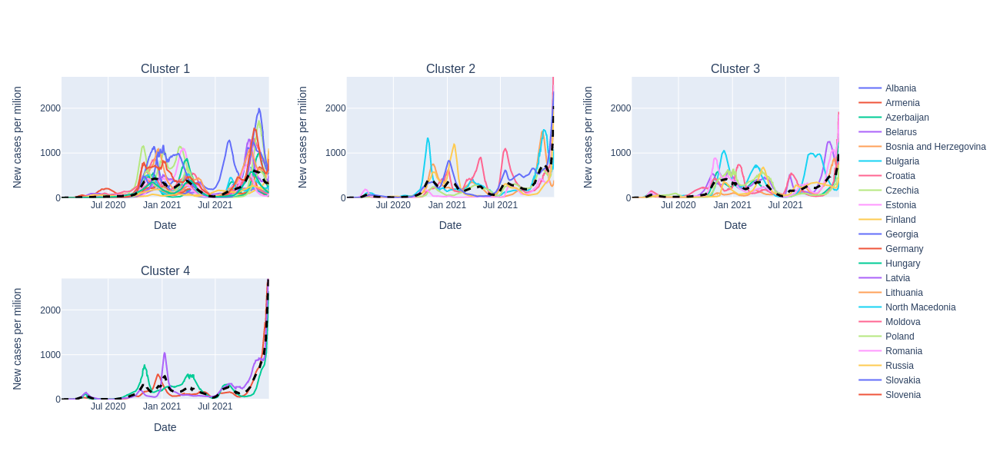



5 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Germany', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Ukraine']
Cluster 2: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 3: 
['Italy', 'Netherlands', 'Norway', 'Serbia', 'Spain', 'Sweden', 'Switzerland', 'Turkey']
Cluster 4: 
['Denmark', 'France', 'Ireland']
Cluster 5: 
['Slovakia', 'Slovenia']


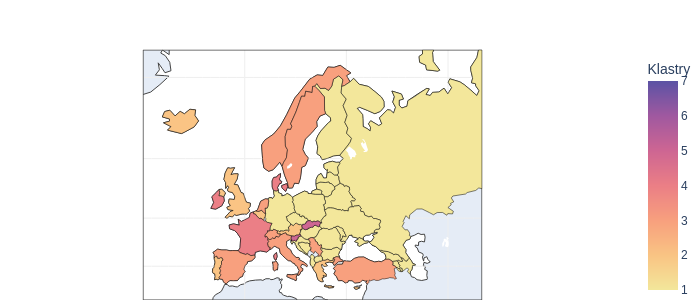

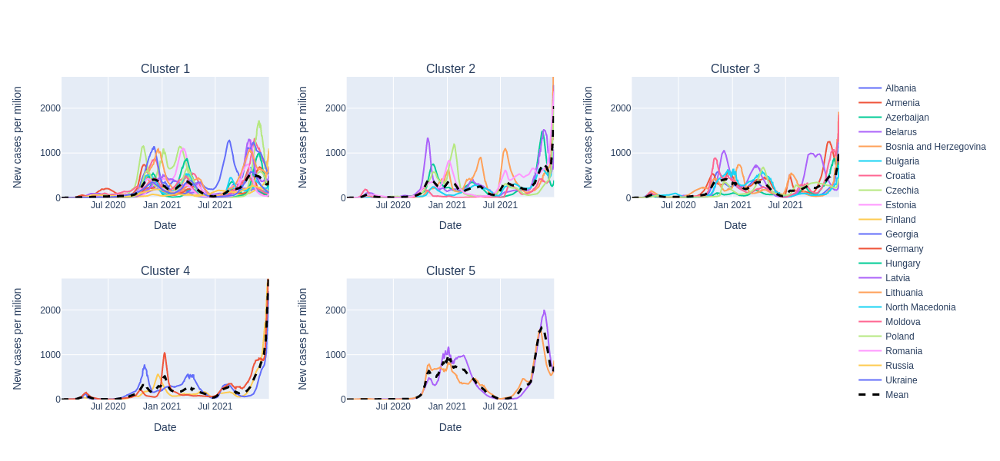



6 clusters: 
Cluster 1: 
['Italy', 'Netherlands', 'Norway', 'Serbia', 'Spain', 'Sweden', 'Switzerland', 'Turkey']
Cluster 2: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Georgia', 'Germany', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Ukraine']
Cluster 4: 
['Denmark', 'France', 'Ireland']
Cluster 5: 
['Slovakia', 'Slovenia']
Cluster 6: 
['Croatia', 'Czechia', 'Estonia', 'Finland', 'Hungary', 'Latvia', 'Lithuania']


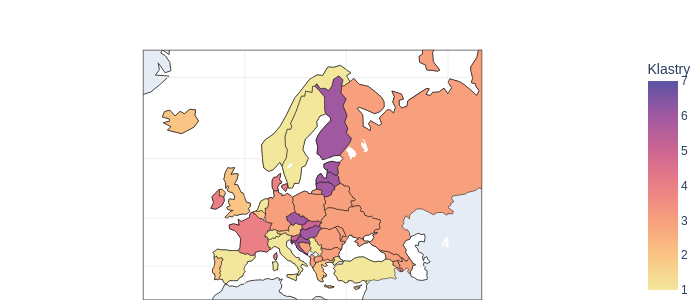

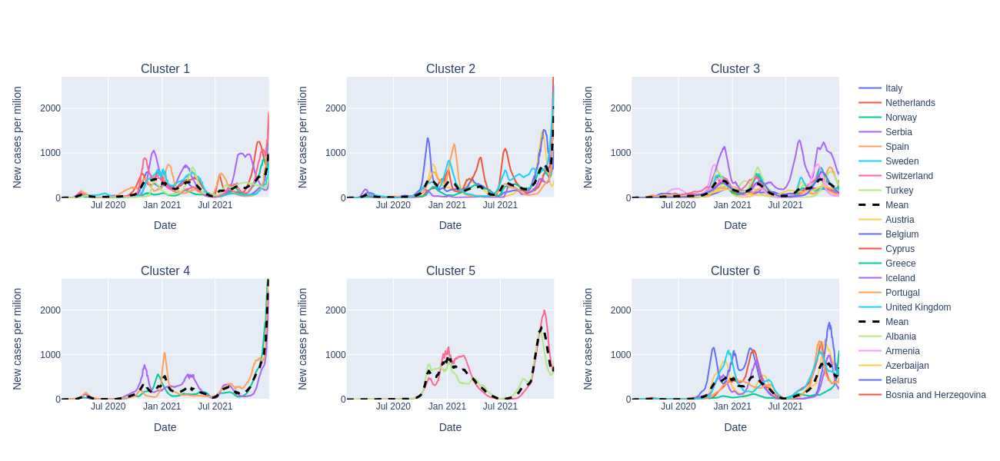



7 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 2: 
['Italy', 'Netherlands', 'Norway', 'Serbia', 'Sweden', 'Switzerland', 'Turkey']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Georgia', 'Germany', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Ukraine']
Cluster 4: 
['Denmark', 'France', 'Ireland']
Cluster 5: 
['Slovakia', 'Slovenia']
Cluster 6: 
['Croatia', 'Czechia', 'Estonia', 'Finland', 'Hungary', 'Latvia', 'Lithuania']
Cluster 7: 
['Spain']


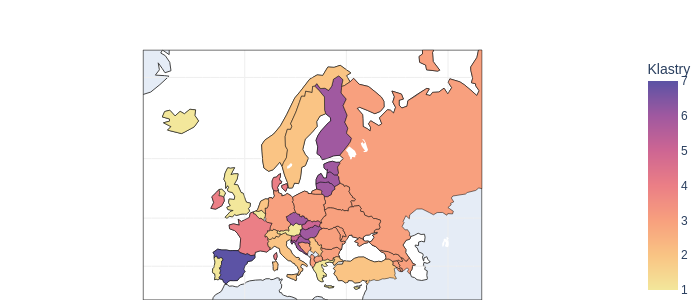

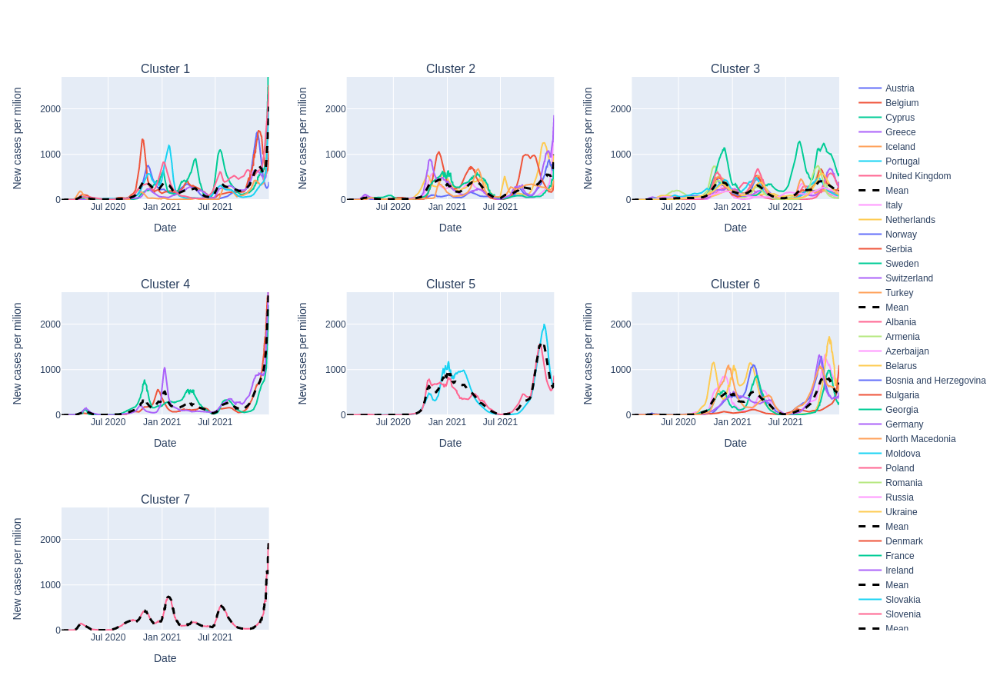

In [150]:
khierarchy_clustering(waves_df.fillna(0).T)

##c) Selection of the number of clusters

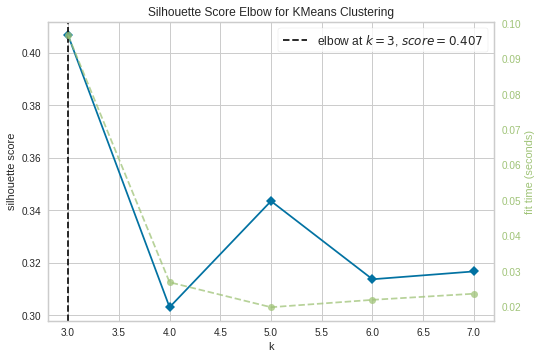

In [151]:
#Silhouette Score for K means
model = KMeans(random_state=100)

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True)
visualizer.fit(waves_df.fillna(0).T)
visualizer.show()

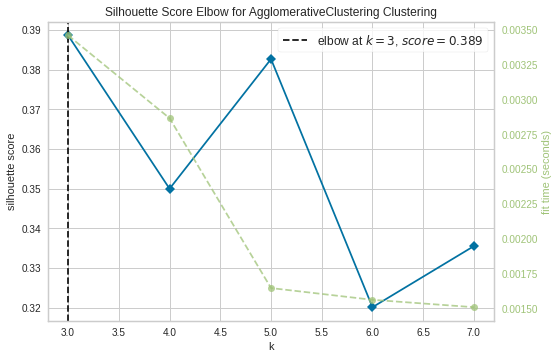

In [152]:
#Silhouette Score for Hierarchical clustering
model = AgglomerativeClustering(linkage='ward', affinity='euclidean')

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True)
visualizer.fit(waves_df.fillna(0).T)        
visualizer.show()

# 7. pca_df + waves_df clustering
There is no difference between pca_df and pca_df + waves_df

In [153]:
pca_waves_df = pd.merge(left=pca_df, right=waves_df.fillna(0).T, how="outer", left_index=True, right_index=True, sort=False)
pca_waves_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,left_y1,left_y2,left_y3,left_y4,left_y5,right_base0,right_base1,right_base2,right_base3,right_base4
Albania,-3536.821614,-1241.192094,-577.217622,-839.737336,-771.392577,1170.913048,-303.530168,-535.321625,922.523862,134.854256,...,1.055500,0.000000,0.000000,0.000000,0.000000,54.904741,0.000000,0.000000,0.000000,0.000000
Armenia,-2097.957427,-2725.406061,282.822203,1052.833494,903.211543,929.511627,1760.889755,150.723084,-1150.426509,-420.474396,...,51.147429,51.558500,28.643643,0.000000,0.000000,59.000000,98.000000,54.245838,0.000000,0.000000
Austria,2012.274440,-1932.165113,-1436.719408,2420.418362,-427.169265,-60.403568,-257.251934,-229.372200,-43.792623,1816.407478,...,144.716929,147.625357,35.340357,0.000000,0.000000,62.000000,84.000000,42.962939,0.000000,0.000000
Azerbaijan,-4189.581309,-1211.906410,33.862780,1007.400951,-230.295958,541.946338,-1107.112382,-339.811142,494.827671,-77.671441,...,11.943929,12.798857,48.581857,0.000000,0.000000,89.000000,59.000000,52.733369,0.000000,0.000000
Belarus,-3755.090537,-822.811560,-293.737998,-64.756220,-919.061626,771.116705,-683.602199,-810.639650,-138.580745,-347.899530,...,110.315857,70.522571,0.000000,0.000000,0.000000,82.000000,84.000000,0.000000,0.000000,0.000000
Belgium,3678.559089,221.130287,-2590.425302,3178.936227,325.503224,207.061511,2051.594385,-838.556190,-939.250083,-887.434255,...,141.454786,143.464714,130.540500,0.000000,0.000000,68.000000,66.000000,62.365450,0.000000,0.000000
Bosnia and Herzegovina,-3100.848056,-1584.304951,-1046.448830,150.210566,794.037677,-13.684211,457.279887,260.946827,38.139173,-37.079954,...,80.009929,5.257429,0.000000,0.000000,0.000000,86.000000,44.498162,0.000000,0.000000,0.000000
Bulgaria,-1631.398292,-2232.022789,271.201113,267.136913,171.968250,-699.078900,866.092903,265.044301,154.061091,333.112672,...,66.247357,9.141786,0.000000,0.000000,0.000000,62.000000,53.154454,0.000000,0.000000,0.000000
Croatia,3403.393460,-1225.719171,648.410273,2373.316438,234.460203,-896.760048,-827.702397,1599.908441,-858.150601,768.405777,...,80.513786,22.720357,0.000000,0.000000,0.000000,70.000000,42.696391,0.000000,0.000000,0.000000
Cyprus,817.454923,5604.591225,2114.102101,-1371.153807,3037.414159,-2697.203967,-1072.865190,-1972.153755,-1148.523337,141.482246,...,119.657929,97.894714,103.873500,0.000000,0.000000,42.000000,28.633647,78.000000,0.000000,0.000000


##a) KMeans

3 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Czechia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovakia', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']


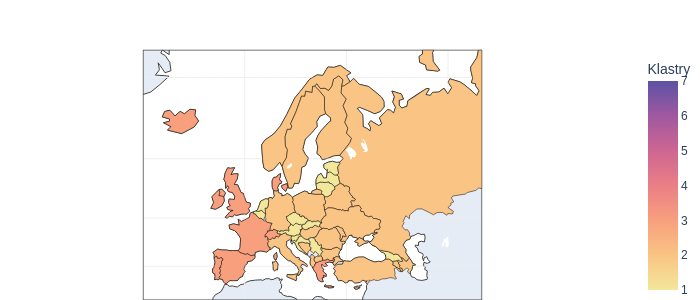

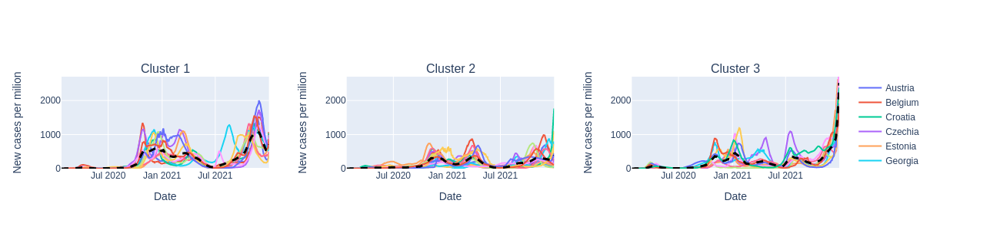



4 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Czechia', 'Slovakia']
Cluster 4: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']


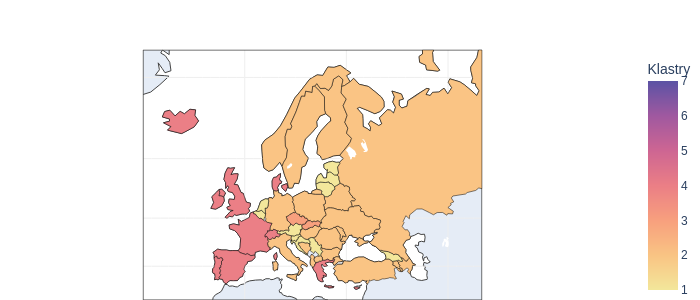

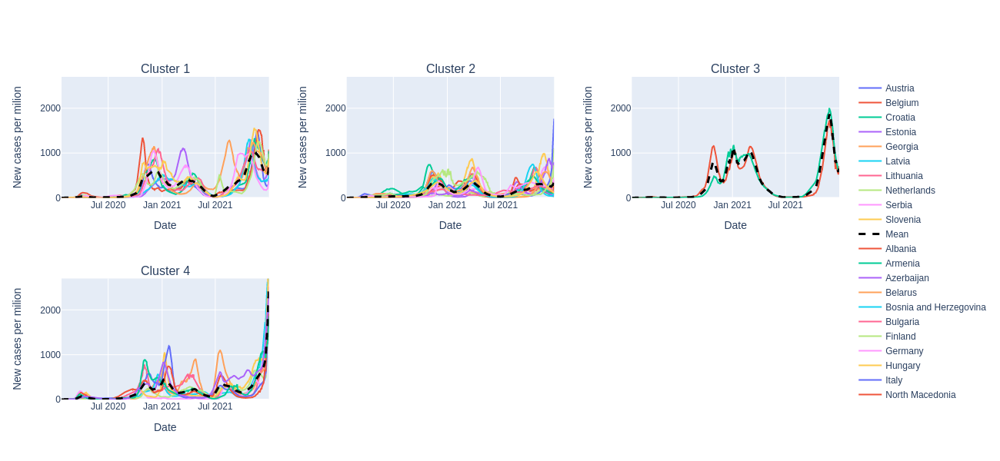



5 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Czechia', 'Slovakia']
Cluster 4: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


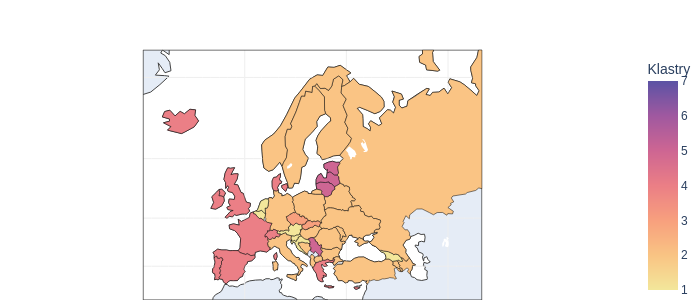

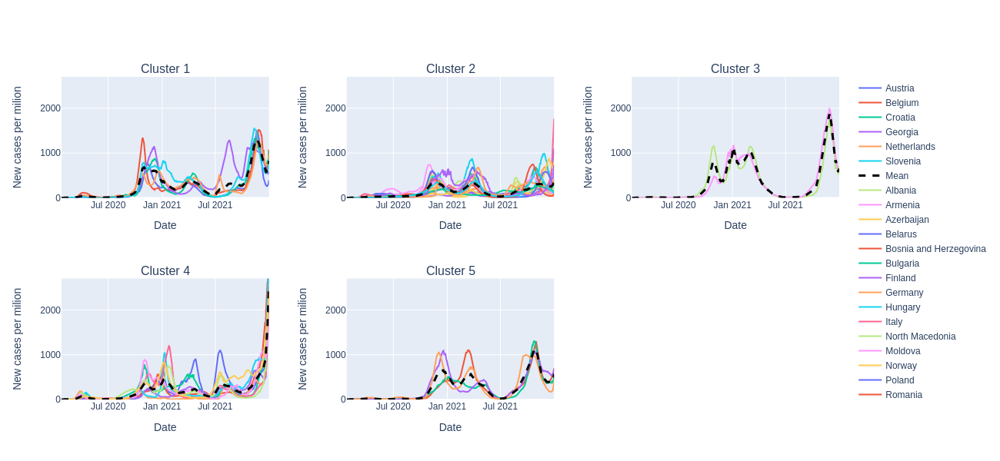



6 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Czechia', 'Slovakia']
Cluster 4: 
['Denmark', 'Ireland', 'United Kingdom']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 6: 
['Cyprus', 'France', 'Greece', 'Iceland', 'Italy', 'Portugal', 'Spain', 'Switzerland']


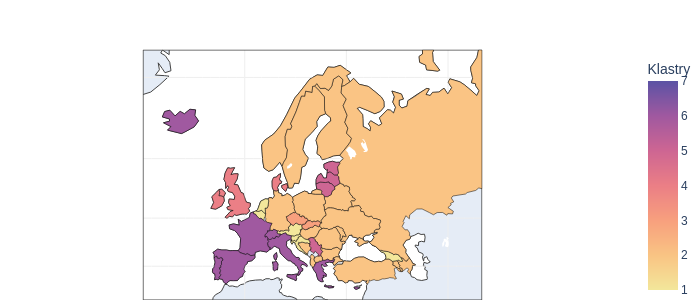

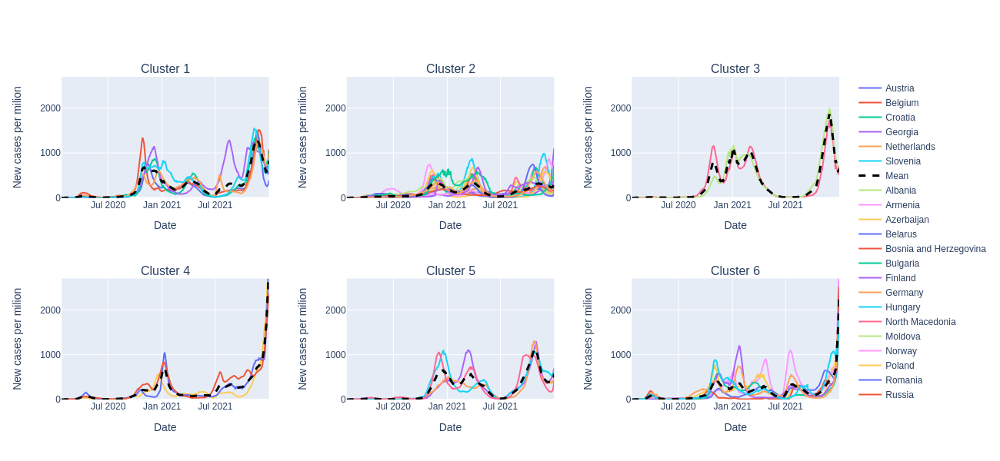



7 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 2: 
['Cyprus', 'France', 'Greece', 'Iceland', 'Portugal', 'Spain']
Cluster 3: 
['Czechia', 'Slovakia']
Cluster 4: 
['Austria', 'Belgium', 'Croatia', 'Hungary', 'Netherlands', 'Switzerland']
Cluster 5: 
['Georgia']
Cluster 6: 
['Denmark', 'Ireland', 'United Kingdom']
Cluster 7: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia', 'Slovenia']


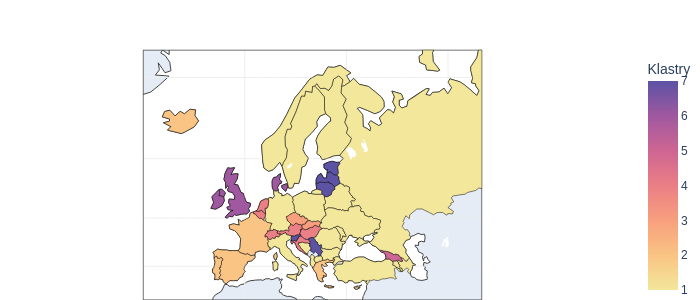

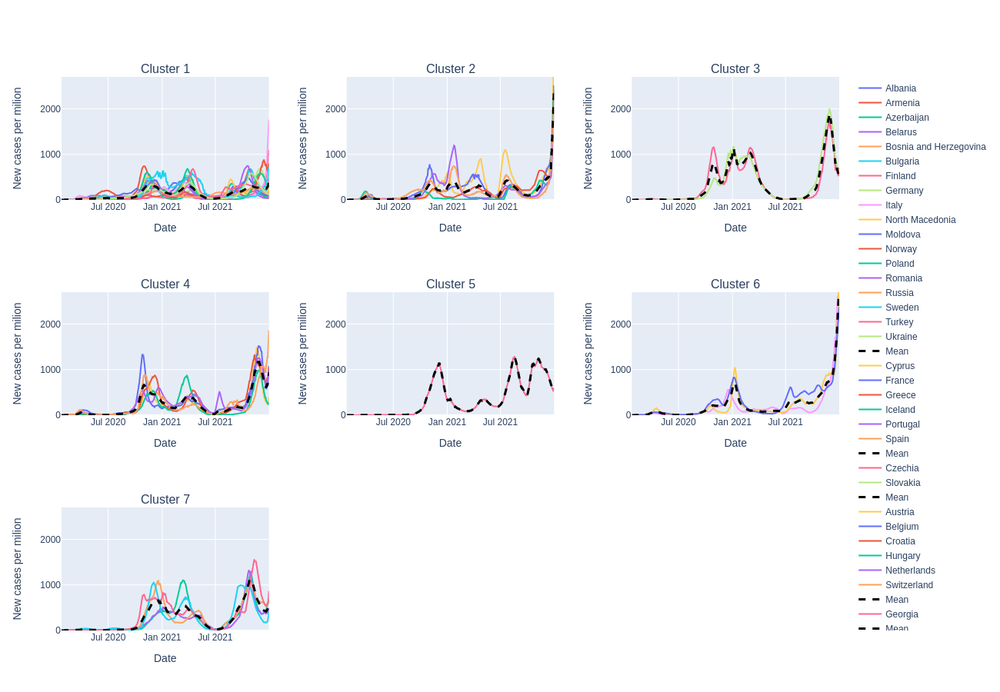

In [154]:
kmeans_clustering(pca_waves_df)

##b) KHierarchy

3 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Czechia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovakia', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']


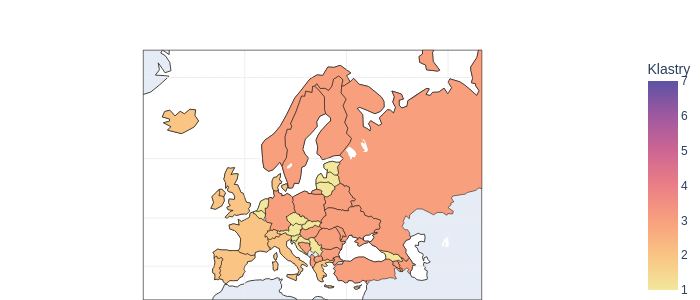

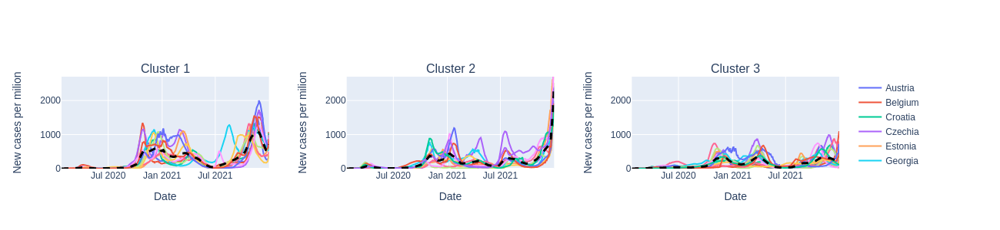



4 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Netherlands', 'Serbia', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']


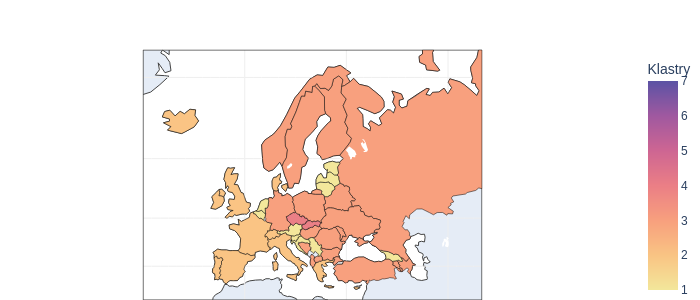

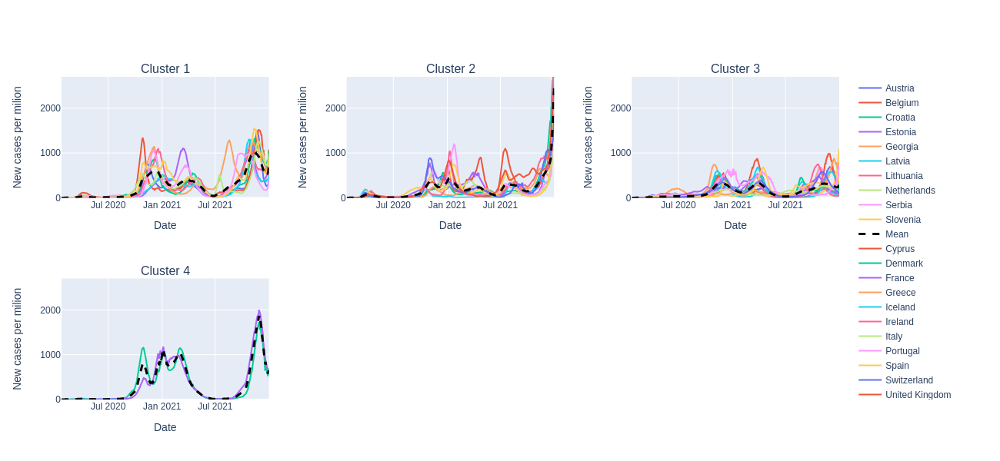



5 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


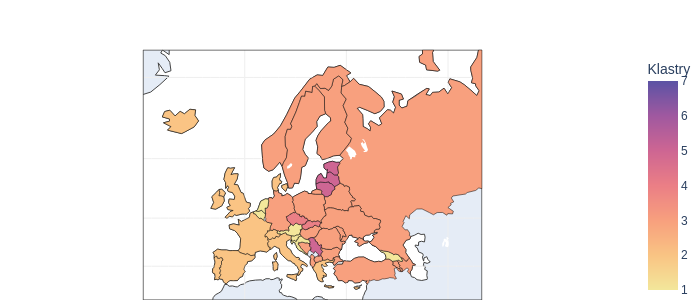

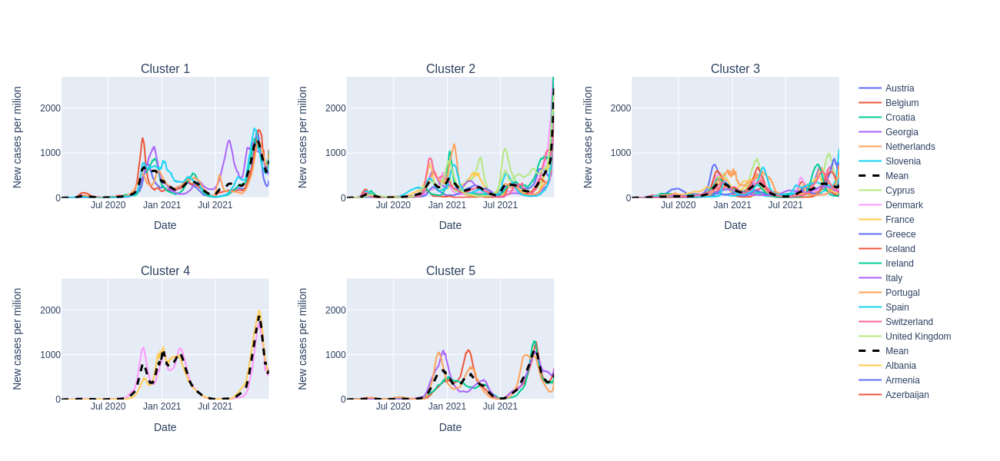



6 clusters: 
Cluster 1: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 2: 
['Austria', 'Belgium', 'Croatia', 'Netherlands', 'Slovenia']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 6: 
['Georgia']


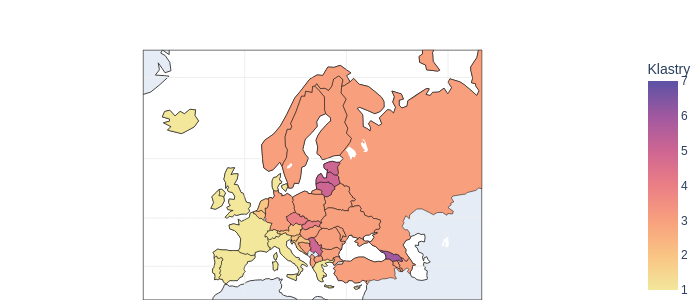

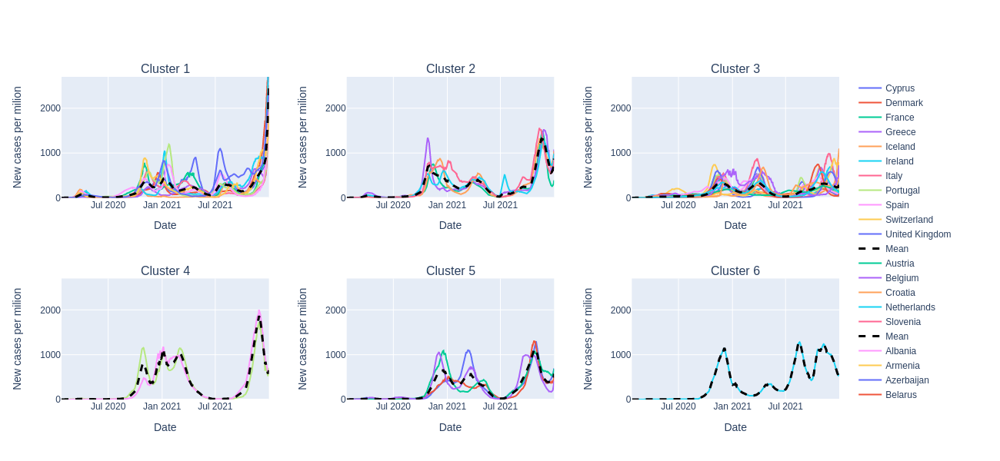



7 clusters: 
Cluster 1: 
['Cyprus', 'Denmark', 'Ireland', 'United Kingdom']
Cluster 2: 
['Austria', 'Belgium', 'Croatia', 'Netherlands', 'Slovenia']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']
Cluster 6: 
['Georgia']
Cluster 7: 
['France', 'Greece', 'Iceland', 'Italy', 'Portugal', 'Spain', 'Switzerland']


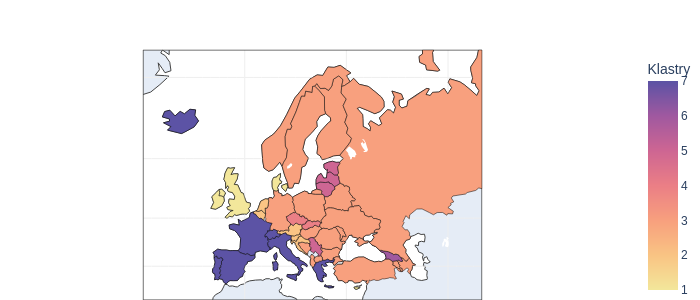

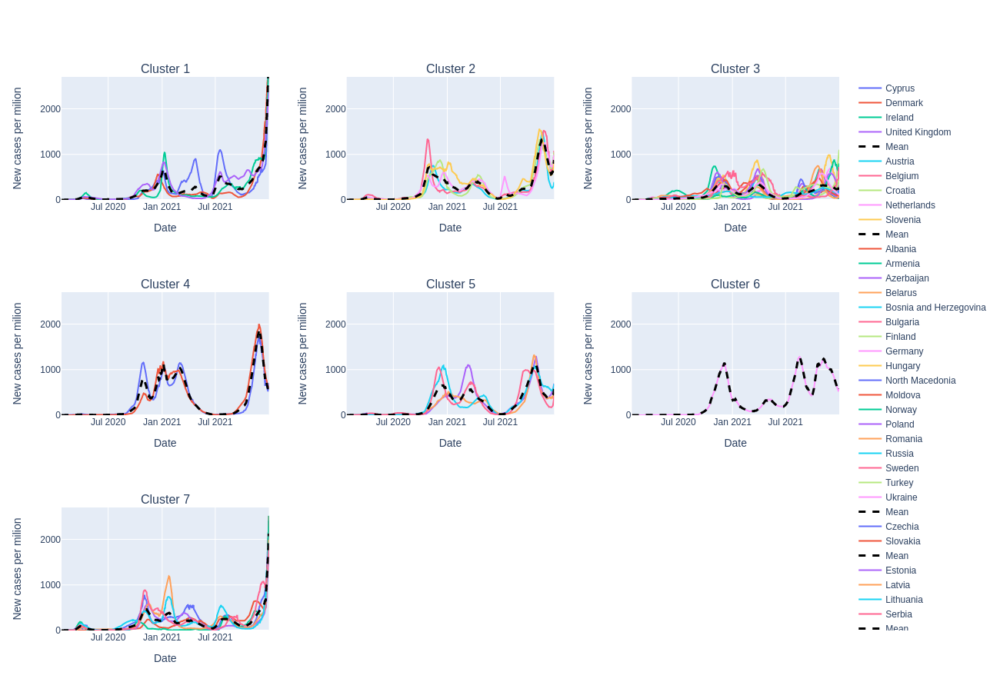

In [155]:
khierarchy_clustering(pca_waves_df)

##c) Wybór liczby klastrów

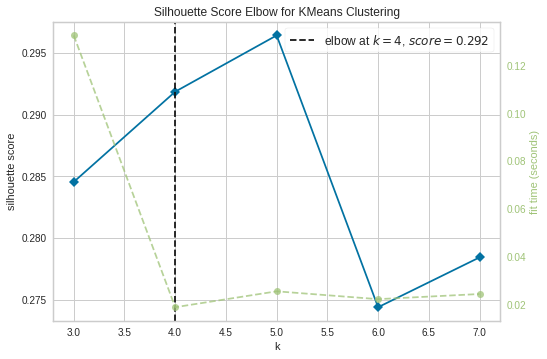

In [156]:
#Silhouette Score for K means
model = KMeans(random_state=100)

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True)
visualizer.fit(pca_waves_df)
visualizer.show()

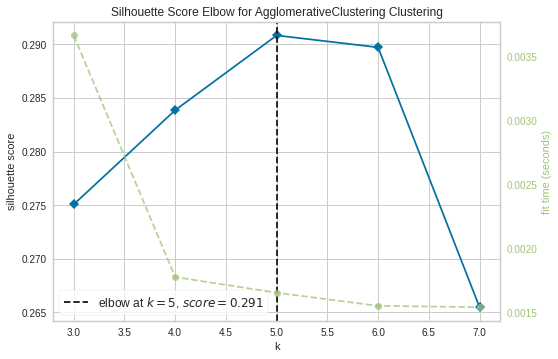

In [157]:
#Silhouette Score for Hierarchical clustering
model = AgglomerativeClustering(linkage='ward', affinity='euclidean')

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True)
visualizer.fit(pca_waves_df)        
visualizer.show()

#8. Prediction of the end of the last wave and the rate of its decay
Overview of the different models

In [158]:
train_df_prepared = pd.DataFrame()

for iterator in range(int(len(train_df.T.columns)/5)):
  tmp_df = train_df.fillna(0).T[[f"height{iterator}", f"left_base{iterator}", f"left_x{iterator}", f"left_y{iterator}", f"right_base{iterator}"]]

  train_df_prepared = pd.concat([train_df_prepared, pd.DataFrame(tmp_df.values)], axis=0)

train_df_prepared.columns=['height', 'left_base', 'left_x', 'left_y', 'right_base']
train_df_prepared.drop_duplicates(inplace=True)
train_df_prepared = train_df_prepared.reset_index(drop=True)
X_train_df, y_train_df = train_df_prepared.iloc[:,:4], train_df_prepared.iloc[:,4:]

In [159]:
y_train_df

,right_base
0,54.904741
1,59.000000
2,62.000000
3,89.000000
4,82.000000
...,...
111,38.649642
112,35.000000
113,28.000000
114,68.000000


In [160]:
models = [
          AdaBoostRegressor(),
          LGBMRegressor(),
          ExtraTreesRegressor(),
          BaggingRegressor(),
          GradientBoostingRegressor(),
          RandomForestRegressor(),
          HistGradientBoostingRegressor(),
          SVR(),
          LinearRegression(),
          XGBRegressor(),
          
          RandomForestRegressor(n_estimators=500, random_state=100), #ten wygrywa w model.score
          RandomForestRegressor(n_estimators=500, criterion='absolute_error', min_samples_leaf=5, oob_score=True, random_state=100), #najlepsze parametry z gridCV       
          RandomForestRegressor(n_estimators=200, criterion='absolute_error', min_samples_leaf=5, oob_score=True, random_state=100), #najlepsze parametry z gridCV

          SVR(C=0.25, epsilon=0.2, kernel='linear'), #najlepsze parametry z gridCV
          AdaBoostRegressor(n_estimators=500, learning_rate=0.5, loss='exponential', random_state=100), #najlepsze parametry z gridCV
          XGBRegressor(n_estimators=500, booster='gblinear', learning_rate=0.33, max_depth=1, min_child_weight=0, n_jobs=-1, objective='reg:squarederror', random_state=100) #najlepsze parametry z gridCV
]

for model in models:
  cv_scores = cross_val_score(model, X_train_df, y_train_df.values.ravel(), cv=LeaveOneOut(), scoring='neg_mean_absolute_error', n_jobs=-1)
  cv_scores = np.absolute(cv_scores)
  #best is score 0
  print('Model:', model, ', MAE: \033[91m %.3f (%.3f) \033[0m' % (cv_scores.mean(), cv_scores.std()))
  model.fit(X_train_df, y_train_df.values.ravel())
  #best is score 1
  print('R^2 on training data: \033[91m %.3f \033[0m' % (model.score(X_train_df, y_train_df.values.ravel())))

Model: AdaBoostRegressor() , MAE:  19.993 (15.325) 
R^2 on training data:  0.685 
Model: LGBMRegressor() , MAE:  20.415 (16.480) 
R^2 on training data:  0.565 
Model: ExtraTreesRegressor() , MAE:  19.427 (16.897) 
R^2 on training data:  1.000 
Model: BaggingRegressor() , MAE:  19.709 (16.435) 
R^2 on training data:  0.825 
Model: GradientBoostingRegressor() , MAE:  18.831 (14.868) 
R^2 on training data:  0.952 
Model: RandomForestRegressor() , MAE:  18.909 (15.364) 
R^2 on training data:  0.880 
Model: HistGradientBoostingRegressor() , MAE:  20.246 (16.380) 
R^2 on training data:  0.614 
Model: SVR() , MAE:  19.976 (16.108) 
R^2 on training data:  0.123 
Model: LinearRegression() , MAE:  18.501 (15.430) 
R^2 on training data:  0.269 
Model: XGBRegressor() , MAE:  19.820 (15.743) 
[20:09:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
R^2 on training data:  0.928 
Model: RandomForestRegressor(n_estimators=500, rando

In [ ]:
parameters = dict(
criterion=['absolute_error'],
min_samples_split=[2, 5, 10, 20, 30, 40, 50],
min_samples_leaf=[1, 5, 10, 20, 30, 40 ,50, 60, 70],
oob_score=[True],
random_state=[100]
)

grid = GridSearchCV(estimator=RandomForestRegressor(), param_grid=parameters, cv=LeaveOneOut(), n_jobs=-1, scoring='neg_mean_absolute_error', verbose=3)
grid.fit(X_train_df, y_train_df.values.ravel())

print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",grid.best_estimator_)
print("\n The best score across ALL searched params:\n",grid.best_score_)
print("\n The best parameters across ALL searched params:\n",grid.best_params_)

pd.DataFrame(grid.cv_results_)

In [ ]:
parameters = dict(
booster=['gbtree', 'gblinear', 'dart'],
learning_rate=[0.33, 0.66, 1],
gamma=[0, 0.25, 0.5, 0.75],
max_depth=[1, 4, 8],
min_child_weight=[0, 1, 3],
n_jobs=[-1],
objective =['reg:squarederror'],
random_state=[100]
)

grid = GridSearchCV(estimator=XGBRegressor(), param_grid=parameters, cv=LeaveOneOut(), n_jobs=-1, scoring='neg_mean_absolute_error', verbose=3)
grid.fit(X_train_df, y_train_df.values.ravel())

print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",grid.best_estimator_)
print("\n The best score across ALL searched params:\n",grid.best_score_)
print("\n The best parameters across ALL searched params:\n",grid.best_params_)

pd.DataFrame(grid.cv_results_)

In [ ]:
parameters = dict(
kernel=['linear', 'rbf', 'poly'],
C=[0.25, 0.5, 1, 1.5, 3],
epsilon=[ 0.025, 0.05, 0.1, 0.2],
max_iter=[-1]
)

grid = GridSearchCV(estimator=SVR(), param_grid=parameters, cv=LeaveOneOut(), n_jobs=-1, scoring='neg_mean_absolute_error')
grid.fit(X_train_df, y_train_df.values.ravel())

print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",grid.best_estimator_)
print("\n The best score across ALL searched params:\n",grid.best_score_)
print("\n The best parameters across ALL searched params:\n",grid.best_params_)

pd.DataFrame(grid.cv_results_)

In [ ]:
parameters = dict( 
learning_rate=[0.5, 1, 2, 3, 4, 5, 6], 
loss=['linear', 'square', 'exponential'],
random_state=[100]
)

grid = GridSearchCV(estimator=AdaBoostRegressor(), param_grid=parameters, cv=LeaveOneOut(), n_jobs=-1, scoring='neg_mean_absolute_error', verbose=3)
grid.fit(X_train_df, y_train_df.values.ravel())

print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",grid.best_estimator_)
print("\n The best score across ALL searched params:\n",grid.best_score_)
print("\n The best parameters across ALL searched params:\n",grid.best_params_)

pd.DataFrame(grid.cv_results_)

#9. Results submit

In [162]:
predict_df

,Albania,Armenia,Austria,Azerbaijan,Belarus,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,...,Russia,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,Ukraine,United Kingdom
height,305.711214,650.711714,1447.121714,308.047929,143.097429,1398.780071,241.509571,667.096143,1308.745000,3140.281643,...,144.333714,985.689929,1992.763643,1537.344286,1885.043143,669.993929,1587.361286,189.848786,559.433929,1857.087357
left_base,77.000000,125.000000,125.000000,27.984443,118.000000,123.000000,125.000000,113.000000,125.000000,87.000000,...,61.000000,88.000000,125.000000,125.000000,65.000000,78.000000,79.000000,13.000000,125.000000,103.000000
left_x,519.000000,514.000000,542.000000,551.015557,516.000000,549.000000,535.000000,530.000000,533.000000,619.000000,...,591.000000,520.000000,548.000000,532.000000,641.000000,628.000000,627.000000,693.000000,521.000000,603.000000
left_y,1.055500,28.643643,35.340357,48.581857,70.522571,130.540500,5.257429,9.141786,22.720357,103.873500,...,124.369071,11.465500,9.960929,23.148714,33.447357,54.580214,104.178786,220.291214,23.705214,457.802929


Kmeans, Hclust for pca

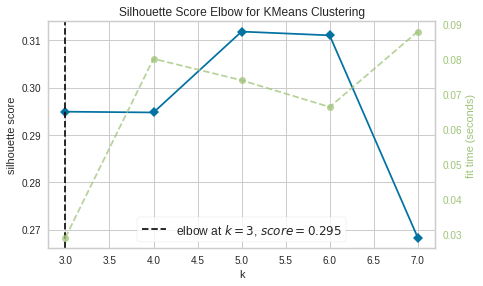

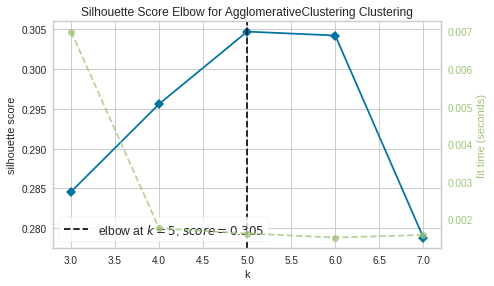

In [163]:
#@title
#Silhouette Score for K means
model = KMeans(random_state=100)

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True, size=(500, 300))
visualizer.fit(pca_df)
visualizer.show()

#Silhouette Score for Hierarchical clustering
model = AgglomerativeClustering(linkage='ward', affinity='euclidean')

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True, size=(500, 300))
visualizer.fit(pca_df)
visualizer.show()

4 clusters: 
Cluster 1: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Austria', 'Belgium', 'Croatia', 'Czechia', 'Netherlands', 'Slovakia', 'Slovenia']
Cluster 4: 
['Estonia', 'Georgia', 'Latvia', 'Lithuania', 'Serbia']


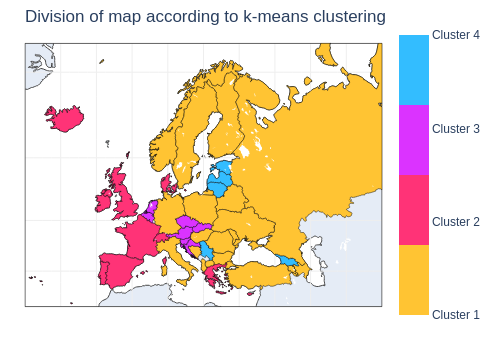

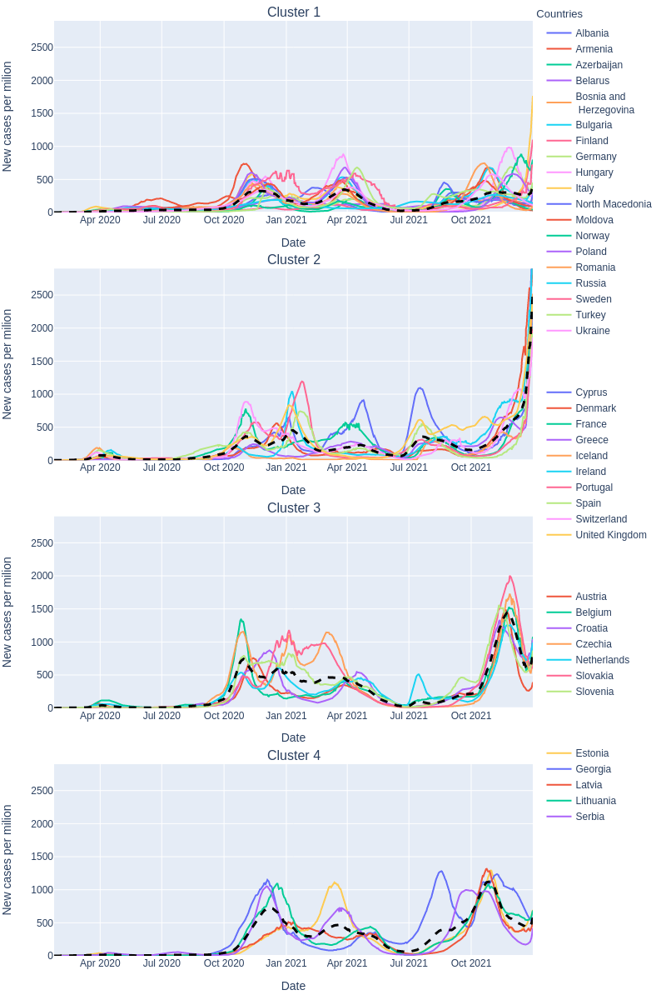

In [164]:
#@title
#n+1 number of clusters
n=3
print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
kmeans = KMeans(n_clusters=n+1, random_state=100).fit(data)
kmeans.labels_

clusters_list = []
#loop responsible for creating list of lists of countries splited by clustering and printing them
for iterator in range(n+1):
  print(f"Cluster {iterator+1}: ")
  cluster_list = []
  for iterator2, country in enumerate(data.index):
    if kmeans.labels_[iterator2] == iterator:
      cluster_list.append(country)
  print(cluster_list, end="\n")
  clusters_list.append(cluster_list)

clusters_list_km_pca = clusters_list.copy()


#setting choropleth parameters
config = dict(
  type = 'choropleth',
  locations = data.index.values,
  locationmode='country names',
  z=np.append(kmeans.labels_+1, n+1).astype(int),
  colorscale=[(0.00, "rgb(255, 196, 51)"),   (0.25, "rgb(255, 196, 51)"),
              (0.25, "rgb(255, 51, 119)"), (0.5, "rgb(255, 51, 119)"),
              (0.5, "rgb(219, 51, 255)"),  (0.75, "rgb(219, 51, 255)"),
              (0.75, "rgb(51, 189, 255)"),  (1.00, "rgb(51, 189, 255)")],
  marker_line_color='black',
  marker_line_width=0.5,
  colorbar=dict(nticks=4, tickprefix='Cluster ')
  )

config_coloraxis=dict(
  tickvals=[el for el in range(1,n+2)], 
  title='Clusters', 
  ticks='outside'
  )

config_margin=dict(
  r=25, 
  t=25, 
  l=25,
  b=25
  )

#plotting first part of the figure
fig = go.Figure(data=[config])
fig.update_geos(scope='world', lataxis_showgrid=True, lonaxis_showgrid=True, 
                projection_type='mercator', lataxis_range=[40,75], lonaxis_range=[-30, 70], 
                lataxis_dtick=10, lonaxis_dtick=10, resolution=50)
fig.update_layout(height=350, width=500, margin=config_margin, 
                  coloraxis_colorbar=config_coloraxis, title='Division of map according to k-means clustering', title_y=0.97)
display(Image(fig.to_image()))

#setting legend title parameters(broken method)
config_title=dict(
  text='Countries', 
  x=0.875, 
  y=0.99,
  font_size=13, 
  font_family='Arial'
)

#plotting second part of the figure
fig2 = subplots.make_subplots(rows=int(n+1), cols=1, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], vertical_spacing=0.06)
for iterator, cluster in enumerate(clusters_list):
  #calculating mean for each cluster
  frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                      columns=['Mean'], index=europe_df_rolled.index)
  for country in cluster:
    #breaking long country names
    if country == 'Bosnia and Herzegovina':
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='Bosnia and<br> Herzegovina', legendgroup=iterator), row=int(iterator)+1, col=1)
    else:
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country, legendgroup=iterator), row=int(iterator)+1, col=1)
    fig2.update_xaxes(title_text='Date', row=int(iterator)+1, col=1)
    fig2.update_yaxes(title_text='New cases per milion', row=int(iterator)+1, col=1, range=[0,2900])
    
  #adding trace of mean
  fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', 
                            line=dict(color='black', width=3, dash='dash'), legendgroup=iterator, showlegend=False), 
                 row=int(iterator)+1, col=1)

    
fig2.update_layout(height=1200, width=800, margin=config_margin, legend_tracegroupgap=55, title=config_title)
display(Image(fig2.to_image()))

print("\n")

5 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


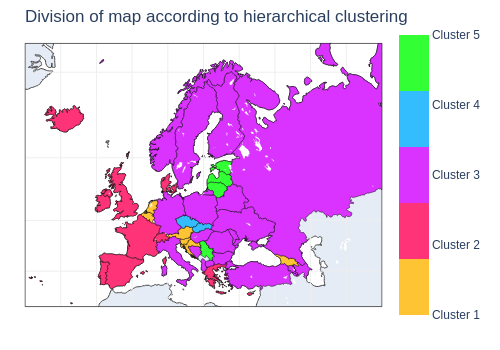

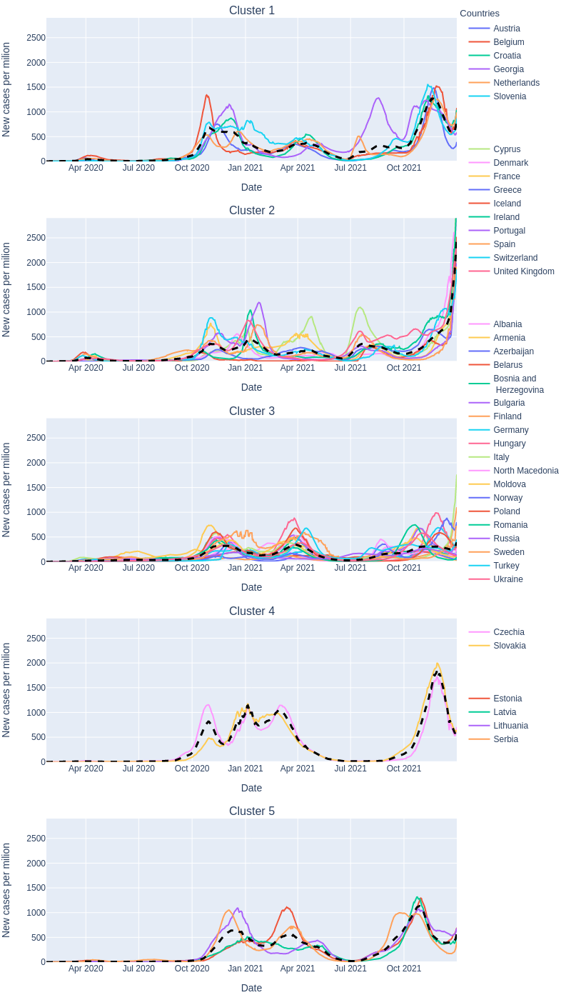

In [165]:
#@title
#n+1 number of clusters
n=4
print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
kmeans = AgglomerativeClustering(n_clusters=n+1, linkage='ward', affinity='euclidean').fit(data)
kmeans.labels_

clusters_list = []
#loop responsible for creating list of lists of countries splited by clustering and printing them
for iterator in range(n+1):
  print(f"Cluster {iterator+1}: ")
  cluster_list = []
  for iterator2, country in enumerate(data.index):
    if kmeans.labels_[iterator2] == iterator:
      cluster_list.append(country)
  print(cluster_list, end="\n")
  clusters_list.append(cluster_list)


#setting choropleth parameters
config = dict(
  type = 'choropleth',
  locations = data.index.values,
  locationmode='country names',
  z=np.append(kmeans.labels_+1, n+1).astype(int),
  colorscale=[(0.00, "rgb(255, 196, 51)"),   (0.2, "rgb(255, 196, 51)"),
              (0.2, "rgb(255, 51, 119)"), (0.4, "rgb(255, 51, 119)"),
              (0.4, "rgb(219, 51, 255)"),  (0.6, "rgb(219, 51, 255)"),
              (0.6, "rgb(51, 189, 255)"),  (0.8, "rgb(51, 189, 255)"),
              (0.8, "rgb(51, 255, 53)"),  (1.0, "rgb(51, 255, 53)")],
  marker_line_color='black',
  marker_line_width=0.5,
  colorbar=dict(nticks=5, tickprefix='Cluster ')
  )

config_coloraxis=dict(
  tickvals=[el for el in range(1,n+2)], 
  title='Clusters', 
  ticks='outside'
  )

config_margin=dict(
  r=25, 
  t=25, 
  l=25,
  b=25
  )

#plotting first part of the figure
fig = go.Figure(data=[config])
fig.update_geos(scope='world', lataxis_showgrid=True, lonaxis_showgrid=True, 
                projection_type='mercator', lataxis_range=[40,75], lonaxis_range=[-30, 70], 
                lataxis_dtick=10, lonaxis_dtick=10, resolution=50)
fig.update_layout(height=350, width=500, margin=config_margin, 
                  coloraxis_colorbar=config_coloraxis, title='Division of map according to hierarchical clustering', title_y=0.97)
display(Image(fig.to_image()))

#setting legend title parameters(broken method)
config_title=dict(
  text='Countries', 
  x=0.875, 
  y=0.99,
  font_size=13, 
  font_family='Arial'
)

#plotting second part of the figure
fig2 = subplots.make_subplots(rows=int(n+1), cols=1, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], vertical_spacing=0.06)
for iterator, cluster in enumerate(clusters_list):
  #calculating mean for each cluster
  frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                      columns=['Mean'], index=europe_df_rolled.index)
  for country in cluster:
    #breaking long country names
    if country == 'Bosnia and Herzegovina':
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='Bosnia and<br> Herzegovina', legendgroup=iterator), row=int(iterator)+1, col=1)
    else:
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country, legendgroup=iterator), row=int(iterator)+1, col=1)
    fig2.update_xaxes(title_text='Date', row=int(iterator)+1, col=1)
    fig2.update_yaxes(title_text='New cases per milion', row=int(iterator)+1, col=1, range=[0,2900])
    
  #adding trace of mean
  fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', 
                            line=dict(color='black', width=3, dash='dash'), legendgroup=iterator, showlegend=False), 
                 row=int(iterator)+1, col=1)

    
fig2.update_layout(height=1400, width=800, margin=config_margin, legend_tracegroupgap=55, title=config_title)
display(Image(fig2.to_image()))

print("\n")

Prediction

In [166]:
model = RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5, n_estimators=500, oob_score=True, random_state=100)
#model = XGBRegressor(booster='gblinear', learning_rate=0.33, max_depth=1, min_child_weight=0, n_estimators=500, n_jobs=-1, objective='reg:squarederror', random_state=100)


model.fit(X_train_df, y_train_df.values.ravel())

predictions = pd.DataFrame(model.predict(predict_df.T), index=predict_df.T.index, columns=['predicted_right_base'])
validation = pd.DataFrame(model.predict(validate_df.T), index=validate_df.T.index, columns=['predicted_right_base'])

pd.concat([predict_df.T, predictions], axis=1)

,height,left_base,left_x,left_y,predicted_right_base
Albania,305.711214,77.000000,519.000000,1.055500,50.355954
Armenia,650.711714,125.000000,514.000000,28.643643,51.631466
Austria,1447.121714,125.000000,542.000000,35.340357,52.409304
Azerbaijan,308.047929,27.984443,551.015557,48.581857,53.759641
Belarus,143.097429,118.000000,516.000000,70.522571,42.052632
Belgium,1398.780071,123.000000,549.000000,130.540500,41.590558
Bosnia and Herzegovina,241.509571,125.000000,535.000000,5.257429,49.328807
Bulgaria,667.096143,113.000000,530.000000,9.141786,51.344494
Croatia,1308.745000,125.000000,533.000000,22.720357,52.457378
Cyprus,3140.281643,87.000000,619.000000,103.873500,43.214570




 peaks before removing subpeaks:  [319 389 596 660]
 subpeaks indexes:  [0, 3]
 peaks:  [389 596]
 left angles:  [67.33790474 75.8628694 ]
 right angles:  [79.60767563]


/usr/local/lib/python3.8/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



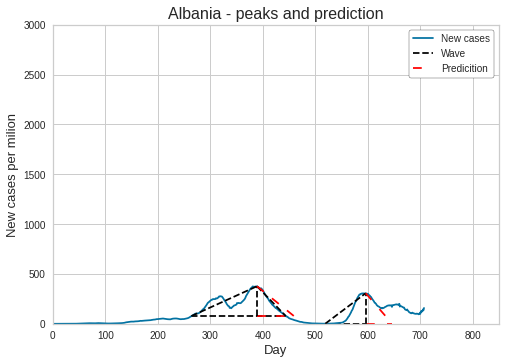



 peaks before removing subpeaks:  [158 280 430 639]
 subpeaks indexes:  []
 peaks:  [158 280 430 639]
 left angles:  [72.73655613 85.0531286  79.49292912 79.12609497]
 right angles:  [70.40619187 81.87960302 79.04988796]


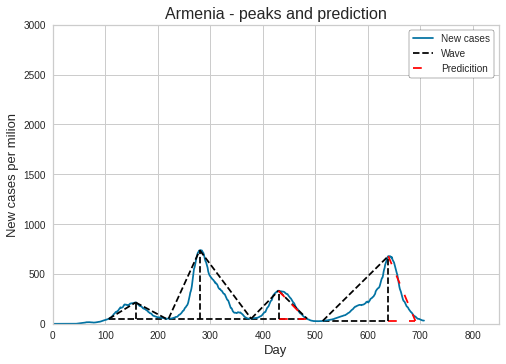



 peaks before removing subpeaks:  [ 64 294 427 667]
 subpeaks indexes:  []
 peaks:  [ 64 294 427 667]
 left angles:  [73.83542121 87.32332675 76.41855754 85.06313855]
 right angles:  [48.53363974 82.18040782 78.0404728 ]


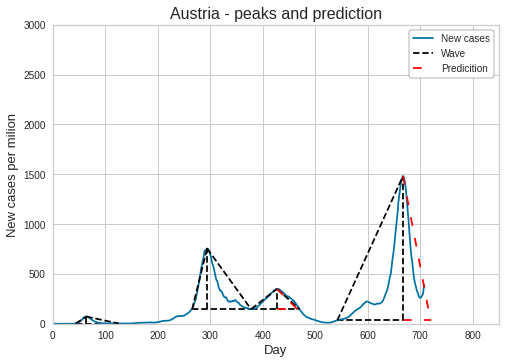



 peaks before removing subpeaks:  [159 319 443 579 647]
 subpeaks indexes:  [4]
 peaks:  [159 319 443 579]
 left angles:  [41.68404255 80.45746227 71.69451837 84.80924475]
 right angles:  [25.66282768 81.32532421 74.97632166]


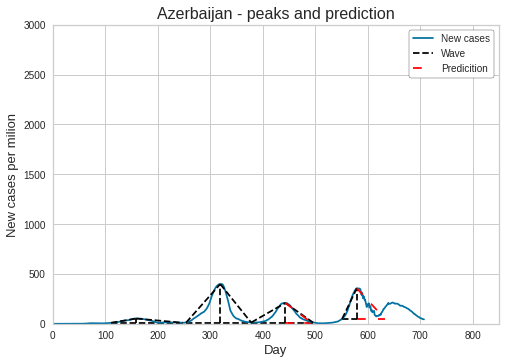



 peaks before removing subpeaks:  [116 328 634]
 subpeaks indexes:  []
 peaks:  [116 328 634]
 left angles:  [63.34678756 67.27743888 50.49056479]
 right angles:  [48.23580361 46.98198731]


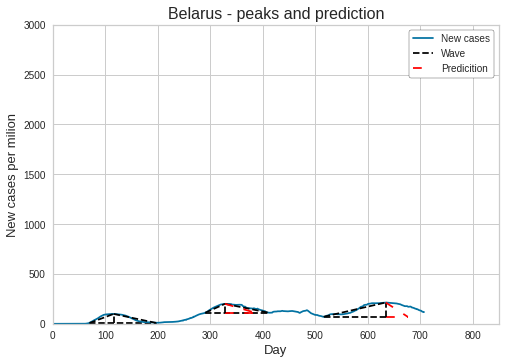



 peaks before removing subpeaks:  [ 76 276 429 672]
 subpeaks indexes:  []
 peaks:  [ 76 276 429 672]
 left angles:  [75.62172801 88.52957518 72.89100347 84.97469219]
 right angles:  [59.12478886 86.84969583 77.55688277]


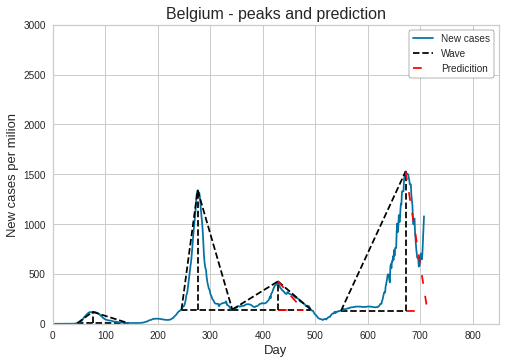



 peaks before removing subpeaks:  [285 429 660]
 subpeaks indexes:  []
 peaks:  [285 429 660]
 left angles:  [85.67894085 81.93038127 62.63491791]
 right angles:  [78.00577018 83.79205423]


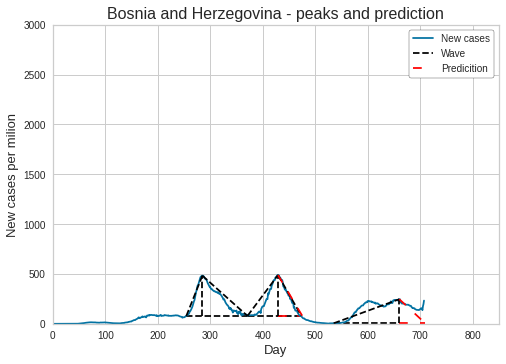



 peaks before removing subpeaks:  [297 426 643 706]
 subpeaks indexes:  [3]
 peaks:  [297 426 643]
 left angles:  [84.90325421 81.87775513 80.38587804]
 right angles:  [81.80966945 83.54021295]


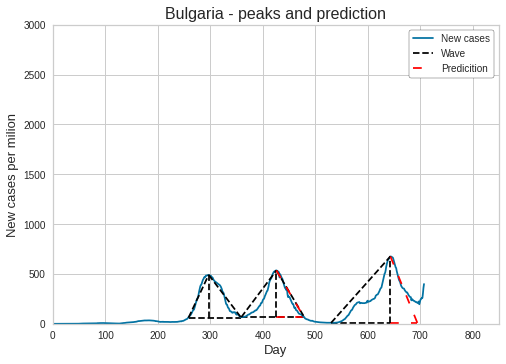



 peaks before removing subpeaks:  [318 447 658]
 subpeaks indexes:  []
 peaks:  [318 447 658]
 left angles:  [85.59507713 82.79449295 84.54415283]
 right angles:  [84.97253582 84.7724966 ]


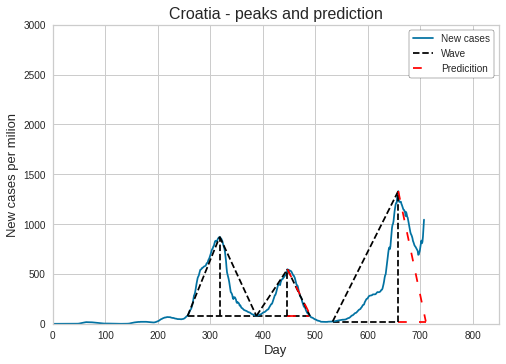



 peaks before removing subpeaks:  [347 457 541 706]
 subpeaks indexes:  []
 peaks:  [347 457 541 706]
 left angles:  [81.72647743 85.07250066 88.41529369 88.41305378]
 right angles:  [85.49846547 87.920896   85.52820774]


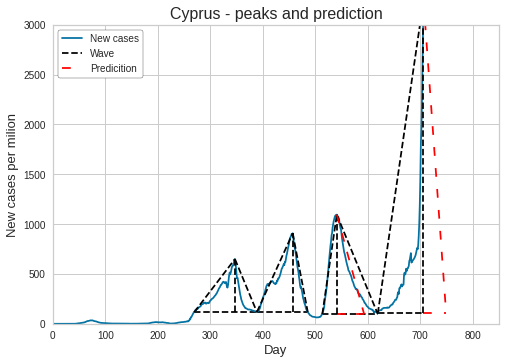



 peaks before removing subpeaks:  [279 402 673]
 subpeaks indexes:  []
 peaks:  [279 402 673]
 left angles:  [88.21539275 83.76266536 86.06101407]
 right angles:  [87.65049905 86.82761559]


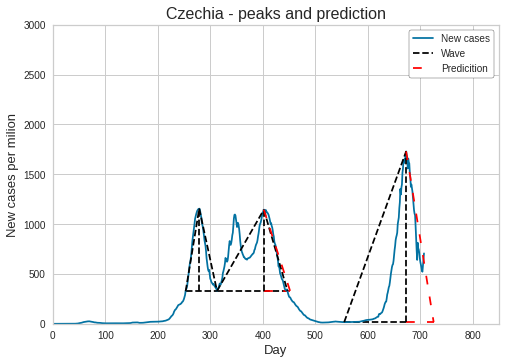



 peaks before removing subpeaks:  [ 72 328 475 572 706]
 subpeaks indexes:  []
 peaks:  [ 72 328 475 572 706]
 left angles:  [53.32386819 82.36582513 50.93375007 67.61386159 87.90533292]
 right angles:  [25.48635958 83.37305723 74.30977007 74.21748329]


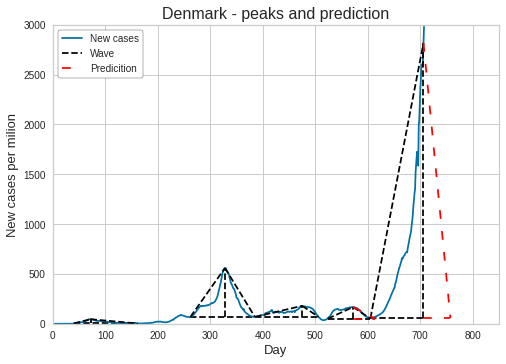



 peaks before removing subpeaks:  [ 69 346 414 645 706]
 subpeaks indexes:  [1, 4]
 peaks:  [ 69 414 645]
 left angles:  [55.07315809 82.70549282 84.3933072 ]
 right angles:  [26.30801079 85.84341318]


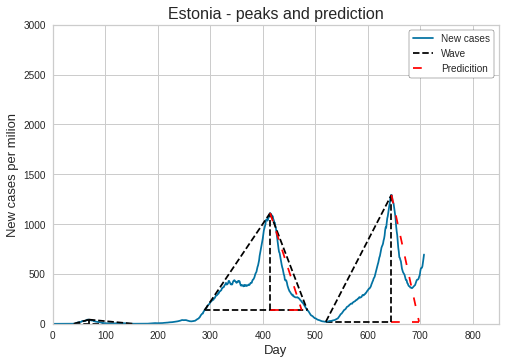



 peaks before removing subpeaks:  [314 415 563 706]
 subpeaks indexes:  [0]
 peaks:  [415 563 706]
 left angles:  [34.33070948 72.93408502 83.91759591]
 right angles:  [63.43563423 55.28234453]


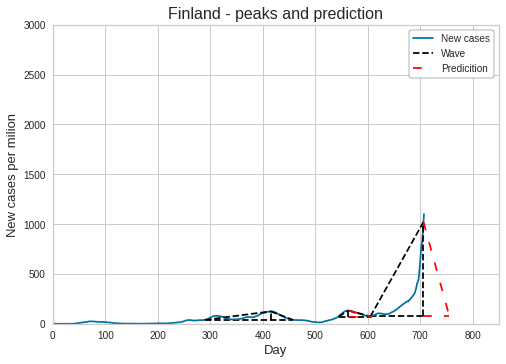



 peaks before removing subpeaks:  [ 82 283 430 564 706]
 subpeaks indexes:  []
 peaks:  [ 82 283 430 564 706]
 left angles:  [71.78196329 86.00677207 73.92136807 83.66473058 87.79105399]
 right angles:  [72.01228591 87.33452787 82.79809592 78.57188972]


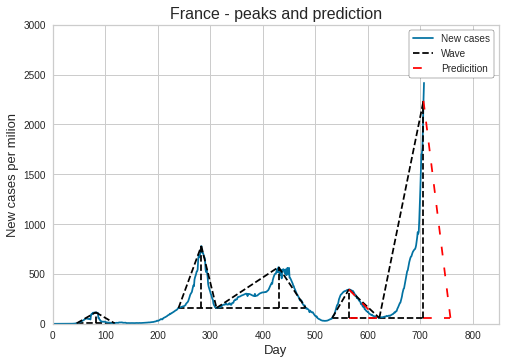



 peaks before removing subpeaks:  [315 474 572 654]
 subpeaks indexes:  []
 peaks:  [315 474 572 654]
 left angles:  [86.35471983 79.11326038 87.84144143 87.02432859]
 right angles:  [85.26187947 77.5316294  87.34877956]


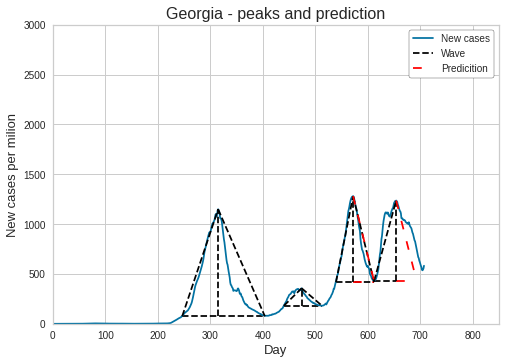



 peaks before removing subpeaks:  [ 66 329 451 674]
 subpeaks indexes:  []
 peaks:  [ 66 329 451 674]
 left angles:  [70.47643156 73.99880606 68.82055484 79.38256666]
 right angles:  [39.9346871  74.12719004 78.86476959]


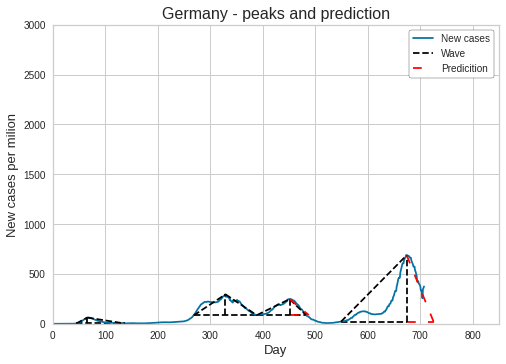



 peaks before removing subpeaks:  [295 435 572 706]
 subpeaks indexes:  []
 peaks:  [295 435 572 706]
 left angles:  [81.88330511 72.80637774 71.18724081 87.54415992]
 right angles:  [71.26618196 72.46505335 69.10729925]


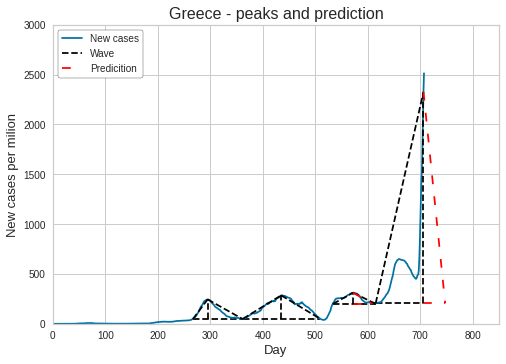



 peaks before removing subpeaks:  [312 427 671]
 subpeaks indexes:  []
 peaks:  [312 427 671]
 left angles:  [83.48036941 85.44941749 83.38051751]
 right angles:  [82.96903723 86.67700365]


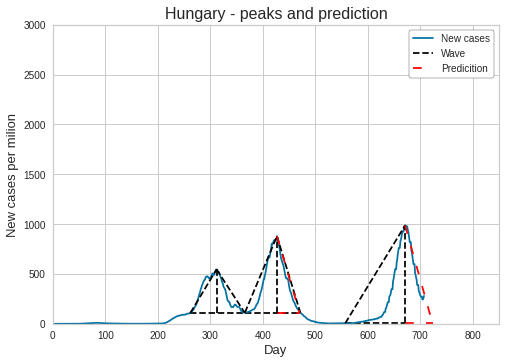



 peaks before removing subpeaks:  [ 63 262 557 706]
 subpeaks indexes:  []
 peaks:  [ 63 262 557 706]
 left angles:  [80.25557497 69.12040172 86.02577322 87.29684551]
 right angles:  [75.48383367 59.7938304  80.60037295]


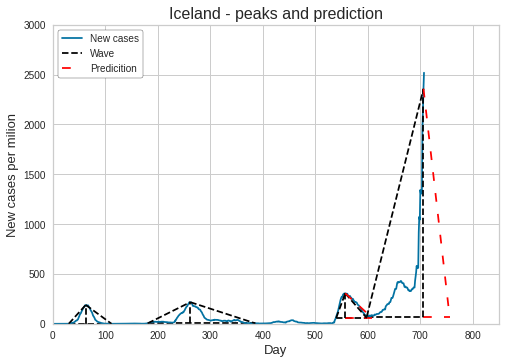



 peaks before removing subpeaks:  [ 84 270 351 574 706]
 subpeaks indexes:  []
 peaks:  [ 84 270 351 574 706]
 left angles:  [75.90021609 78.69606182 88.46097904 77.29913411 87.6953853 ]
 right angles:  [65.39881829 76.09952378 84.48374478 81.53464635]


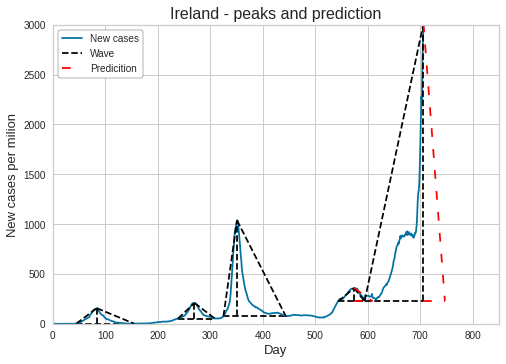



 peaks before removing subpeaks:  [ 62 294 417 579 706]
 subpeaks indexes:  []
 peaks:  [ 62 294 417 579 706]
 left angles:  [71.83196653 86.36852461 77.75939572 59.12830101 87.00433853]
 right angles:  [41.48763317 78.20896237 76.7238607  54.2438615 ]


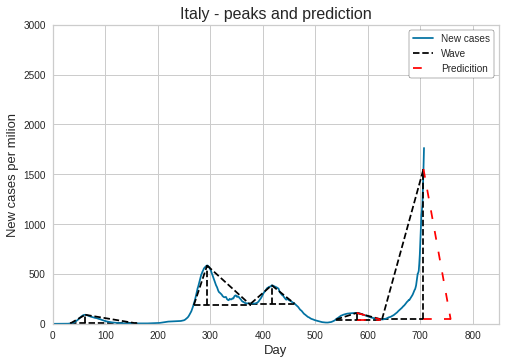



 peaks before removing subpeaks:  [346 467 639 706]
 subpeaks indexes:  [3]
 peaks:  [346 467 639]
 left angles:  [81.26936765 70.74617007 85.36751155]
 right angles:  [72.76479662 81.38651679]


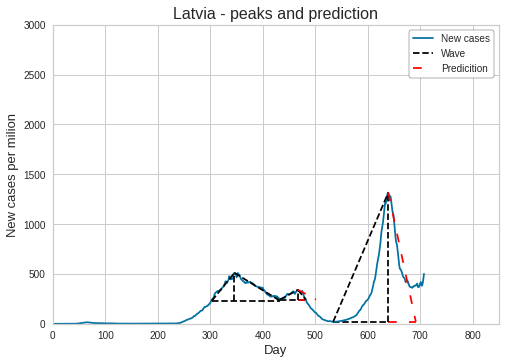



 peaks before removing subpeaks:  [329 467 641 706]
 subpeaks indexes:  [3]
 peaks:  [329 467 641]
 left angles:  [86.51213847 78.07822085 83.78167728]
 right angles:  [85.15701378 85.01437819]


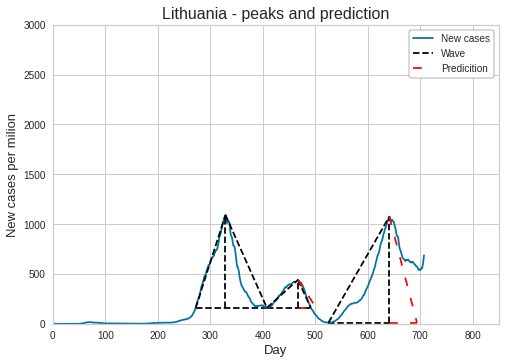



 peaks before removing subpeaks:  [297 432 576 653]
 subpeaks indexes:  [3]
 peaks:  [297 432 576]
 left angles:  [84.27355155 80.8199853  87.2459965 ]
 right angles:  [79.73029882 85.5043515 ]


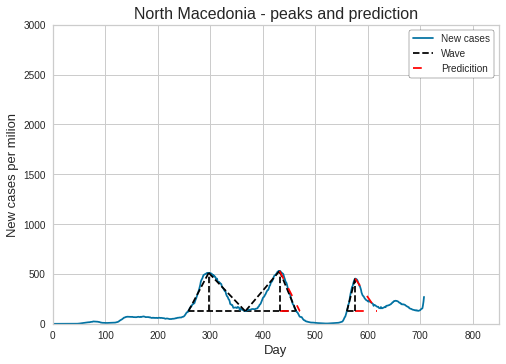



 peaks before removing subpeaks:  [146 256 316 424 634]
 subpeaks indexes:  [1]
 peaks:  [146 316 424 634]
 left angles:  [71.57558212 73.33047126 78.90011923 75.0299533 ]
 right angles:  [59.01453189 82.52332343 84.85082659]


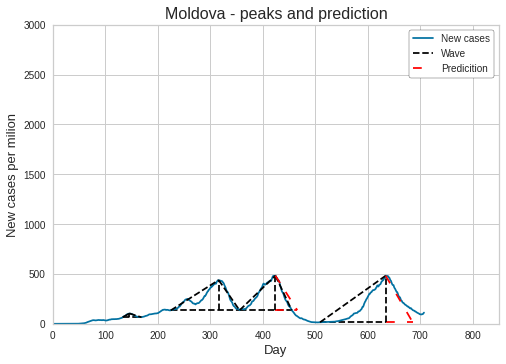



 peaks before removing subpeaks:  [ 78 330 453 538 674]
 subpeaks indexes:  []
 peaks:  [ 78 330 453 538 674]
 left angles:  [58.20552312 79.22832618 74.69485817 88.18635507 86.90342794]
 right angles:  [34.81532302 82.83115542 82.77460896 80.30296214]


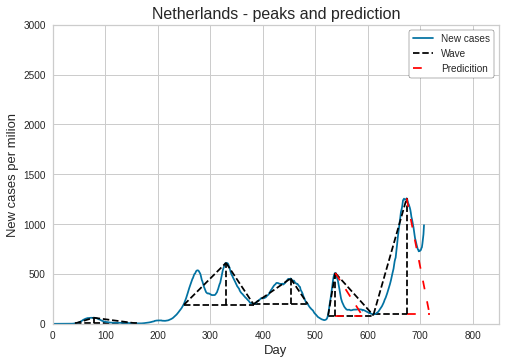



 peaks before removing subpeaks:  [ 64 346 421 588 690]
 subpeaks indexes:  []
 peaks:  [ 64 346 421 588 690]
 left angles:  [57.25636038 42.04375885 72.28315111 81.40481508 85.47490921]
 right angles:  [22.48224055 63.98364377 58.5772379  78.36935203]


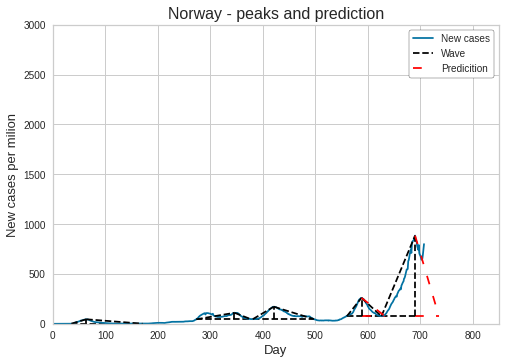



 peaks before removing subpeaks:  [291 430 676]
 subpeaks indexes:  []
 peaks:  [291 430 676]
 left angles:  [86.52924791 84.37671071 77.89506403]
 right angles:  [80.00833916 86.33158865]


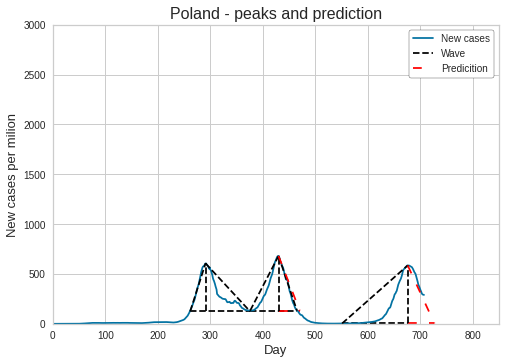



 peaks before removing subpeaks:  [ 71 295 366 542 706]
 subpeaks indexes:  [1]
 peaks:  [ 71 366 542 706]
 left angles:  [74.87080711 83.72562786 80.25283642 87.12458305]
 right angles:  [27.04667264 87.74531416 73.22841329]


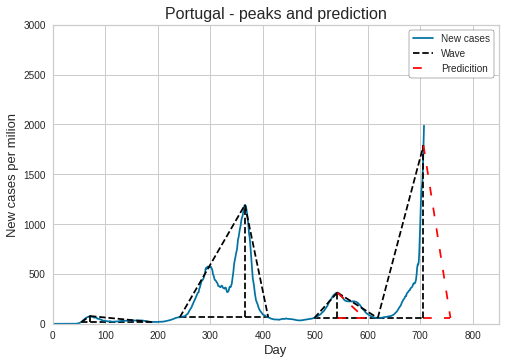



 peaks before removing subpeaks:  [294 428 635 706]
 subpeaks indexes:  [3]
 peaks:  [294 428 635]
 left angles:  [82.88507522 73.5701357  81.96664517]
 right angles:  [74.34086653 80.54941548]


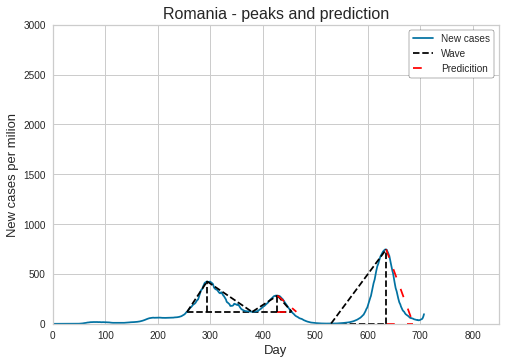



 peaks before removing subpeaks:  [106 335 537 652]
 subpeaks indexes:  []
 peaks:  [106 335 537 652]
 left angles:  [65.67843786 58.00267178 65.53899576 67.08954062]
 right angles:  [21.00428941 47.49566788 40.72962605]


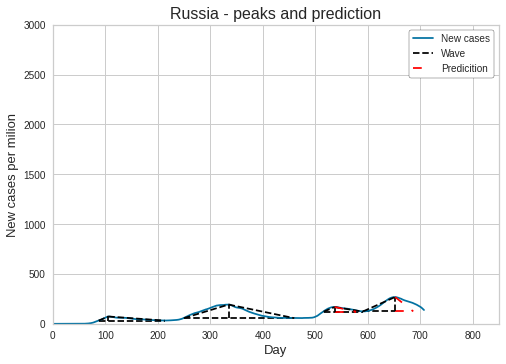



 peaks before removing subpeaks:  [ 83 181 314 422 608 706]
 subpeaks indexes:  [5]
 peaks:  [ 83 181 314 422 608]
 left angles:  [58.49445173 47.52878386 87.81685724 83.35028918 84.89829778]
 right angles:  [42.39891983 37.32379516 86.46673802 85.20182714]


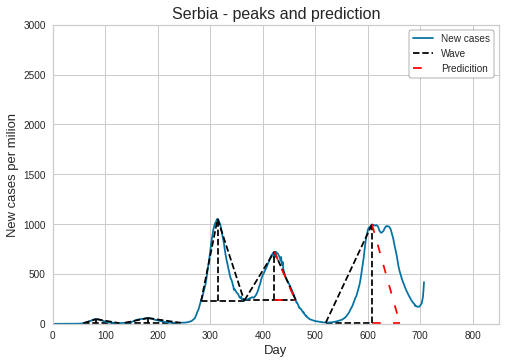



 peaks before removing subpeaks:  [280 347 673]
 subpeaks indexes:  [0]
 peaks:  [347 673]
 left angles:  [85.00311392 86.41071271]
 right angles:  [83.32824973]


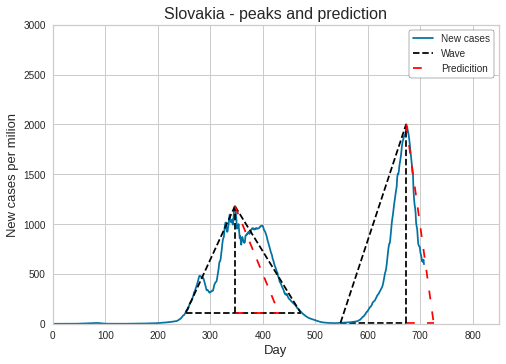



 peaks before removing subpeaks:  [280 346 430 657]
 subpeaks indexes:  [0, 2]
 peaks:  [346 657]
 left angles:  [82.06871038 85.35156059]
 right angles:  [78.0107499]


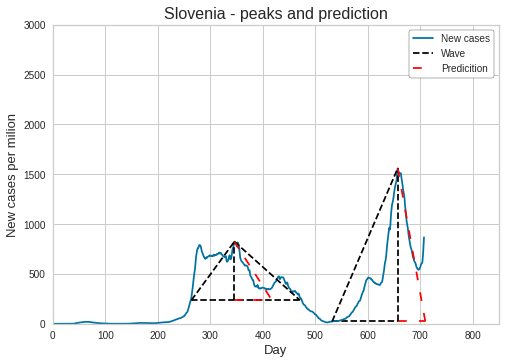



 peaks before removing subpeaks:  [ 66 284 363 450 543 706]
 subpeaks indexes:  []
 peaks:  [ 66 284 363 450 543 706]
 left angles:  [81.22902992 75.92625303 85.62524513 70.68395817 86.2242685  88.02511115]
 right angles:  [58.94417305 83.48003006 86.58187465 66.39457647 83.39915698]


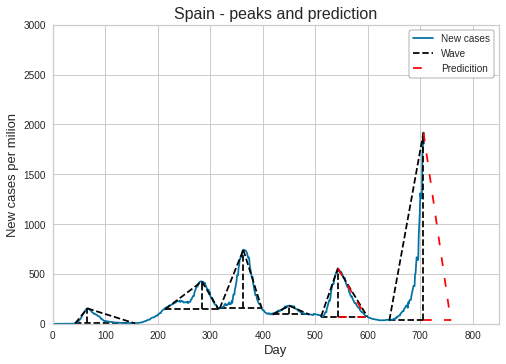



 peaks before removing subpeaks:  [146 345 443 593 706]
 subpeaks indexes:  []
 peaks:  [146 345 443 593 706]
 left angles:  [43.82251551 81.15670885 78.32547726 53.51895687 83.35957701]
 right angles:  [50.44245713 85.30579006 83.06821746 54.02389642]


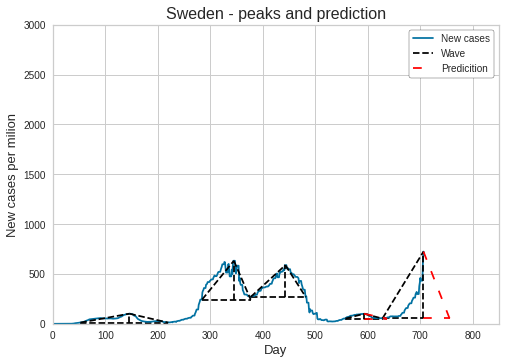



 peaks before removing subpeaks:  [ 63 282 445 599 706]
 subpeaks indexes:  []
 peaks:  [ 63 282 445 599 706]
 left angles:  [77.23884689 88.19688291 70.28532121 79.86397394 87.15084707]
 right angles:  [62.0642402  81.88431267 76.55612391 83.19588952]


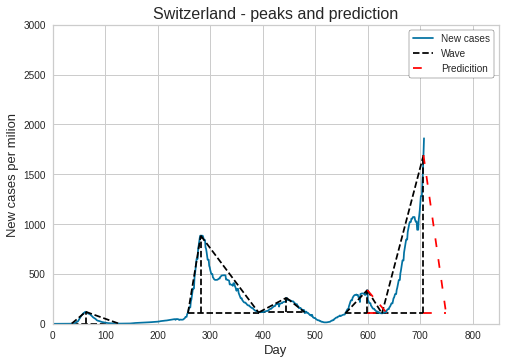



 peaks before removing subpeaks:  [ 82 314 447 560 625 706]
 subpeaks indexes:  [3]
 peaks:  [ 82 314 447 625 706]
 left angles:  [63.45561201 87.68533886 82.3700622  62.72043914 86.08275488]
 right angles:  [23.19052252 80.99258443 85.13107706 64.42328132]


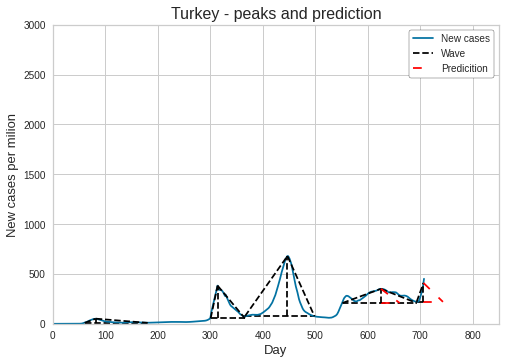



 peaks before removing subpeaks:  [309 440 646]
 subpeaks indexes:  []
 peaks:  [309 440 646]
 left angles:  [76.81926006 78.04955243 77.4047113 ]
 right angles:  [74.51222924 81.30470073]


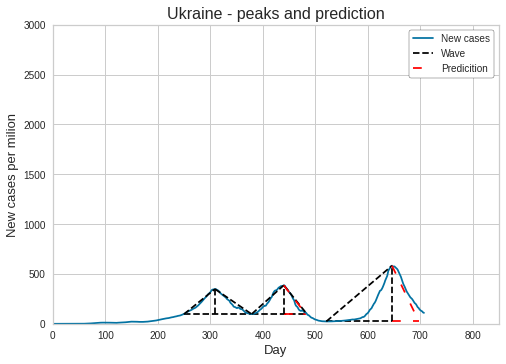



 peaks before removing subpeaks:  [ 90 347 540 636 706]
 subpeaks indexes:  [3]
 peaks:  [ 90 347 540 706]
 left angles:  [57.24172465 81.38091226 86.81618731 86.82544544]
 right angles:  [41.36388631 81.73250402 86.09718467]


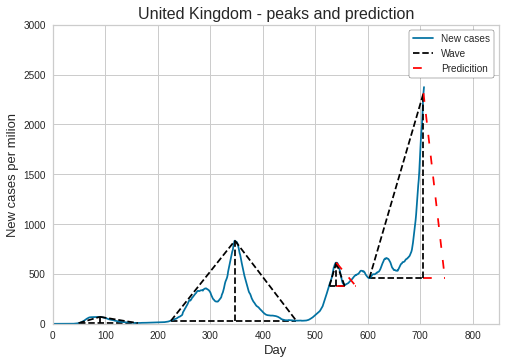

In [167]:
#@title
waves_df = pd.DataFrame()
train_df = pd.DataFrame()
predict_df = pd.DataFrame()
validate_df = pd.DataFrame()

for country in europe_df_rolled.columns:
  tmp_df = europe_df_rolled[country].copy().reset_index(drop=True)

  #temporary changing first and last row for better peaks extraction
  first_day = float(tmp_df.iloc[:1])
  last_day = float(tmp_df.iloc[-1:])

  tmp_df[0] = 0
  tmp_df[len(tmp_df)-1] = 0

  peaks, _ = find_peaks(tmp_df, prominence=35, distance=60)

  results_full = peak_widths(tmp_df, peaks, rel_height=1, wlen=250)
  results_full[0]

  print("\n")
  print("\033[1m peaks before removing subpeaks: \033[0m", peaks, sep=' ')

  #removing subpeaks
  if len(peaks) > 1:
    index_to_del = []
    #if first peak is inside right part of next peak  
    if results_full[2][0] >= results_full[2][1] and results_full[3][0] <= results_full[3][1]:
      index_to_del.append(0)

    for iterator in range(1, len(peaks)-1):
      #if peak is inside left part of previous peak
      if results_full[2][iterator] >= results_full[2][iterator-1] and results_full[3][iterator] <= results_full[3][iterator-1]:
        index_to_del.append(iterator)

      #if peak is inside right part of next peak  
      if results_full[2][iterator] >= results_full[2][iterator+1] and results_full[3][iterator] <= results_full[3][iterator+1]:
        index_to_del.append(iterator)

    iterator = len(peaks)-1
    #if last peak is inside left part of previous peak
    if results_full[2][iterator] >= results_full[2][iterator-1] and results_full[3][iterator] <= results_full[3][iterator-1]:
      index_to_del.append(iterator)
    
    index_to_del = list(set(index_to_del))
    print("\033[1m subpeaks indexes: \033[0m", index_to_del, sep=' ')

    peaks = np.delete(peaks, index_to_del)
    results_full = np.delete(np.array(results_full), index_to_del, axis=1)

    print("\033[1m peaks: \033[0m", peaks, sep=' ')



  #calculating triangle points
  base_left_point = dict()
  base_left_point['x'] = results_full[2]
  base_left_point['y'] = tmp_df[base_left_point['x'].astype(int)].values

  base_right_point = dict()
  base_right_point['x'] = results_full[3]
  base_right_point['y'] = base_left_point['y']

  peak_point = dict()
  peak_point['x'] = peaks
  peak_point['y'] = tmp_df[peaks].values

  #calculating the length of the sides of the triangle
  real_height = peak_point['y'] - base_left_point['y']
  left_side_base = peak_point['x'] - base_left_point['x']
  right_side_base = base_right_point['x'] - peak_point['x']

  #calculating angles
  left_angle = np.degrees(np.arctan(real_height/left_side_base))
  right_angle = np.degrees(np.arctan(real_height/right_side_base))

  #removing last right sides because this is unknown
  right_side_base = right_side_base[:-1]
  right_angle = right_angle[:-1]
  
  print("\033[1m left angles: \033[0m", left_angle, sep=' ')
  print("\033[1m right angles: \033[0m", right_angle, sep=' ')

  #saving wave data
  wave_column, train_column, predict_column, validate_column = create_wave_df_column(country, real_height, left_side_base, right_side_base, base_left_point['x'], base_left_point['y'])
  waves_df = pd.merge(left=waves_df, right=wave_column, how="outer", left_index=True, right_index=True, sort=False)
  train_df = pd.merge(left=train_df, right=train_column, how="outer", left_index=True, right_index=True, sort=False)
  predict_df = pd.merge(left=predict_df, right=predict_column, how="outer", left_index=True, right_index=True, sort=False)
  validate_df = pd.merge(left=validate_df, right=validate_column, how="outer", left_index=True, right_index=True, sort=False)


  #returing original data for plotting
  tmp_df[0] = first_day
  tmp_df[len(tmp_df)-1] = last_day
  
  #ploting
  plt.plot(tmp_df, label='New cases')
  plt.title(f"{country} - peaks and prediction", fontsize=16)
  plt.ylim([0,3000])
  plt.xlim([0,850])
  plt.xlabel('Day', fontsize=13)
  plt.ylabel('New cases per milion', fontsize=13)

  for iterator in range(len(peaks)-1):
    plt.plot([base_left_point['x'][iterator], peak_point['x'][iterator]], 
             [base_left_point['y'][iterator], peak_point['y'][iterator]], 
             color='black', linestyle='--')
    
    plt.plot([peak_point['x'][iterator], base_right_point['x'][iterator]], 
             [peak_point['y'][iterator], base_right_point['y'][iterator]], 
             color='black', linestyle='--')
    
    plt.plot([peak_point['x'][iterator], peak_point['x'][iterator]], 
             [base_left_point['y'][iterator], peak_point['y'][iterator]], 
             color='black', linestyle='--')
    
    plt.hlines(base_left_point['y'][iterator], 
               base_left_point['x'][iterator], 
               base_right_point['x'][iterator], 
               color='black', linestyle='--')
  

  #last peak only have left side because right is unknown
  iterator = len(peaks)-1
  plt.plot([base_left_point['x'][iterator], peak_point['x'][iterator]], 
           [base_left_point['y'][iterator], peak_point['y'][iterator]], 
           color='black', linestyle='--', label='Wave')
  
  plt.plot([peak_point['x'][iterator], peak_point['x'][iterator]], 
           [base_left_point['y'][iterator], peak_point['y'][iterator]], 
           color='black', linestyle='--')
  
  plt.hlines(base_left_point['y'][iterator], 
             base_left_point['x'][iterator], 
             peak_point['x'][iterator], 
             color='black', linestyle='--')
  
  #predictions
  plt.plot([peak_point['x'][iterator], peak_point['x'][iterator] + predictions.T[country]], 
           [peak_point['y'][iterator], base_left_point['y'][iterator]], 
           color='red', linestyle=(0, (5, 7)), label='Predicition')

  plt.hlines(base_left_point['y'][iterator], 
             peak_point['x'][iterator], 
             peak_point['x'][iterator] + predictions.T[country],
             color='red', linestyle=(0, (5, 7)))
  
  #validation
  iterator = len(peaks)-2
  plt.plot([peak_point['x'][iterator], peak_point['x'][iterator] + validation.T[country]], 
           [peak_point['y'][iterator], base_left_point['y'][iterator]], 
           color='red', linestyle=(0, (5, 6)))

  plt.hlines(base_left_point['y'][iterator], 
             peak_point['x'][iterator], 
             peak_point['x'][iterator] + validation.T[country],
             color='red', linestyle=(0, (5, 6)))
  
  plt.legend(frameon=True, framealpha=1, edgecolor='black')
  plt.show()

Kmeans, hclust for triangles

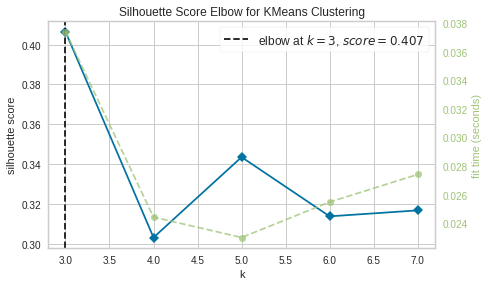

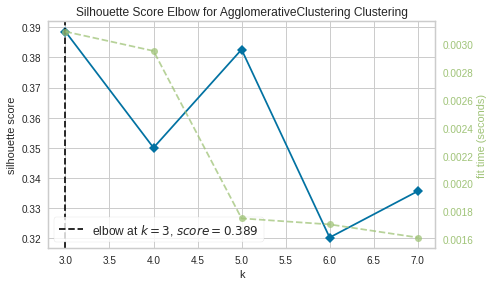

In [168]:
#@title
#Silhouette Score for K means
model = KMeans(random_state=100)

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True, size=(500, 300))
visualizer.fit(waves_df.fillna(0).T)
visualizer.show()

#Silhouette Score for Hierarchical clustering
model = AgglomerativeClustering(linkage='ward', affinity='euclidean')

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True, size=(500, 300))
visualizer.fit(waves_df.fillna(0).T)        
visualizer.show()

3 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 2: 
['Denmark', 'France', 'Ireland', 'Italy', 'Netherlands', 'Norway', 'Serbia', 'Sweden', 'Switzerland']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Germany', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Slovakia', 'Slovenia', 'Spain', 'Turkey', 'Ukraine']


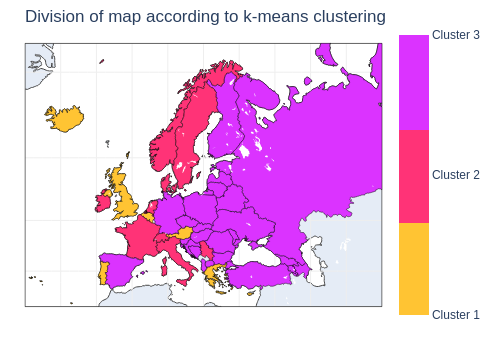

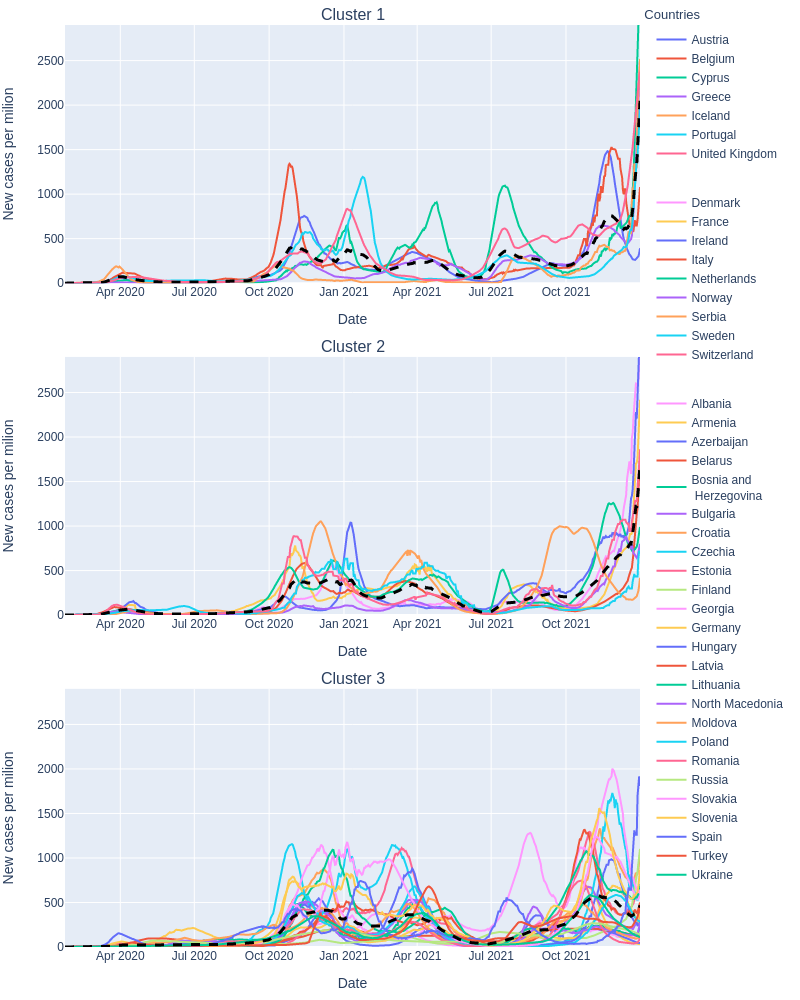

In [169]:
#@title
#n+1 number of clusters
n=2
print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
kmeans = KMeans(n_clusters=n+1, random_state=100).fit(waves_df.fillna(0).T)
kmeans.labels_

clusters_list = []
#loop responsible for creating list of lists of countries splited by clustering and printing them
for iterator in range(n+1):
  print(f"Cluster {iterator+1}: ")
  cluster_list = []
  for iterator2, country in enumerate(data.index):
    if kmeans.labels_[iterator2] == iterator:
      cluster_list.append(country)
  print(cluster_list, end="\n")
  clusters_list.append(cluster_list)

clusters_list_km_triangle = clusters_list.copy()


#setting choropleth parameters
config = dict(
  type = 'choropleth',
  locations = data.index.values,
  locationmode='country names',
  z=np.append(kmeans.labels_+1, n+1).astype(int),
  colorscale=[(0.00, "rgb(255, 196, 51)"),   (0.33, "rgb(255, 196, 51)"),
              (0.33, "rgb(255, 51, 119)"), (0.66, "rgb(255, 51, 119)"),
              (0.66, "rgb(219, 51, 255)"),  (1.00, "rgb(219, 51, 255)")],
  marker_line_color='black',
  marker_line_width=0.5,
  colorbar=dict(nticks=3, tickprefix='Cluster ')
  )

config_coloraxis=dict(
  tickvals=[el for el in range(1,n+2)], 
  title='Clusters', 
  ticks='outside'
  )

config_margin=dict(
  r=25, 
  t=25, 
  l=25,
  b=25
  )

#plotting first part of the figure
fig = go.Figure(data=[config])
fig.update_geos(scope='world', lataxis_showgrid=True, lonaxis_showgrid=True, 
                projection_type='mercator', lataxis_range=[40,75], lonaxis_range=[-30, 70], 
                lataxis_dtick=10, lonaxis_dtick=10, resolution=50)
fig.update_layout(height=350, width=500, margin=config_margin, 
                  coloraxis_colorbar=config_coloraxis, title='Division of map according to k-means clustering', title_y=0.97)
display(Image(fig.to_image()))

#setting legend title parameters(broken method)
config_title=dict(
  text='Countries', 
  x=0.875, 
  y=0.99,
  font_size=13, 
  font_family='Arial'
)

#plotting second part of the figure
fig2 = subplots.make_subplots(rows=int(n+1), cols=1, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], vertical_spacing=0.08)
for iterator, cluster in enumerate(clusters_list):
  #calculating mean for each cluster
  frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                      columns=['Mean'], index=europe_df_rolled.index)
  for country in cluster:
    #breaking long country names
    if country == 'Bosnia and Herzegovina':
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='Bosnia and<br> Herzegovina', legendgroup=iterator), row=int(iterator)+1, col=1)
    else:
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country, legendgroup=iterator), row=int(iterator)+1, col=1)
    fig2.update_xaxes(title_text='Date', row=int(iterator)+1, col=1)
    fig2.update_yaxes(title_text='New cases per milion', row=int(iterator)+1, col=1, range=[0,2900])
    
  #adding trace of mean
  fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', 
                            line=dict(color='black', width=3, dash='dash'), legendgroup=iterator, showlegend=False), 
                 row=int(iterator)+1, col=1)

    
fig2.update_layout(height=1000, width=800, margin=config_margin, legend_tracegroupgap=30, title=config_title)
display(Image(fig2.to_image()))

print("\n")

3 clusters: 
Cluster 1: 
['Denmark', 'France', 'Ireland', 'Italy', 'Netherlands', 'Norway', 'Serbia', 'Spain', 'Sweden', 'Switzerland', 'Turkey']
Cluster 2: 
['Austria', 'Belgium', 'Cyprus', 'Greece', 'Iceland', 'Portugal', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czechia', 'Estonia', 'Finland', 'Georgia', 'Germany', 'Hungary', 'Latvia', 'Lithuania', 'North Macedonia', 'Moldova', 'Poland', 'Romania', 'Russia', 'Slovakia', 'Slovenia', 'Ukraine']


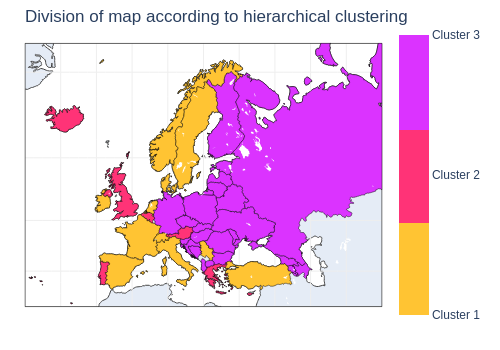

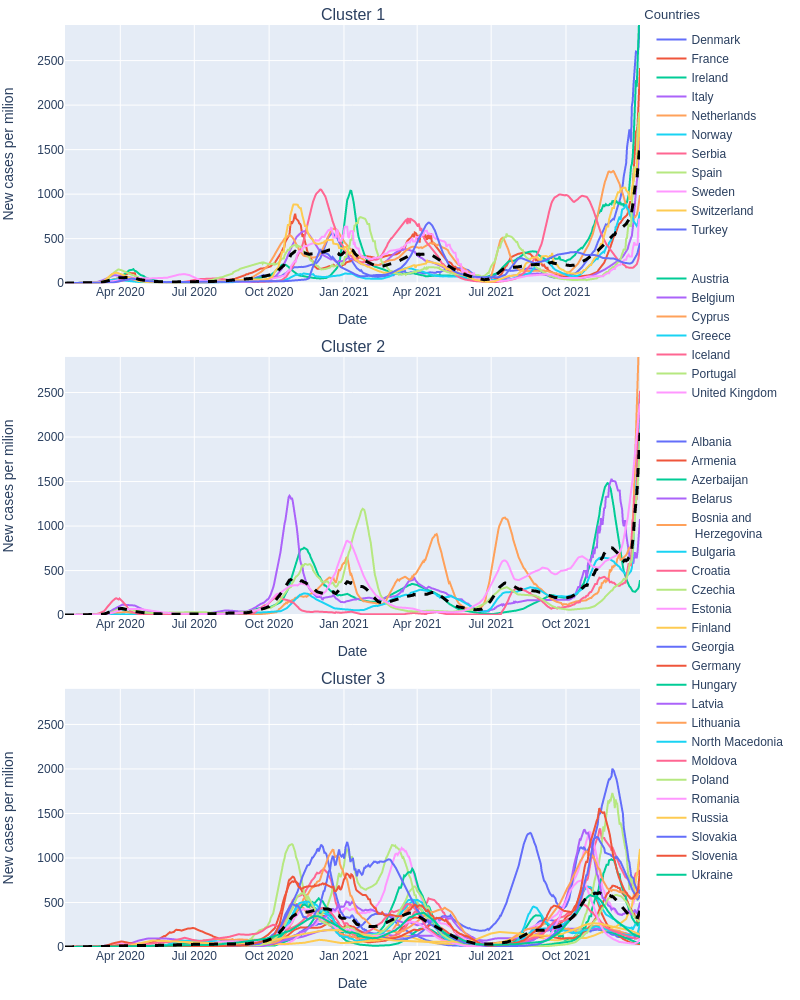

In [170]:
#@title
#n+1 number of clusters
n=2
print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
kmeans = AgglomerativeClustering(n_clusters=n+1, linkage='ward', affinity='euclidean').fit(waves_df.fillna(0).T)
kmeans.labels_

clusters_list = []
#loop responsible for creating list of lists of countries splited by clustering and printing them
for iterator in range(n+1):
  print(f"Cluster {iterator+1}: ")
  cluster_list = []
  for iterator2, country in enumerate(data.index):
    if kmeans.labels_[iterator2] == iterator:
      cluster_list.append(country)
  print(cluster_list, end="\n")
  clusters_list.append(cluster_list)


#setting choropleth parameters
config = dict(
  type = 'choropleth',
  locations = data.index.values,
  locationmode='country names',
  z=np.append(kmeans.labels_+1, n+1).astype(int),
  colorscale=[(0.00, "rgb(255, 196, 51)"),   (0.33, "rgb(255, 196, 51)"),
              (0.33, "rgb(255, 51, 119)"), (0.66, "rgb(255, 51, 119)"),
              (0.66, "rgb(219, 51, 255)"),  (1.00, "rgb(219, 51, 255)")],
  marker_line_color='black',
  marker_line_width=0.5,
  colorbar=dict(nticks=3, tickprefix='Cluster ')
  )

config_coloraxis=dict(
  tickvals=[el for el in range(1,n+2)], 
  title='Clusters', 
  ticks='outside'
  )

config_margin=dict(
  r=25, 
  t=25, 
  l=25,
  b=25
  )

#plotting first part of the figure
fig = go.Figure(data=[config])
fig.update_geos(scope='world', lataxis_showgrid=True, lonaxis_showgrid=True, 
                projection_type='mercator', lataxis_range=[40,75], lonaxis_range=[-30, 70], 
                lataxis_dtick=10, lonaxis_dtick=10, resolution=50)
fig.update_layout(height=350, width=500, margin=config_margin, 
                  coloraxis_colorbar=config_coloraxis, title='Division of map according to hierarchical clustering', title_y=0.97)
display(Image(fig.to_image()))

#setting legend title parameters(broken method)
config_title=dict(
  text='Countries', 
  x=0.875, 
  y=0.99,
  font_size=13, 
  font_family='Arial'
)

#plotting second part of the figure
fig2 = subplots.make_subplots(rows=int(n+1), cols=1, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], vertical_spacing=0.08)
for iterator, cluster in enumerate(clusters_list):
  #calculating mean for each cluster
  frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                      columns=['Mean'], index=europe_df_rolled.index)
  for country in cluster:
    #breaking long country names
    if country == 'Bosnia and Herzegovina':
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='Bosnia and<br> Herzegovina', legendgroup=iterator), row=int(iterator)+1, col=1)
    else:
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country, legendgroup=iterator), row=int(iterator)+1, col=1)
    fig2.update_xaxes(title_text='Date', row=int(iterator)+1, col=1)
    fig2.update_yaxes(title_text='New cases per milion', row=int(iterator)+1, col=1, range=[0,2900])
    
  #adding trace of mean
  fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', 
                            line=dict(color='black', width=3, dash='dash'), legendgroup=iterator, showlegend=False), 
                 row=int(iterator)+1, col=1)

    
fig2.update_layout(height=1000, width=800, margin=config_margin, legend_tracegroupgap=30, title=config_title)
display(Image(fig2.to_image()))

print("\n")

Kmeans, hclust for pca+triangles

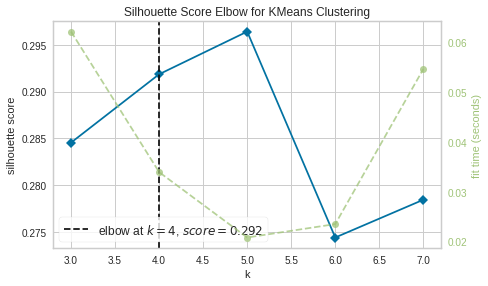

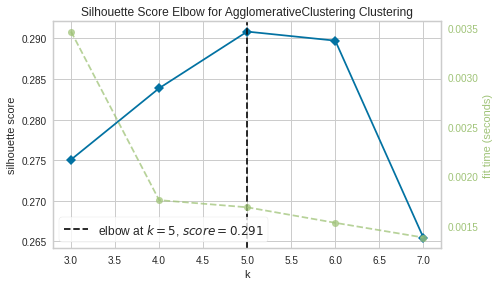

In [171]:
#@title
#Silhouette Score for K means
model = KMeans(random_state=100)

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True, size=(500, 300))
visualizer.fit(pca_waves_df)
visualizer.show()

#Silhouette Score for Hierarchical clustering
model = AgglomerativeClustering(linkage='ward', affinity='euclidean')

visualizer = KElbowVisualizer(model, k=(3,8),metric='silhouette', timings= True, size=(500, 300))
visualizer.fit(pca_waves_df)        
visualizer.show()

5 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'Italy', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 3: 
['Czechia', 'Slovakia']
Cluster 4: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


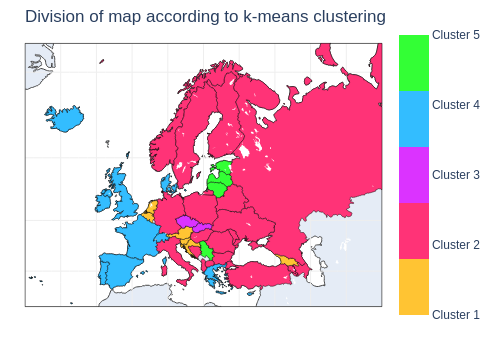

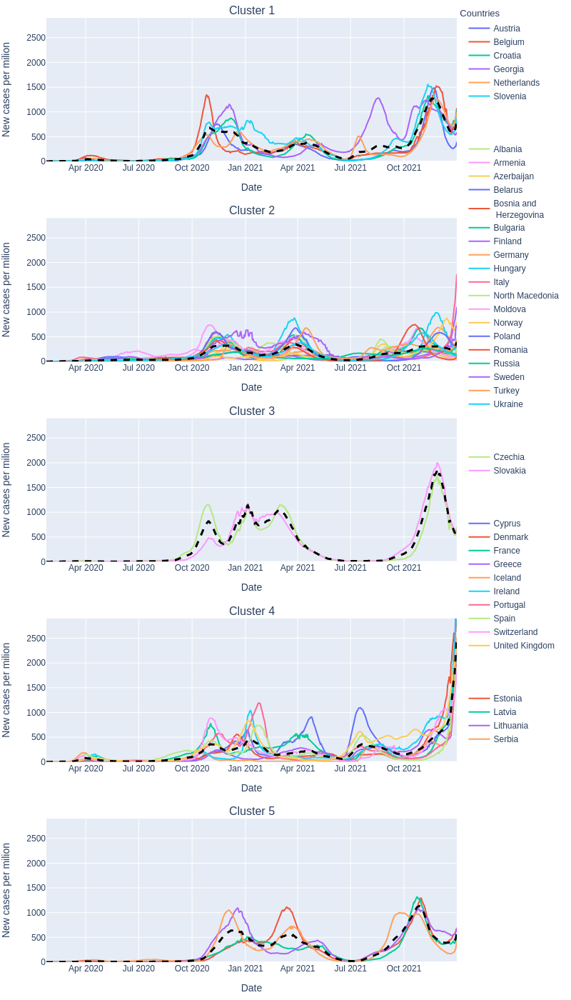

In [172]:
#@title
#n+1 number of clusters
n=4
print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
kmeans = KMeans(n_clusters=n+1, random_state=100).fit(pca_waves_df)
kmeans.labels_

clusters_list = []
#loop responsible for creating list of lists of countries splited by clustering and printing them
for iterator in range(n+1):
  print(f"Cluster {iterator+1}: ")
  cluster_list = []
  for iterator2, country in enumerate(data.index):
    if kmeans.labels_[iterator2] == iterator:
      cluster_list.append(country)
  print(cluster_list, end="\n")
  clusters_list.append(cluster_list)

clusters_list_km_pca_triangle = clusters_list.copy()


#setting choropleth parameters
config = dict(
  type = 'choropleth',
  locations = data.index.values,
  locationmode='country names',
  z=np.append(kmeans.labels_+1, n+1).astype(int),
  colorscale=[(0.00, "rgb(255, 196, 51)"),   (0.2, "rgb(255, 196, 51)"),
              (0.2, "rgb(255, 51, 119)"), (0.4, "rgb(255, 51, 119)"),
              (0.4, "rgb(219, 51, 255)"),  (0.6, "rgb(219, 51, 255)"),
              (0.6, "rgb(51, 189, 255)"),  (0.8, "rgb(51, 189, 255)"),
              (0.8, "rgb(51, 255, 53)"),  (1.0, "rgb(51, 255, 53)")],
  marker_line_color='black',
  marker_line_width=0.5,
  colorbar=dict(nticks=5, tickprefix='Cluster ')
  )

config_coloraxis=dict(
  tickvals=[el for el in range(1,n+2)], 
  title='Clusters', 
  ticks='outside'
  )

config_margin=dict(
  r=25, 
  t=25, 
  l=25,
  b=25
  )

#plotting first part of the figure
fig = go.Figure(data=[config])
fig.update_geos(scope='world', lataxis_showgrid=True, lonaxis_showgrid=True, 
                projection_type='mercator', lataxis_range=[40,75], lonaxis_range=[-30, 70], 
                lataxis_dtick=10, lonaxis_dtick=10, resolution=50)
fig.update_layout(height=350, width=500, margin=config_margin, 
                  coloraxis_colorbar=config_coloraxis, title='Division of map according to k-means clustering', title_y=0.97)
display(Image(fig.to_image()))

#setting legend title parameters(broken method)
config_title=dict(
  text='Countries', 
  x=0.875, 
  y=0.99,
  font_size=13, 
  font_family='Arial'
)

#plotting second part of the figure
fig2 = subplots.make_subplots(rows=int(n+1), cols=1, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], vertical_spacing=0.06)
for iterator, cluster in enumerate(clusters_list):
  #calculating mean for each cluster
  frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                      columns=['Mean'], index=europe_df_rolled.index)
  for country in cluster:
    #breaking long country names
    if country == 'Bosnia and Herzegovina':
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='Bosnia and<br> Herzegovina', legendgroup=iterator), row=int(iterator)+1, col=1)
    else:
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country, legendgroup=iterator), row=int(iterator)+1, col=1)
    fig2.update_xaxes(title_text='Date', row=int(iterator)+1, col=1)
    fig2.update_yaxes(title_text='New cases per milion', row=int(iterator)+1, col=1, range=[0,2900])
    
  #adding trace of mean
  fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', 
                            line=dict(color='black', width=3, dash='dash'), legendgroup=iterator, showlegend=False), 
                 row=int(iterator)+1, col=1)

    
fig2.update_layout(height=1400, width=800, margin=config_margin, legend_tracegroupgap=55, title=config_title)
display(Image(fig2.to_image()))

print("\n")

5 clusters: 
Cluster 1: 
['Austria', 'Belgium', 'Croatia', 'Georgia', 'Netherlands', 'Slovenia']
Cluster 2: 
['Cyprus', 'Denmark', 'France', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Portugal', 'Spain', 'Switzerland', 'United Kingdom']
Cluster 3: 
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Finland', 'Germany', 'Hungary', 'North Macedonia', 'Moldova', 'Norway', 'Poland', 'Romania', 'Russia', 'Sweden', 'Turkey', 'Ukraine']
Cluster 4: 
['Czechia', 'Slovakia']
Cluster 5: 
['Estonia', 'Latvia', 'Lithuania', 'Serbia']


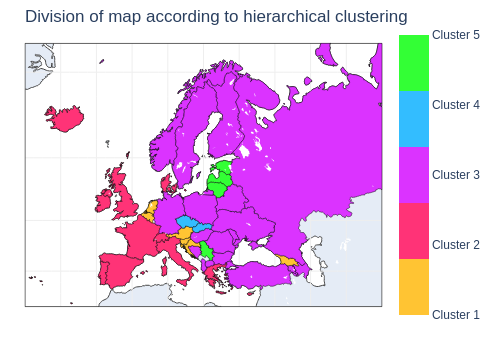

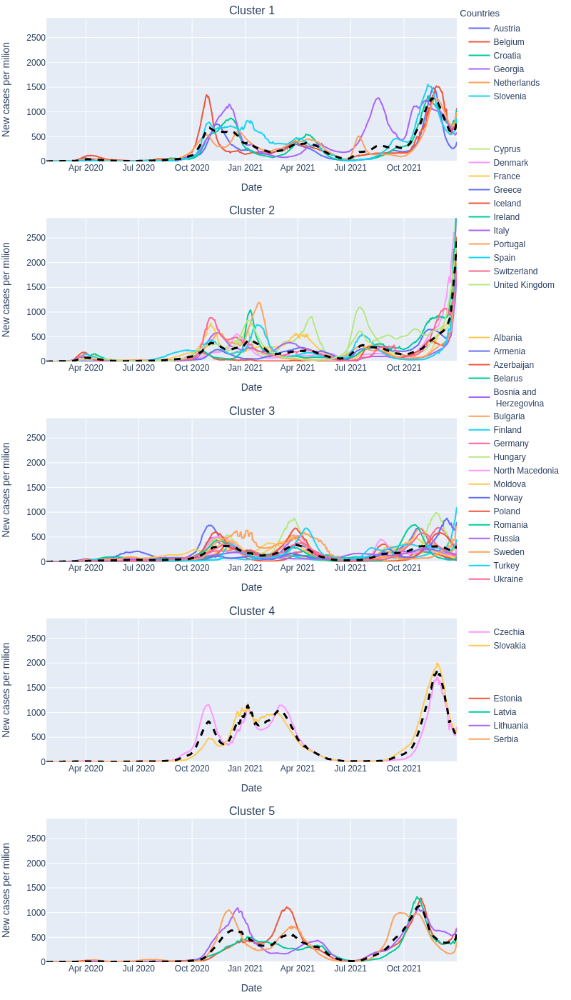

In [173]:
#@title
#n+1 number of clusters
n=4
print("\033[1m" + f"{n+1} clusters: " + "\033[0m")
kmeans = AgglomerativeClustering(n_clusters=n+1, linkage='ward', affinity='euclidean').fit(pca_waves_df)
kmeans.labels_

clusters_list = []
#loop responsible for creating list of lists of countries splited by clustering and printing them
for iterator in range(n+1):
  print(f"Cluster {iterator+1}: ")
  cluster_list = []
  for iterator2, country in enumerate(data.index):
    if kmeans.labels_[iterator2] == iterator:
      cluster_list.append(country)
  print(cluster_list, end="\n")
  clusters_list.append(cluster_list)


#setting choropleth parameters
config = dict(
  type = 'choropleth',
  locations = data.index.values,
  locationmode='country names',
  z=np.append(kmeans.labels_+1, n+1).astype(int),
  colorscale=[(0.00, "rgb(255, 196, 51)"),   (0.2, "rgb(255, 196, 51)"),
              (0.2, "rgb(255, 51, 119)"), (0.4, "rgb(255, 51, 119)"),
              (0.4, "rgb(219, 51, 255)"),  (0.6, "rgb(219, 51, 255)"),
              (0.6, "rgb(51, 189, 255)"),  (0.8, "rgb(51, 189, 255)"),
              (0.8, "rgb(51, 255, 53)"),  (1.0, "rgb(51, 255, 53)")],
  marker_line_color='black',
  marker_line_width=0.5,
  colorbar=dict(nticks=5, tickprefix='Cluster ')
  )

config_coloraxis=dict(
  tickvals=[el for el in range(1,n+2)], 
  title='Clusters', 
  ticks='outside'
  )

config_margin=dict(
  r=25, 
  t=25, 
  l=25,
  b=25
  )

#plotting first part of the figure
fig = go.Figure(data=[config])
fig.update_geos(scope='world', lataxis_showgrid=True, lonaxis_showgrid=True, 
                projection_type='mercator', lataxis_range=[40,75], lonaxis_range=[-30, 70], 
                lataxis_dtick=10, lonaxis_dtick=10, resolution=50)
fig.update_layout(height=350, width=500, margin=config_margin, 
                  coloraxis_colorbar=config_coloraxis, title='Division of map according to hierarchical clustering', title_y=0.97)
display(Image(fig.to_image()))

#setting legend title parameters(broken method)
config_title=dict(
  text='Countries', 
  x=0.875, 
  y=0.99,
  font_size=13, 
  font_family='Arial'
)

#plotting second part of the figure
fig2 = subplots.make_subplots(rows=int(n+1), cols=1, subplot_titles=[f"Cluster {iterator + 1}" for iterator in range(len(clusters_list))], vertical_spacing=0.06)
for iterator, cluster in enumerate(clusters_list):
  #calculating mean for each cluster
  frame = pd.DataFrame(np.mean(europe_df_rolled[cluster], axis=1), 
                      columns=['Mean'], index=europe_df_rolled.index)
  for country in cluster:
    #breaking long country names
    if country == 'Bosnia and Herzegovina':
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name='Bosnia and<br> Herzegovina', legendgroup=iterator), row=int(iterator)+1, col=1)
    else:
      fig2.add_trace(go.Scatter(x=europe_df_rolled.index, y=europe_df_rolled[country], name=country, legendgroup=iterator), row=int(iterator)+1, col=1)
    fig2.update_xaxes(title_text='Date', row=int(iterator)+1, col=1)
    fig2.update_yaxes(title_text='New cases per milion', row=int(iterator)+1, col=1, range=[0,2900])
    
  #adding trace of mean
  fig2.add_trace(go.Scatter(x=frame.index, y=frame['Mean'], name='Mean', 
                            line=dict(color='black', width=3, dash='dash'), legendgroup=iterator, showlegend=False), 
                 row=int(iterator)+1, col=1)

    
fig2.update_layout(height=1400, width=800, margin=config_margin, legend_tracegroupgap=55, title=config_title)
display(Image(fig2.to_image()))

print("\n")